In [1]:
import numpy
import numpy as np
import time
import datetime
import netCDF4
import matplotlib.pylab as plt
import os,sys,glob
sys.path.append(os.getcwd()+'/../adjust/rasotools/')
from utils import *
from multiprocessing import Pool
#import odb
from eccodes import *
from functools import partial
from collections import OrderedDict
import subprocess
import json
import gzip
# from retrieve_fb_jra55 import add_feedback
import copy
import pickle
import xarray as xr

import pandas as pd
import matplotlib
import matplotlib.pylab as plt
import matplotlib.pyplot as maplt
matplotlib.rcParams.update({'font.size': 20})

plt.rcParams['lines.linewidth'] = 3

import warnings
warnings.filterwarnings('ignore')

sys.path.append(os.getcwd()+'/../cds-backend/code/')
import cds_eua3 as eua
import trajectory_new as trj

import zarr
import dask
from timeit import default_timer as timer


In [2]:
def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return array[idx]

In [3]:
def vertical_interpolate(vcoord_data, interp_var, interp_levels):
    """A function to interpolate sounding data from each station to
    every millibar. Assumes a log-linear relationship.

    Input
    -----
    vcoord_data : A 1D array of vertical level values (e.g., pressure from a radiosonde)
    interp_var : A 1D array of the variable to be interpolated to all pressure levels
    vcoord_interp_levels : A 1D array containing veritcal levels to interpolate to

    Return
    ------
    interp_data : A 1D array that contains the interpolated variable on the interp_levels
    """

    # Make veritcal coordinate data and grid level log variables
    lnp = np.log(vcoord_data)
    lnp_intervals = np.log(interp_levels)

    # Use numpy to interpolate from observed levels to grid levels
    interp_data = np.interp(lnp_intervals[::-1], lnp[::-1], interp_var[::-1])[::-1]

    # Mask for missing data (generally only near the surface)
    mask_low = interp_levels > vcoord_data[0]
    mask_high = interp_levels < vcoord_data[-1]
    interp_data[mask_low] = interp_var[0]
    interp_data[mask_high] = interp_var[-1]

    return interp_data


2020-03-01 23:32:02
model predict 0.0037849261425435543
open t.zarr 0.20019208127632737
read t 0.7430069171823561


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[204.43090904]],

       [[211.28419736]],

       [[214.49890061]],

       [[218.40190415]],

       [[223.08250114]],

       [[228.48204232]],

       [[233.29383632]],

       [[236.68140528]],

       [[239.82497252]],

       [[242.04161034]],

...

       [[278.45512564]],

       [[278.57067676]],

       [[278.68221039]],

       [[278.81883252]],

       [[278.98438743]],

       [[279.1723798 ]],

       [[279.37642511]],

       [[279.56958104]],

       [[279.68910484]],

       [[279.76612621]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-02
    valid_time        datetime64[ns] 2020-03-02
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.19461550377309322
read lnsp 0.20696784695610404
get pv 0.11815974302589893
lat:  48.24895 lon:  16.35718
11035
2020-03-02 00:32:02
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.2000000000000004e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.000136
2020-03-02 23:29:56
model predict 0.002745838835835457
open t.zarr 0.1666522049345076
read t 0.1897855312563479


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[198.40316181]],

       [[207.72419645]],

       [[212.69879895]],

       [[215.7355459 ]],

       [[219.47504001]],

       [[223.38658498]],

       [[228.21711601]],

       [[233.64349554]],

       [[237.48152622]],

       [[240.1957403 ]],

...

       [[282.7988653 ]],

       [[283.0378465 ]],

       [[283.22035716]],

       [[283.39152908]],

       [[283.55249093]],

       [[283.69919444]],

       [[283.81720141]],

       [[283.90764257]],

       [[283.9751139 ]],

       [[283.93302905]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-03
    valid_time        datetime64[ns] 2020-03-03
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.29384498530998826
read lnsp 0.1873022373765707
get pv 0.06064030807465315
lat:  48.24895 lon:  16.35718
11035
2020-03-03 00:29:56
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.2000000000000004e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.000136
2020-03-03 23:30:21
model predict 0.002681352663785219
open t.zarr 0.21989039797335863
read t 0.12975864624604583


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[202.28657752]],

       [[210.46867209]],

       [[212.4728599 ]],

       [[209.32031123]],

       [[207.94840128]],

       [[214.23244367]],

       [[223.22261165]],

       [[231.17994912]],

       [[236.72531586]],

       [[240.56394263]],

...

       [[276.46260106]],

       [[276.66935035]],

       [[276.8582355 ]],

       [[277.04280538]],

       [[277.21889694]],

       [[277.38585891]],

       [[277.54027217]],

       [[277.68318515]],

       [[277.80575025]],

       [[277.87060981]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-04
    valid_time        datetime64[ns] 2020-03-04
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.13863667380064726
read lnsp 0.2384200608357787
get pv 0.075923559255898
lat:  48.24888 lon:  16.35713
11035
2020-03-04 00:30:21
phys lat_d [0]:  0.0
ml lat_d [0]:  -5.8888888888888896e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -7.888888888888891e-05
2020-03-04 23:30:10
model predict 0.003213286865502596
open t.zarr 0.277190166991204
read t 0.18861691700294614


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[194.36928066]],

       [[198.79488273]],

       [[201.81041999]],

       [[206.23064054]],

       [[210.4712724 ]],

       [[218.25438503]],

       [[227.18396498]],

       [[232.23079673]],

       [[234.611004  ]],

       [[237.94909345]],

...

       [[277.46027895]],

       [[277.67275594]],

       [[277.77790671]],

       [[277.78005772]],

       [[277.73381786]],

       [[277.64771958]],

       [[277.59163534]],

       [[277.3931783 ]],

       [[277.04826632]],

       [[276.33333908]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-05
    valid_time        datetime64[ns] 2020-03-05
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.14794837776571512
read lnsp 0.24502346199005842
get pv 0.07930019032210112
lat:  48.24895 lon:  16.35718
11035
2020-03-05 00:30:10
phys lat_d [0]:  0.0
ml lat_d [0]:  -5.8888888888888896e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -7.888888888888891e-05
2020-03-05 23:31:37
model predict 0.0036399662494659424
open t.zarr 0.13181278621777892
read t 0.18023155815899372


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[190.06008114]],

       [[203.01668887]],

       [[210.4760396 ]],

       [[216.16270302]],

       [[220.31616434]],

       [[223.95545751]],

       [[227.26309612]],

       [[229.7652161 ]],

       [[232.34618214]],

       [[233.46040086]],

...

       [[277.88719566]],

       [[278.13821408]],

       [[278.31823926]],

       [[278.5042757 ]],

       [[278.66348513]],

       [[278.84246351]],

       [[278.99186393]],

       [[279.09954423]],

       [[279.16065286]],

       [[279.13678779]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-06
    valid_time        datetime64[ns] 2020-03-06
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.18105219304561615
read lnsp 0.29548043524846435
get pv 0.1188161438331008
lat:  48.24895 lon:  16.35718
11035
2020-03-06 00:31:37
phys lat_d [0]:  0.0
ml lat_d [0]:  -2.3333333333333336e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  5.444444444444445e-05
2020-03-06 23:30:22
model predict 0.002850513905286789
open t.zarr 0.17010804871097207
read t 0.1633408428169787


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[192.8956751 ]],

       [[202.33140367]],

       [[208.06987286]],

       [[213.60885722]],

       [[218.56780511]],

       [[223.51086685]],

       [[227.72818122]],

       [[230.61412739]],

       [[233.48035857]],

       [[237.51809449]],

...

       [[278.31583836]],

       [[278.61464418]],

       [[278.87547369]],

       [[279.0656303 ]],

       [[279.20964686]],

       [[279.26947527]],

       [[279.26316959]],

       [[279.20481497]],

       [[279.03761835]],

       [[278.56572911]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-07
    valid_time        datetime64[ns] 2020-03-07
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.16294888965785503
read lnsp 0.2553907469846308
get pv 0.05982376076281071
lat:  48.24895 lon:  16.35718
11035
2020-03-07 00:30:22
phys lat_d [0]:  0.0
ml lat_d [0]:  4.6250000000000006e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00011875000000000003
2020-03-07 23:30:38
model predict 0.0031666532158851624
open t.zarr 0.22306555695831776
read t 0.3024823940359056


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[195.18317852]],

       [[203.47097223]],

       [[206.01578598]],

       [[208.7263511 ]],

       [[213.02132606]],

       [[217.7803377 ]],

       [[222.48850319]],

       [[228.06044859]],

       [[234.00033908]],

       [[239.46632032]],

...

       [[276.12283891]],

       [[276.30707622]],

       [[276.4636296 ]],

       [[276.57041482]],

       [[276.65503339]],

       [[276.71378067]],

       [[276.75465872]],

       [[276.76899915]],

       [[276.74127682]],

       [[276.60355915]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-08
    valid_time        datetime64[ns] 2020-03-08
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.1461845375597477
read lnsp 0.19212907133623958
get pv 0.0717762759886682
lat:  48.24895 lon:  16.35718
11035
2020-03-08 00:30:38
phys lat_d [0]:  0.0
ml lat_d [0]:  -5.8888888888888896e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -7.888888888888891e-05
2020-03-08 23:30:26
model predict 0.0032539130188524723
open t.zarr 0.24638477293774486
read t 0.17634562123566866


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[194.99061427]],

       [[201.74604349]],

       [[207.17169146]],

       [[212.47937721]],

       [[215.98066069]],

       [[219.55790353]],

       [[224.81579893]],

       [[230.85620789]],

       [[233.3809662 ]],

       [[235.28193302]],

...

       [[278.03670254]],

       [[278.18312509]],

       [[278.15795425]],

       [[278.10539731]],

       [[277.99638722]],

       [[277.84564129]],

       [[277.63880612]],

       [[277.23762886]],

       [[276.58202444]],

       [[275.69436512]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-09
    valid_time        datetime64[ns] 2020-03-09
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.21896439604461193
read lnsp 0.3110740929841995
get pv 0.047726531978696585
lat:  48.24895 lon:  16.35718
11035
2020-03-09 00:30:26
phys lat_d [0]:  0.0
ml lat_d [0]:  4.6250000000000006e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00011875000000000003
2020-03-09 23:31:38
model predict 0.0025977608747780323
open t.zarr 0.18980015674605966
read t 0.27675285330042243


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[186.57844351]],

       [[198.55642189]],

       [[204.91504781]],

       [[212.01726582]],

       [[217.8519674 ]],

       [[221.49772339]],

       [[223.53378114]],

       [[226.36705711]],

       [[233.1485909 ]],

       [[239.41773859]],

...

       [[279.29542944]],

       [[279.42649648]],

       [[279.50053694]],

       [[279.51907449]],

       [[279.49179536]],

       [[279.41976355]],

       [[279.3348673 ]],

       [[279.25040842]],

       [[279.12214923]],

       [[278.89149231]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-10
    valid_time        datetime64[ns] 2020-03-10
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.1366024217568338
read lnsp 0.1843957439996302
get pv 0.09386536525562406
lat:  48.24895 lon:  16.35718
11035
2020-03-10 00:31:38
phys lat_d [0]:  0.0
ml lat_d [0]:  -5.8888888888888896e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -7.888888888888891e-05
2020-03-10 23:30:19
model predict 0.0036877947859466076
open t.zarr 0.1929472740739584
read t 0.18366196006536484


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[190.87836444]],

       [[197.95883889]],

       [[203.9304383 ]],

       [[210.55798851]],

       [[215.67032647]],

       [[218.54277309]],

       [[222.07086664]],

       [[227.68258608]],

       [[236.32729288]],

       [[244.6880395 ]],

...

       [[281.16355136]],

       [[281.3538786 ]],

       [[281.51455354]],

       [[281.71648516]],

       [[281.8360777 ]],

       [[281.95468326]],

       [[282.04780335]],

       [[282.11407429]],

       [[282.14857855]],

       [[282.1180624 ]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-11
    valid_time        datetime64[ns] 2020-03-11
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.15175985684618354
read lnsp 0.1974624888971448
get pv 0.12037271494045854
lat:  48.24895 lon:  16.35718
11035
2020-03-11 00:30:19
phys lat_d [0]:  0.0
ml lat_d [0]:  4.6250000000000006e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00011875000000000003
2020-03-11 23:33:59
model predict 0.0026230369694530964
open t.zarr 0.1626703506335616
read t 0.12697961134836078


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[196.12766482]],

       [[204.92129209]],

       [[210.03301514]],

       [[213.63230188]],

       [[216.54592532]],

       [[220.53038726]],

       [[225.63257664]],

       [[231.64408783]],

       [[238.06793655]],

       [[243.54901451]],

...

       [[286.2363159 ]],

       [[286.49783689]],

       [[286.69713734]],

       [[286.84377068]],

       [[286.93067953]],

       [[286.97238286]],

       [[286.92862218]],

       [[286.80334545]],

       [[286.6307431 ]],

       [[286.32211274]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-12
    valid_time        datetime64[ns] 2020-03-12
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.2860449240542948
read lnsp 0.1772599439136684
get pv 0.14914482971653342
lat:  48.24884 lon:  16.35758
11035
2020-03-12 00:33:59
phys lat_d [0]:  0.0
ml lat_d [0]:  4.6250000000000006e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00011875000000000003
2020-03-12 23:30:38
model predict 0.003006794024258852
open t.zarr 0.17534764809533954
read t 0.18673216784372926


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[192.23909526]],

       [[202.09970165]],

       [[210.32219663]],

       [[219.97459859]],

       [[225.78798969]],

       [[225.98195423]],

       [[226.12600258]],

       [[230.43238358]],

       [[236.12161499]],

       [[240.54691324]],

...

       [[283.2734713 ]],

       [[283.53015525]],

       [[283.7803113 ]],

       [[283.95810476]],

       [[284.07082083]],

       [[284.11500165]],

       [[284.10631599]],

       [[284.03900043]],

       [[283.78210105]],

       [[283.26344598]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-13
    valid_time        datetime64[ns] 2020-03-13
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.17592646786943078
read lnsp 0.22999798087403178
get pv 0.10599836613982916
lat:  48.24895 lon:  16.35718
11035
2020-03-13 00:30:38
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.000000000000001e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00023600000000000002
2020-03-13 23:30:44
model predict 0.00306117907166481
open t.zarr 0.40565743297338486
read t 0.20512812584638596


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[195.62267303]],

       [[206.64197835]],

       [[212.05367685]],

       [[216.72182815]],

       [[222.35009076]],

       [[226.55480428]],

       [[227.86198729]],

       [[227.58041931]],

       [[231.58954589]],

       [[237.50482745]],

...

       [[279.24163713]],

       [[279.50757586]],

       [[279.68033288]],

       [[279.77909778]],

       [[279.7961952 ]],

       [[279.74391361]],

       [[279.5959569 ]],

       [[279.26906474]],

       [[278.71127689]],

       [[277.7395356 ]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-14
    valid_time        datetime64[ns] 2020-03-14
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.2120375889353454
read lnsp 0.22826742473989725
get pv 0.12554041994735599
lat:  48.24895 lon:  16.35718
11035
2020-03-14 00:30:44
phys lat_d [0]:  0.0
ml lat_d [0]:  4.6250000000000006e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00011875000000000003
2020-03-14 23:30:13
model predict 0.00275631807744503
open t.zarr 0.1487008729018271
read t 0.1449104999192059


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[194.72063467]],

       [[206.98478606]],

       [[212.57016511]],

       [[217.3754031 ]],

       [[222.11444108]],

       [[225.47830405]],

       [[227.1257337 ]],

       [[230.71353646]],

       [[236.56212067]],

       [[242.68601739]],

...

       [[274.2580154 ]],

       [[274.39514469]],

       [[274.47725788]],

       [[274.5430892 ]],

       [[274.58973338]],

       [[274.61769667]],

       [[274.62887641]],

       [[274.60193547]],

       [[274.48371796]],

       [[274.13868382]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-15
    valid_time        datetime64[ns] 2020-03-15
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.1611338583752513
read lnsp 0.17974218633025885
get pv 0.10083547187969089
lat:  48.24895 lon:  16.35718
11035
2020-03-15 00:30:13
phys lat_d [0]:  0.0
ml lat_d [0]:  -6.2e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  1.4000000000000005e-05
2020-03-15 23:31:24
model predict 0.0033213868737220764
open t.zarr 0.2728048418648541
read t 0.15590395219624043


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[196.43055379]],

       [[209.04645676]],

       [[213.94080374]],

       [[217.37449062]],

       [[220.42487455]],

       [[222.47175326]],

       [[225.61597547]],

       [[231.7664347 ]],

       [[238.49915717]],

       [[244.7950767 ]],

...

       [[275.37961044]],

       [[275.48045186]],

       [[275.58071688]],

       [[275.68146855]],

       [[275.7709021 ]],

       [[275.85905714]],

       [[275.93063811]],

       [[275.9726257 ]],

       [[275.97832392]],

       [[275.89985537]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-16
    valid_time        datetime64[ns] 2020-03-16
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.13692174525931478
read lnsp 0.18089144118130207
get pv 0.0597577840089798
lat:  48.24895 lon:  16.35718
11035
2020-03-16 00:31:24
phys lat_d [0]:  0.0
ml lat_d [0]:  -2.3333333333333336e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  5.444444444444445e-05
2020-03-16 23:30:14
model predict 0.0028243488632142544
open t.zarr 0.1865265923552215
read t 0.1541590066626668


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[198.79932589]],

       [[209.85929168]],

       [[214.38889607]],

       [[215.05124152]],

       [[216.27823118]],

       [[219.32225017]],

       [[223.59620945]],

       [[229.14852494]],

       [[236.02346062]],

       [[242.9932843 ]],

...

       [[281.31228611]],

       [[281.06617661]],

       [[280.79430942]],

       [[280.53574313]],

       [[280.29490144]],

       [[280.03353346]],

       [[279.69439187]],

       [[279.27592612]],

       [[278.70765056]],

       [[277.54616976]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-17
    valid_time        datetime64[ns] 2020-03-17
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.2830703826621175
read lnsp 0.21716486476361752
get pv 0.09452460799366236
lat:  48.24895 lon:  16.35718
11035
2020-03-17 00:30:14
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.000000000000001e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00023600000000000002
2020-03-17 23:30:52
model predict 0.0029942411929368973
open t.zarr 0.2129136510193348
read t 0.15732538979500532


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[198.54198105]],

       [[211.27432946]],

       [[215.82824794]],

       [[215.92461229]],

       [[216.31651348]],

       [[218.78898332]],

       [[224.26261417]],

       [[230.97786499]],

       [[237.50122587]],

       [[243.63731991]],

...

       [[284.49790206]],

       [[284.40751608]],

       [[284.1754771 ]],

       [[283.86431141]],

       [[283.57353304]],

       [[283.33268245]],

       [[283.14368524]],

       [[282.82288896]],

       [[282.29883129]],

       [[281.47548636]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-18
    valid_time        datetime64[ns] 2020-03-18
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.11901592323556542
read lnsp 0.1688082916662097
get pv 0.07412481866776943
lat:  48.24895 lon:  16.35718
11035
2020-03-18 00:30:52
phys lat_d [0]:  0.0
ml lat_d [0]:  -5.8888888888888896e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -7.888888888888891e-05
2020-03-18 23:30:25
model predict 0.0029261098243296146
open t.zarr 0.2496621711179614
read t 0.3095745728351176


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[193.49659819]],

       [[206.4265148 ]],

       [[211.88098217]],

       [[213.45410918]],

       [[215.36311089]],

       [[218.34257669]],

       [[224.62406691]],

       [[232.51002205]],

       [[239.14450268]],

       [[245.4280758 ]],

...

       [[286.7337256 ]],

       [[286.7993174 ]],

       [[286.81516352]],

       [[286.81406994]],

       [[286.79000313]],

       [[286.70686041]],

       [[286.45991433]],

       [[285.63973784]],

       [[283.90930697]],

       [[281.71939981]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-19
    valid_time        datetime64[ns] 2020-03-19
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.15479881362989545
read lnsp 0.19260930502787232
get pv 0.07666632812470198
lat:  48.24895 lon:  16.35718
11035
2020-03-19 00:30:25
phys lat_d [0]:  0.0
ml lat_d [0]:  -6.249999999999996e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  -0.00017250000000000005
2020-03-19 23:30:43
model predict 0.003362355288118124
open t.zarr 0.17290770029649138
read t 0.19602188374847174


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[190.40478617]],

       [[203.34416117]],

       [[208.00153851]],

       [[211.33152535]],

       [[215.59811348]],

       [[220.5501476 ]],

       [[226.33231136]],

       [[232.47702134]],

       [[238.58505035]],

       [[244.78215189]],

...

       [[287.30770269]],

       [[287.44133283]],

       [[287.51496083]],

       [[287.51052465]],

       [[287.40223837]],

       [[287.16068753]],

       [[286.70447277]],

       [[285.94327362]],

       [[284.74930371]],

       [[283.11972095]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-20
    valid_time        datetime64[ns] 2020-03-20
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.14786189701408148
read lnsp 0.33383659832179546
get pv 0.08885555621236563
lat:  48.24895 lon:  16.35718
11035
2020-03-20 00:30:43
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.000000000000001e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00023600000000000002
2020-03-20 23:30:43
model predict 0.0032791891135275364
open t.zarr 0.2682729987427592
read t 0.16417598398402333


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[192.21296478]],

       [[202.05301342]],

       [[208.66429731]],

       [[213.36800235]],

       [[217.22523891]],

       [[221.52840087]],

       [[227.20127057]],

       [[233.29461448]],

       [[239.07834906]],

       [[243.33285336]],

...

       [[284.57668246]],

       [[284.34116928]],

       [[284.09254151]],

       [[283.93615555]],

       [[283.78721845]],

       [[283.7077484 ]],

       [[283.58676893]],

       [[283.3671432 ]],

       [[283.11133052]],

       [[282.70498775]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-21
    valid_time        datetime64[ns] 2020-03-21
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.20705240592360497
read lnsp 0.2248335969634354
get pv 0.06570788193494081
lat:  48.24895 lon:  16.35718
11035
2020-03-21 00:30:43
phys lat_d [0]:  0.0
ml lat_d [0]:  -6.2e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  1.4000000000000005e-05
2020-03-21 23:30:06
model predict 0.0035474877804517746
open t.zarr 0.2793853636831045
read t 0.31901093712076545


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[193.72087746]],

       [[203.26145701]],

       [[209.52832693]],

       [[214.36240746]],

       [[218.08057211]],

       [[222.20972275]],

       [[226.61539681]],

       [[232.5494014 ]],

       [[238.75479354]],

       [[243.55434935]],

...

       [[272.75415881]],

       [[273.07841591]],

       [[273.38266571]],

       [[273.65111242]],

       [[273.88765641]],

       [[274.09887287]],

       [[274.28512147]],

       [[274.4233088 ]],

       [[274.5446144 ]],

       [[274.57824803]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-22
    valid_time        datetime64[ns] 2020-03-22
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.1459494959563017
read lnsp 0.20746030425652862
get pv 0.10525557305663824
lat:  48.24895 lon:  16.35718
11035
2020-03-22 00:30:06
phys lat_d [0]:  0.0
ml lat_d [0]:  -6.2e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  1.4000000000000005e-05
2020-03-22 23:36:23
model predict 0.002879322972148657
open t.zarr 0.21763887768611312
read t 0.3040327117778361


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[196.69407848]],

       [[201.94108869]],

       [[208.07956522]],

       [[212.01823747]],

       [[214.42279255]],

       [[219.8219652 ]],

       [[227.36914469]],

       [[234.75858741]],

       [[241.23125883]],

       [[245.96184657]],

...

       [[269.17852845]],

       [[269.4641473 ]],

       [[269.71886724]],

       [[269.94879238]],

       [[270.14964912]],

       [[270.32576483]],

       [[270.47547695]],

       [[270.59529472]],

       [[270.68356532]],

       [[270.69072313]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-23
    valid_time        datetime64[ns] 2020-03-23
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.1701543410308659
read lnsp 0.1948773399926722
get pv 0.06462176004424691
lat:  48.24895 lon:  16.35718
11035
2020-03-23 00:36:23
phys lat_d [0]:  0.0
ml lat_d [0]:  -5.8888888888888896e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -7.888888888888891e-05
2020-03-23 23:30:25
model predict 0.0025133490562438965
open t.zarr 0.1819799840450287
read t 0.15738611621782184


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[197.04832548]],

       [[201.55577717]],

       [[206.61986261]],

       [[210.67684107]],

       [[214.62825793]],

       [[220.94024128]],

       [[228.96931281]],

       [[236.22116737]],

       [[242.00979986]],

       [[246.82755835]],

...

       [[270.81745809]],

       [[271.06086367]],

       [[271.27904069]],

       [[271.46619304]],

       [[271.6205821 ]],

       [[271.75261125]],

       [[271.86311292]],

       [[271.94413467]],

       [[271.99401385]],

       [[271.97193178]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-24
    valid_time        datetime64[ns] 2020-03-24
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.16238092491403222
read lnsp 0.38361990405246615
get pv 0.13107066182419658
lat:  48.24889 lon:  16.35729
11035
2020-03-24 00:30:25
phys lat_d [0]:  0.0
ml lat_d [0]:  -6.2e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  1.4000000000000005e-05
2020-03-24 23:31:27
model predict 0.0026061581447720528
open t.zarr 0.2618963518179953
read t 0.13464971212670207


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[194.4083542 ]],

       [[200.72198472]],

       [[207.21755788]],

       [[212.43502158]],

       [[218.16692233]],

       [[221.64195885]],

       [[228.69585206]],

       [[236.12325235]],

       [[241.76624419]],

       [[246.52714986]],

...

       [[273.14276394]],

       [[273.27777802]],

       [[273.34037692]],

       [[273.35123203]],

       [[273.33545596]],

       [[273.31637439]],

       [[273.27422965]],

       [[273.17961583]],

       [[273.00599149]],

       [[272.68158625]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-25
    valid_time        datetime64[ns] 2020-03-25
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.17892472120001912
read lnsp 0.160536945797503
get pv 0.05360468290746212
lat:  48.24895 lon:  16.35718
11035
2020-03-25 00:31:27
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.000000000000001e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00023600000000000002
2020-03-25 23:30:14
model predict 0.002640369813889265
open t.zarr 0.2827205266803503
read t 0.16471126163378358


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[197.00877908]],

       [[207.6777044 ]],

       [[212.26391606]],

       [[214.18621521]],

       [[218.07483917]],

       [[222.58641684]],

       [[229.47656342]],

       [[236.73749166]],

       [[243.05730763]],

       [[248.75633235]],

...

       [[272.56031175]],

       [[272.80060735]],

       [[272.97553623]],

       [[273.0661045 ]],

       [[273.11787314]],

       [[273.10485947]],

       [[273.06851619]],

       [[273.03505717]],

       [[272.97820299]],

       [[272.83526565]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-26
    valid_time        datetime64[ns] 2020-03-26
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.12917721923440695
read lnsp 0.17383067915216088
get pv 0.06119673186913133
lat:  48.24895 lon:  16.35718
11035
2020-03-26 00:30:14
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.000000000000001e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00023600000000000002
2020-03-26 23:30:21
model predict 0.002511710859835148
open t.zarr 0.1649334761314094
read t 0.15907464176416397


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[198.13081159]],

       [[208.00778796]],

       [[213.40432205]],

       [[216.55652483]],

       [[220.60349566]],

       [[226.7420913 ]],

       [[231.65556918]],

       [[237.3741148 ]],

       [[243.47394036]],

       [[249.09252375]],

...

       [[281.14470694]],

       [[281.25643234]],

       [[281.34478798]],

       [[281.40884947]],

       [[281.4449028 ]],

       [[281.44641571]],

       [[281.3930365 ]],

       [[281.20730502]],

       [[280.78557881]],

       [[279.89257876]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-27
    valid_time        datetime64[ns] 2020-03-27
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.27036852901801467
read lnsp 0.1916403123177588
get pv 0.1031481260433793
lat:  48.24895 lon:  16.35718
11035
2020-03-27 00:30:21
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.000000000000001e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00023600000000000002
2020-03-27 23:30:50
model predict 0.0030313897877931595
open t.zarr 0.19441853184252977
read t 0.16378030367195606


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[197.16105709]],

       [[207.62107424]],

       [[213.49190391]],

       [[217.6361437 ]],

       [[218.6788236 ]],

       [[223.0136186 ]],

       [[229.55361573]],

       [[237.2115019 ]],

       [[244.75116085]],

       [[250.78176905]],

...

       [[285.07744088]],

       [[285.44530109]],

       [[285.75008806]],

       [[285.97395044]],

       [[286.11434227]],

       [[286.16012116]],

       [[286.02045258]],

       [[285.53456756]],

       [[284.17999834]],

       [[280.15816883]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-28
    valid_time        datetime64[ns] 2020-03-28
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.15921265678480268
read lnsp 0.3266023937612772
get pv 0.06628925213590264
lat:  48.24895 lon:  16.35718
11035
2020-03-28 00:30:50
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.000000000000001e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00023600000000000002
2020-03-28 23:30:18
model predict 0.003108430653810501
open t.zarr 0.1771685490384698
read t 0.27652890095487237


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[195.90231448]],

       [[210.05985615]],

       [[220.03442515]],

       [[220.66381877]],

       [[212.75778855]],

       [[206.77955057]],

       [[224.88772998]],

       [[239.56615535]],

       [[247.20855836]],

       [[250.3398557 ]],

...

       [[283.74158994]],

       [[283.72473108]],

       [[283.63229815]],

       [[283.49579736]],

       [[283.37096833]],

       [[283.25992645]],

       [[283.17003487]],

       [[282.94714518]],

       [[282.47314104]],

       [[281.7395468 ]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-29
    valid_time        datetime64[ns] 2020-03-29
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.13562089391052723
read lnsp 0.21885479101911187
get pv 0.2918694131076336
lat:  48.24895 lon:  16.35718
11035
2020-03-29 00:30:18
phys lat_d [0]:  0.0
ml lat_d [0]:  -5.8888888888888896e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -7.888888888888891e-05
2020-03-29 23:30:53
model predict 0.0031661749817430973
open t.zarr 0.19380971603095531
read t 0.15287440922111273


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[193.09973215]],

       [[207.5949405 ]],

       [[213.88355877]],

       [[217.47488585]],

       [[217.72977474]],

       [[224.5517252 ]],

       [[229.90414441]],

       [[237.65974266]],

       [[243.28145263]],

       [[249.71835307]],

...

       [[274.98643705]],

       [[275.38919668]],

       [[275.77724276]],

       [[276.09462062]],

       [[276.38930641]],

       [[276.66099545]],

       [[276.91536612]],

       [[277.11409418]],

       [[277.30574715]],

       [[277.44149039]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-30
    valid_time        datetime64[ns] 2020-03-30
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.24026109697297215
read lnsp 0.19961704825982451
get pv 0.07450972171500325
lat:  48.24895 lon:  16.35718
11035
2020-03-30 00:30:53
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.000000000000001e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00023600000000000002
2020-03-30 23:30:11
model predict 0.002819045912474394
open t.zarr 0.1709619229659438
read t 0.13282300904393196


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[190.76091996]],

       [[203.73078794]],

       [[211.55291164]],

       [[217.13092886]],

       [[220.47567931]],

       [[222.35241669]],

       [[230.31017867]],

       [[239.32003338]],

       [[245.3330591 ]],

       [[248.5351761 ]],

...

       [[272.81374809]],

       [[273.09047454]],

       [[273.32639512]],

       [[273.51629666]],

       [[273.67395577]],

       [[273.77943857]],

       [[273.83336852]],

       [[273.79847169]],

       [[273.56288309]],

       [[272.66667939]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-31
    valid_time        datetime64[ns] 2020-03-31
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.15526462625712156
read lnsp 0.3096537562087178
get pv 0.09489116910845041
lat:  48.24895 lon:  16.35718
11035
2020-03-31 00:30:11
phys lat_d [0]:  0.0
ml lat_d [0]:  -1.3333333333333328e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00023333333333333333
2020-03-31 23:29:47
model predict 0.003428247757256031
open t.zarr 0.17223712895065546
read t 0.3324765139259398


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[190.87191439]],

       [[203.08241985]],

       [[210.11084783]],

       [[213.93890414]],

       [[220.52327283]],

       [[228.15759819]],

       [[231.87347861]],

       [[231.89854558]],

       [[238.03313458]],

       [[244.70640055]],

...

       [[271.77568392]],

       [[271.85371731]],

       [[271.91510134]],

       [[271.95852662]],

       [[271.99476103]],

       [[272.01727983]],

       [[272.01876904]],

       [[271.937131  ]],

       [[271.70529897]],

       [[271.23061708]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-04-01
    valid_time        datetime64[ns] 2020-04-01
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.14869175385683775
read lnsp 0.19526760187000036
get pv 0.10368978697806597
lat:  48.24895 lon:  16.35718
11035
2020-04-01 00:29:47
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.000000000000001e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00023600000000000002
2020-06-01 23:30:45
model predict 0.0027885898016393185
open t.zarr 0.15092487400397658
read t 0.14558252785354853


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[181.15140199]],

       [[187.36206984]],

       [[191.21872143]],

       [[196.85237464]],

       [[205.1730602 ]],

       [[216.00663766]],

       [[225.50368769]],

       [[233.72346295]],

       [[240.07455711]],

       [[246.10444111]],

...

       [[287.69191041]],

       [[287.87124893]],

       [[287.98701534]],

       [[288.01887269]],

       [[287.98951626]],

       [[287.91096219]],

       [[287.78836523]],

       [[287.58147116]],

       [[287.1776289 ]],

       [[286.35142132]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-02
    valid_time        datetime64[ns] 2020-06-02
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.2741738623008132
read lnsp 0.2120816931128502
get pv 0.11913411598652601
lat:  48.24901 lon:  16.35721
11035
2020-06-02 00:30:45
phys lat_d [0]:  0.0
ml lat_d [0]:  -5.8888888888888896e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -7.888888888888891e-05
2020-06-02 23:30:38
model predict 0.0030125309713184834
open t.zarr 0.1846454506739974
read t 0.10665382398292422


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[182.88541861]],

       [[189.12422109]],

       [[195.09966238]],

       [[203.33551766]],

       [[211.44212427]],

       [[217.55166361]],

       [[224.86842545]],

       [[232.21964883]],

       [[238.99101858]],

       [[245.79372022]],

...

       [[285.39749262]],

       [[285.52291035]],

       [[285.6272297 ]],

       [[285.71390003]],

       [[285.75759576]],

       [[285.77628998]],

       [[285.77245732]],

       [[285.74297965]],

       [[285.69804687]],

       [[285.5637813 ]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-03
    valid_time        datetime64[ns] 2020-06-03
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.24032624810934067
read lnsp 0.24615937797352672
get pv 0.12998367799445987
lat:  48.24895 lon:  16.35718
11035
2020-06-03 00:30:38
phys lat_d [0]:  0.0
ml lat_d [0]:  4.6250000000000006e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00011875000000000003
2020-06-03 23:32:54
model predict 0.003742665983736515
open t.zarr 0.1838363567367196
read t 0.12578851683065295


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[184.46598138]],

       [[192.32010909]],

       [[195.60076895]],

       [[201.71321954]],

       [[209.68482705]],

       [[217.90817239]],

       [[225.634726  ]],

       [[232.83635082]],

       [[240.46931741]],

       [[248.30526753]],

...

       [[290.4767366 ]],

       [[290.42360486]],

       [[290.26802641]],

       [[290.00739076]],

       [[289.72471309]],

       [[289.290166  ]],

       [[288.65877654]],

       [[287.67927908]],

       [[286.88902447]],

       [[286.13530177]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-04
    valid_time        datetime64[ns] 2020-06-04
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.20713786408305168
read lnsp 0.30439425026997924
get pv 0.0799566712230444
lat:  48.24895 lon:  16.35718
11035
2020-06-04 00:32:54
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.2000000000000004e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.000136
2020-06-04 23:32:45
model predict 0.003207154106348753
open t.zarr 0.14315171027556062
read t 0.22078535612672567


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[175.59767301]],

       [[187.46066511]],

       [[192.70440569]],

       [[200.4600911 ]],

       [[209.02233901]],

       [[217.90446043]],

       [[224.75206635]],

       [[231.71389182]],

       [[239.72096536]],

       [[248.01684782]],

...

       [[288.96006658]],

       [[289.2945663 ]],

       [[289.58504149]],

       [[289.8224617 ]],

       [[289.99203967]],

       [[290.12062717]],

       [[290.19186023]],

       [[290.2156898 ]],

       [[290.17089324]],

       [[289.96317002]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-05
    valid_time        datetime64[ns] 2020-06-05
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.14123958488926291
read lnsp 0.21458713011816144
get pv 0.06372576719149947
lat:  48.24895 lon:  16.35718
11035
2020-06-05 00:32:45
phys lat_d [0]:  0.0
ml lat_d [0]:  4.6250000000000006e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00011875000000000003
2020-06-05 23:30:44
model predict 0.0029887501150369644
open t.zarr 0.15111301373690367
read t 0.160959729924798


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[176.23595022]],

       [[183.38534558]],

       [[189.0763676 ]],

       [[197.07553438]],

       [[205.69987212]],

       [[213.86485431]],

       [[222.46413698]],

       [[231.33588071]],

       [[240.41781828]],

       [[249.0275376 ]],

...

       [[288.30311658]],

       [[288.58675252]],

       [[288.79998385]],

       [[288.93263975]],

       [[288.96312841]],

       [[288.8974556 ]],

       [[288.55192019]],

       [[287.63868326]],

       [[286.61290372]],

       [[286.01194188]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-06
    valid_time        datetime64[ns] 2020-06-06
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.30329751363024116
read lnsp 0.1876058867201209
get pv 0.06541363196447492
lat:  48.24895 lon:  16.35718
11035
2020-06-06 00:30:44
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.2000000000000004e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.000136
2020-06-06 23:30:18
model predict 0.0026903939433395863
open t.zarr 0.16401543002575636
read t 0.3010986391454935


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[177.1568465 ]],

       [[183.61644438]],

       [[190.44824658]],

       [[198.88640684]],

       [[207.56790263]],

       [[216.82619301]],

       [[225.84675712]],

       [[234.08206017]],

       [[241.2454017 ]],

       [[247.54112686]],

...

       [[289.64478254]],

       [[289.6832186 ]],

       [[289.70518728]],

       [[289.80394487]],

       [[289.94411293]],

       [[290.08230822]],

       [[290.08798545]],

       [[289.91044369]],

       [[289.57336326]],

       [[289.0698353 ]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-07
    valid_time        datetime64[ns] 2020-06-07
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.12239656504243612
read lnsp 0.1650120341219008
get pv 0.07480105897411704
lat:  48.24895 lon:  16.35718
11035
2020-06-07 00:30:18
phys lat_d [0]:  0.0
ml lat_d [0]:  4.6250000000000006e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00011875000000000003
2020-06-07 23:30:47
model predict 0.002856795210391283
open t.zarr 0.15002541383728385
read t 0.2530018757097423


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[178.90444459]],

       [[185.22698432]],

       [[190.71929429]],

       [[198.21581874]],

       [[207.67561286]],

       [[217.23134646]],

       [[226.20079985]],

       [[234.15018481]],

       [[240.53740096]],

       [[246.47469546]],

...

       [[283.44442222]],

       [[283.73907475]],

       [[284.03022927]],

       [[284.31058849]],

       [[284.55401545]],

       [[284.77035234]],

       [[284.96390296]],

       [[285.13269114]],

       [[285.24013591]],

       [[285.30905859]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-08
    valid_time        datetime64[ns] 2020-06-08
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.20867812866345048
read lnsp 0.2249405588954687
get pv 0.10132052097469568
lat:  48.24902 lon:  16.35741
11035
2020-06-08 00:30:47
phys lat_d [0]:  0.0
ml lat_d [0]:  4.6250000000000006e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00011875000000000003
2020-06-08 23:29:58
model predict 0.0029763528145849705
open t.zarr 0.1671976139768958
read t 0.1630570450797677


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[179.14470445]],

       [[187.07657407]],

       [[193.64766438]],

       [[201.61242515]],

       [[210.34793897]],

       [[218.07266507]],

       [[225.09755292]],

       [[232.30613517]],

       [[240.06544954]],

       [[247.65463861]],

...

       [[285.8008121 ]],

       [[286.17411293]],

       [[286.52972905]],

       [[286.84206637]],

       [[287.09807392]],

       [[287.33344794]],

       [[287.54826918]],

       [[287.71599724]],

       [[287.83561611]],

       [[287.87727426]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-09
    valid_time        datetime64[ns] 2020-06-09
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.1712662917561829
read lnsp 0.3064538612961769
get pv 0.06220391672104597
lat:  48.24895 lon:  16.35718
11035
2020-06-09 00:29:58
phys lat_d [0]:  0.0
ml lat_d [0]:  -5.8888888888888896e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -7.888888888888891e-05
2020-06-09 23:31:21
model predict 0.0026771370321512222
open t.zarr 0.277457922231406
read t 0.16262773191556334


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[176.4017301 ]],

       [[186.64560917]],

       [[192.67263027]],

       [[200.85521123]],

       [[207.07598435]],

       [[212.9385269 ]],

       [[220.24569124]],

       [[230.19125964]],

       [[240.04021393]],

       [[247.7368684 ]],

...

       [[285.727173  ]],

       [[285.71439902]],

       [[285.8007365 ]],

       [[285.95114012]],

       [[286.1644892 ]],

       [[286.38860705]],

       [[286.63693052]],

       [[286.81282131]],

       [[286.97777107]],

       [[287.16692448]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-10
    valid_time        datetime64[ns] 2020-06-10
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.20934290764853358
read lnsp 0.17671206314116716
get pv 0.05979095213115215
lat:  48.24895 lon:  16.35718
11035
2020-06-10 00:31:21
phys lat_d [0]:  0.0
ml lat_d [0]:  4.6250000000000006e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00011875000000000003
2020-06-10 23:30:16
model predict 0.002718944102525711
open t.zarr 0.18918785080313683
read t 0.1594052528962493


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[174.93296812]],

       [[182.6427528 ]],

       [[192.17558522]],

       [[201.64724597]],

       [[207.91439024]],

       [[215.15290692]],

       [[223.54045595]],

       [[231.82850014]],

       [[239.3245516 ]],

       [[246.32776698]],

...

       [[286.9630667 ]],

       [[287.16639055]],

       [[287.32195069]],

       [[287.47674001]],

       [[287.64670966]],

       [[287.8202259 ]],

       [[287.91021225]],

       [[287.91069217]],

       [[287.78862989]],

       [[286.77275123]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-11
    valid_time        datetime64[ns] 2020-06-11
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.2734907930716872
read lnsp 0.19606794510036707
get pv 0.16970217321068048
lat:  48.24895 lon:  16.35718
11035
2020-06-11 00:30:16
phys lat_d [0]:  0.0
ml lat_d [0]:  4.6250000000000006e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00011875000000000003
2020-06-11 23:33:30
model predict 0.002461104653775692
open t.zarr 0.17718055518344045
read t 0.1566896140575409


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[176.99705482]],

       [[183.01033755]],

       [[190.86285439]],

       [[199.99169411]],

       [[208.40103632]],

       [[216.58770421]],

       [[225.28816836]],

       [[233.22683398]],

       [[239.85976599]],

       [[246.93262327]],

...

       [[291.61075885]],

       [[291.75469166]],

       [[291.83065467]],

       [[291.87381249]],

       [[291.8785644 ]],

       [[291.75362531]],

       [[291.41289522]],

       [[290.8491675 ]],

       [[290.11804152]],

       [[289.03147464]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-12
    valid_time        datetime64[ns] 2020-06-12
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.2749527799896896
read lnsp 0.2076952480711043
get pv 0.11650001304224133
lat:  48.24895 lon:  16.35718
11035
2020-06-12 00:33:30
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.2000000000000004e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.000136
2020-06-12 23:30:21
model predict 0.0027207261882722378
open t.zarr 0.16847009072080255
read t 0.19818265503272414


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[175.73867794]],

       [[180.83060757]],

       [[187.8778345 ]],

       [[196.74011316]],

       [[206.13558256]],

       [[216.52910562]],

       [[226.4619332 ]],

       [[234.54580502]],

       [[241.69164588]],

       [[248.76487013]],

...

       [[294.10715392]],

       [[294.23456244]],

       [[294.32834034]],

       [[294.39513059]],

       [[294.43962479]],

       [[294.4420573 ]],

       [[294.30570931]],

       [[293.92770725]],

       [[293.18957012]],

       [[291.93866722]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-13
    valid_time        datetime64[ns] 2020-06-13
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.17875094898045063
read lnsp 0.3115816689096391
get pv 0.08121934114024043
lat:  48.24895 lon:  16.35718
11035
2020-06-13 00:30:21
phys lat_d [0]:  0.0
ml lat_d [0]:  4.6250000000000006e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00011875000000000003
2020-06-13 23:33:06
model predict 0.0026711937971413136
open t.zarr 0.2686293190345168
read t 0.17468454502522945


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[179.16590952]],

       [[183.71166573]],

       [[189.57146369]],

       [[197.85449054]],

       [[208.14550773]],

       [[216.25296429]],

       [[223.29104796]],

       [[230.66658191]],

       [[238.6863027 ]],

       [[247.47048557]],

...

       [[294.31171715]],

       [[294.37377537]],

       [[294.38755735]],

       [[294.33057323]],

       [[294.17050574]],

       [[293.90417022]],

       [[293.51514265]],

       [[293.02044277]],

       [[292.47396339]],

       [[292.01229788]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-14
    valid_time        datetime64[ns] 2020-06-14
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.11486217705532908
read lnsp 0.20235784770920873
get pv 0.08105204300954938
lat:  48.24895 lon:  16.35718
11035
2020-06-14 00:33:06
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.2000000000000004e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.000136
2020-06-14 23:30:51
model predict 0.0032352739945054054
open t.zarr 0.330826663877815
read t 0.18072289787232876


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[178.21382565]],

       [[181.57618872]],

       [[189.92748262]],

       [[200.34768862]],

       [[209.14407876]],

       [[214.87387145]],

       [[222.11390418]],

       [[229.62356307]],

       [[237.24656057]],

       [[245.28819906]],

...

       [[288.60656194]],

       [[288.7359564 ]],

       [[288.92209781]],

       [[289.11835263]],

       [[289.2998696 ]],

       [[289.46750056]],

       [[289.62542381]],

       [[289.75686337]],

       [[289.84162965]],

       [[289.83843173]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-15
    valid_time        datetime64[ns] 2020-06-15
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.10832048999145627
read lnsp 0.19036622298881412
get pv 0.15280813816934824
lat:  48.24895 lon:  16.35718
11035
2020-06-15 00:30:51
phys lat_d [0]:  0.0
ml lat_d [0]:  4.6250000000000006e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00011875000000000003
2020-06-15 23:30:26
model predict 0.00270366994664073
open t.zarr 0.16593515360727906
read t 0.20943490602076054


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[177.70202801]],

       [[181.57511099]],

       [[192.67916727]],

       [[201.08665369]],

       [[205.95126595]],

       [[210.35224053]],

       [[217.6614327 ]],

       [[227.78756666]],

       [[237.57575535]],

       [[246.00530437]],

...

       [[290.54401468]],

       [[290.6311171 ]],

       [[290.61071959]],

       [[290.47459056]],

       [[290.28278051]],

       [[290.12059525]],

       [[289.99998675]],

       [[289.80015349]],

       [[289.51721754]],

       [[289.16007284]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-16
    valid_time        datetime64[ns] 2020-06-16
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.22417987184599042
read lnsp 0.18214673921465874
get pv 0.09458853164687753
lat:  48.24905 lon:  16.3573
11035
2020-06-16 00:30:26
phys lat_d [0]:  0.0
ml lat_d [0]:  -5.8888888888888896e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -7.888888888888891e-05
2020-06-16 23:30:17
model predict 0.003097984939813614
open t.zarr 0.16538867121562362
read t 0.17334275972098112


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[175.45229393]],

       [[182.23086884]],

       [[187.38591483]],

       [[195.97907533]],

       [[206.02093494]],

       [[216.02814022]],

       [[224.71734867]],

       [[232.15892201]],

       [[239.86641858]],

       [[247.44193885]],

...

       [[290.04367236]],

       [[290.32950516]],

       [[290.55013178]],

       [[290.70895405]],

       [[290.81157994]],

       [[290.86587712]],

       [[290.86636108]],

       [[290.81257715]],

       [[290.64246251]],

       [[290.28222996]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-17
    valid_time        datetime64[ns] 2020-06-17
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.1207233527675271
read lnsp 0.17659316817298532
get pv 0.055314750876277685
lat:  48.24895 lon:  16.35718
11035
2020-06-17 00:30:17
phys lat_d [0]:  0.0
ml lat_d [0]:  -6.2e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  1.4000000000000005e-05
2020-06-17 23:31:14
model predict 0.0028995987959206104
open t.zarr 0.2729506161995232
read t 0.14642911311239004


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[175.79131399]],

       [[182.08679059]],

       [[188.33087965]],

       [[199.22951924]],

       [[208.87389165]],

       [[215.70852422]],

       [[222.81616724]],

       [[230.52427068]],

       [[238.88632965]],

       [[246.71285258]],

...

       [[291.80871429]],

       [[291.87656195]],

       [[291.86497966]],

       [[291.80010221]],

       [[291.71026318]],

       [[291.6179038 ]],

       [[291.54133649]],

       [[291.43215589]],

       [[291.23849257]],

       [[290.92035917]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-18
    valid_time        datetime64[ns] 2020-06-18
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.1356409271247685
read lnsp 0.17056661192327738
get pv 0.12103467481210828
lat:  48.24895 lon:  16.35718
11035
2020-06-18 00:31:14
phys lat_d [0]:  0.0
ml lat_d [0]:  -5.8888888888888896e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -7.888888888888891e-05
2020-06-18 23:45:51
model predict 0.0032505011186003685
open t.zarr 0.21017695078626275
read t 0.2064518560655415


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[176.89149233]],

       [[181.90121027]],

       [[189.90666883]],

       [[198.66127753]],

       [[208.43067459]],

       [[214.70289583]],

       [[221.00444895]],

       [[228.49390147]],

       [[236.79505988]],

       [[244.92911148]],

...

       [[288.98085816]],

       [[289.16547107]],

       [[289.31623354]],

       [[289.43913829]],

       [[289.52681492]],

       [[289.6054904 ]],

       [[289.66935363]],

       [[289.71124199]],

       [[289.72632304]],

       [[289.62162363]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-19
    valid_time        datetime64[ns] 2020-06-19
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.16463832603767514
read lnsp 0.18569048214703798
get pv 0.08759455336257815
lat:  48.24895 lon:  16.35718
11035
2020-06-19 00:45:51
phys lat_d [0]:  0.0
ml lat_d [0]:  4.6250000000000006e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00011875000000000003
2020-06-19 23:30:59
model predict 0.0028140791691839695
open t.zarr 0.2199897482059896
read t 0.15678261267021298


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[176.59200613]],

       [[183.35183352]],

       [[187.93898618]],

       [[195.12467425]],

       [[203.26630862]],

       [[211.05904914]],

       [[219.86023296]],

       [[229.67248186]],

       [[239.01823765]],

       [[246.82393946]],

...

       [[287.38705862]],

       [[287.56870108]],

       [[287.75125173]],

       [[287.91959598]],

       [[288.07874403]],

       [[288.22168612]],

       [[288.36010496]],

       [[288.47147661]],

       [[288.53746842]],

       [[288.51937479]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-20
    valid_time        datetime64[ns] 2020-06-20
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.14729893067851663
read lnsp 0.16971454676240683
get pv 0.24641380505636334
lat:  48.24898 lon:  16.35719
11035
2020-06-20 00:30:59
phys lat_d [0]:  0.0
ml lat_d [0]:  -5.8888888888888896e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -7.888888888888891e-05
2020-06-20 23:30:03
model predict 0.0025964584201574326
open t.zarr 0.4025422711856663
read t 0.1671601478010416


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[175.01503468]],

       [[182.60773561]],

       [[187.97054157]],

       [[197.14019118]],

       [[206.85347652]],

       [[215.68791415]],

       [[224.42132549]],

       [[231.93726038]],

       [[239.26713756]],

       [[246.965988  ]],

...

       [[286.74885701]],

       [[287.0299161 ]],

       [[287.27373942]],

       [[287.49517936]],

       [[287.69799299]],

       [[287.8666644 ]],

       [[288.00404085]],

       [[288.11066115]],

       [[288.16426414]],

       [[288.1121348 ]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-21
    valid_time        datetime64[ns] 2020-06-21
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.1252827998250723
read lnsp 0.22241036128252745
get pv 0.08602372789755464
lat:  48.24895 lon:  16.35718
11035
2020-06-21 00:30:03
phys lat_d [0]:  0.0
ml lat_d [0]:  -5.8888888888888896e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -7.888888888888891e-05
2020-06-21 23:32:50
model predict 0.002875325735658407
open t.zarr 0.16917916014790535
read t 0.2160975239239633


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[174.07225257]],

       [[182.17542168]],

       [[188.81919184]],

       [[198.36432746]],

       [[207.36831572]],

       [[216.17310359]],

       [[223.08813446]],

       [[229.66221617]],

       [[237.28543843]],

       [[244.78632802]],

...

       [[289.43312215]],

       [[289.61963949]],

       [[289.75964888]],

       [[289.89544555]],

       [[290.01300594]],

       [[290.11069458]],

       [[290.19477547]],

       [[290.25677991]],

       [[290.29003007]],

       [[290.21316036]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-22
    valid_time        datetime64[ns] 2020-06-22
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.25598366605117917
read lnsp 0.2124901390634477
get pv 0.060830969363451004
lat:  48.24895 lon:  16.35718
11035
2020-06-22 00:32:50
phys lat_d [0]:  0.0
ml lat_d [0]:  -5.8888888888888896e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -7.888888888888891e-05
2020-06-22 23:30:14
model predict 0.0026463917456567287
open t.zarr 0.2843125592917204
read t 0.19546493282541633


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[176.80423147]],

       [[183.94465813]],

       [[192.04777477]],

       [[199.66442373]],

       [[205.22633335]],

       [[211.3757371 ]],

       [[218.65967009]],

       [[227.63807288]],

       [[237.05450888]],

       [[245.06502939]],

...

       [[291.98881916]],

       [[292.05100406]],

       [[292.11156055]],

       [[292.15481357]],

       [[292.18230087]],

       [[292.1944184 ]],

       [[292.18352531]],

       [[292.14693567]],

       [[292.06064233]],

       [[291.84096535]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-23
    valid_time        datetime64[ns] 2020-06-23
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.16176522988826036
read lnsp 0.18158501712605357
get pv 0.066234334371984
lat:  48.24895 lon:  16.35718
11035
2020-06-23 00:30:14
phys lat_d [0]:  0.0
ml lat_d [0]:  -5.8888888888888896e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -7.888888888888891e-05
2020-06-23 23:30:26
model predict 0.0027787238359451294
open t.zarr 0.19574154214933515
read t 0.2645915262401104


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[175.01482026]],

       [[182.25180149]],

       [[189.94660795]],

       [[197.42345114]],

       [[204.67415175]],

       [[212.63161101]],

       [[220.80986566]],

       [[229.36066291]],

       [[237.00751778]],

       [[244.08493239]],

...

       [[289.49707813]],

       [[289.70260081]],

       [[289.89032208]],

       [[290.02101707]],

       [[290.09330337]],

       [[290.1172838 ]],

       [[290.09751622]],

       [[290.00203874]],

       [[289.72435872]],

       [[289.01787094]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-24
    valid_time        datetime64[ns] 2020-06-24
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.17393305990844965
read lnsp 0.17035984201356769
get pv 0.08438315289095044
lat:  48.24903 lon:  16.35718
11035
2020-06-24 00:30:26
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.000000000000001e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00023600000000000002
2020-06-24 23:30:20
model predict 0.0029920758679509163
open t.zarr 0.19785383203998208
read t 0.1605087169446051


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[175.85521608]],

       [[182.37571973]],

       [[184.73891738]],

       [[196.65452111]],

       [[206.0049637 ]],

       [[212.49072198]],

       [[219.57013466]],

       [[228.42566914]],

       [[236.88021894]],

       [[244.84470568]],

...

       [[288.40887418]],

       [[288.71357862]],

       [[288.99041327]],

       [[289.21758651]],

       [[289.38982884]],

       [[289.5185373 ]],

       [[289.5783341 ]],

       [[289.50973209]],

       [[289.2268491 ]],

       [[288.12430361]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-25
    valid_time        datetime64[ns] 2020-06-25
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.16934457421302795
read lnsp 0.2065456509590149
get pv 0.060595203656703234
lat:  48.24895 lon:  16.35718
11035
2020-06-25 00:30:20
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.000000000000001e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00023600000000000002
2020-06-25 23:32:47
model predict 0.0026964102871716022
open t.zarr 0.15298225171864033
read t 0.25894373282790184


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[169.91608559]],

       [[180.56547748]],

       [[188.25981529]],

       [[198.07768862]],

       [[206.83245831]],

       [[216.6673234 ]],

       [[224.9359659 ]],

       [[232.86097367]],

       [[240.99755502]],

       [[247.95285218]],

...

       [[290.57432565]],

       [[290.69368936]],

       [[290.75080365]],

       [[290.79450385]],

       [[290.81623568]],

       [[290.81712545]],

       [[290.79100334]],

       [[290.6507429 ]],

       [[290.25496785]],

       [[289.56051871]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-26
    valid_time        datetime64[ns] 2020-06-26
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.18148815212771297
read lnsp 0.2226127739995718
get pv 0.09424249781295657
lat:  48.24895 lon:  16.35718
11035
2020-06-26 00:32:47
phys lat_d [0]:  0.0
ml lat_d [0]:  4.6250000000000006e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00011875000000000003
2020-06-26 23:30:19
model predict 0.003470567986369133
open t.zarr 0.2284246771596372
read t 0.16338670207187533


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[175.76130937]],

       [[183.68218557]],

       [[190.15845765]],

       [[197.74849752]],

       [[205.23534747]],

       [[211.78245031]],

       [[219.94318082]],

       [[228.96498918]],

       [[237.95545632]],

       [[245.86013022]],

...

       [[293.24815351]],

       [[293.01221535]],

       [[292.89650934]],

       [[292.8803255 ]],

       [[292.86644147]],

       [[292.9007069 ]],

       [[292.86246703]],

       [[292.59874397]],

       [[292.23131431]],

       [[291.78890486]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-27
    valid_time        datetime64[ns] 2020-06-27
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.1615251232869923
read lnsp 0.2078522457741201
get pv 0.18333131726831198
lat:  48.24895 lon:  16.35718
11035
2020-06-27 00:30:19
phys lat_d [0]:  0.0
ml lat_d [0]:  4.6250000000000006e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00011875000000000003
2020-06-27 23:30:34
model predict 0.002826917916536331
open t.zarr 0.26945069106295705
read t 0.23940354073420167


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[175.42162966]],

       [[181.38096082]],

       [[187.11068272]],

       [[195.22756934]],

       [[203.75314205]],

       [[212.03359573]],

       [[220.4686722 ]],

       [[228.79258239]],

       [[237.27451457]],

       [[245.47804446]],

...

       [[298.28390046]],

       [[298.4103977 ]],

       [[298.43910171]],

       [[298.42401434]],

       [[298.38562443]],

       [[298.1722618 ]],

       [[297.50877127]],

       [[295.99779813]],

       [[294.0561886 ]],

       [[293.04513785]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-28
    valid_time        datetime64[ns] 2020-06-28
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.14430800173431635
read lnsp 0.157829312607646
get pv 0.06301243882626295
lat:  48.24895 lon:  16.35718
11035
2020-06-28 00:30:34
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.000000000000001e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00023600000000000002
2020-06-28 23:30:14
model predict 0.002791658043861389
open t.zarr 0.16589344199746847
read t 0.26817579800263047


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[172.64411393]],

       [[178.13499605]],

       [[190.55658733]],

       [[197.20013561]],

       [[205.97127958]],

       [[210.19959905]],

       [[217.23647005]],

       [[226.46491002]],

       [[236.28692108]],

       [[245.53263101]],

...

       [[296.45083749]],

       [[296.57857941]],

       [[296.6738931 ]],

       [[296.70454213]],

       [[296.65252553]],

       [[296.48099237]],

       [[296.10153854]],

       [[295.57311526]],

       [[295.05460627]],

       [[294.40175214]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-29
    valid_time        datetime64[ns] 2020-06-29
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.16421928303316236
read lnsp 0.2171597690321505
get pv 0.06822168407961726
lat:  48.24895 lon:  16.35718
11035
2020-06-29 00:30:14
phys lat_d [0]:  0.0
ml lat_d [0]:  4.6250000000000006e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00011875000000000003
2020-06-29 23:31:27
model predict 0.003255312331020832
open t.zarr 0.21532970014959574
read t 0.19473482528701425


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[170.14704179]],

       [[176.76040907]],

       [[184.20743584]],

       [[192.71920511]],

       [[202.33600069]],

       [[210.21487623]],

       [[218.32431422]],

       [[228.23187093]],

       [[237.19376341]],

       [[245.50464242]],

...

       [[291.10586227]],

       [[291.20619352]],

       [[291.25893157]],

       [[291.28820847]],

       [[291.22662868]],

       [[291.20238308]],

       [[291.16810772]],

       [[290.98837678]],

       [[290.604779  ]],

       [[289.65433194]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-30
    valid_time        datetime64[ns] 2020-06-30
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.27409192733466625
read lnsp 0.22818215377628803
get pv 0.07863366976380348
lat:  48.24895 lon:  16.35718
11035
2020-06-30 00:31:27
phys lat_d [0]:  0.0
ml lat_d [0]:  -6.2e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  1.4000000000000005e-05
2020-06-30 23:40:10
model predict 0.0027678650803864002
open t.zarr 0.32683436991646886
read t 0.21967610390856862


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[169.78170496]],

       [[178.63274832]],

       [[182.32846353]],

       [[195.56069507]],

       [[205.34913737]],

       [[212.52957178]],

       [[219.64892759]],

       [[228.30740443]],

       [[237.28020695]],

       [[246.11874142]],

...

       [[295.58073965]],

       [[295.84053999]],

       [[295.99531839]],

       [[296.10489489]],

       [[296.06456759]],

       [[295.86750188]],

       [[295.49526274]],

       [[294.53179446]],

       [[293.11655894]],

       [[292.03192179]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-07-01
    valid_time        datetime64[ns] 2020-07-01
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.14291604608297348
read lnsp 0.16542191477492452
get pv 0.1485386611893773
lat:  48.24895 lon:  16.35718
11035
2020-07-01 00:40:10
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.000000000000001e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00023600000000000002
2020-09-01 23:31:18
model predict 0.004326208960264921
open t.zarr 0.13652558997273445
read t 0.28503715293481946


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[180.63016057]],

       [[188.62321377]],

       [[195.24867305]],

       [[202.25138704]],

       [[209.17515116]],

       [[214.84024789]],

       [[220.21822998]],

       [[226.74238661]],

       [[234.07010609]],

       [[241.4855897 ]],

...

       [[284.57007819]],

       [[284.83895422]],

       [[285.06552803]],

       [[285.24476115]],

       [[285.37190556]],

       [[285.45181994]],

       [[285.4948269 ]],

       [[285.50662308]],

       [[285.48469543]],

       [[285.3458669 ]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-02
    valid_time        datetime64[ns] 2020-09-02
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.167516662273556
read lnsp 0.22002350306138396
get pv 0.1385519769974053
lat:  48.24895 lon:  16.35718
11035
2020-09-02 00:31:18
phys lat_d [0]:  0.0
ml lat_d [0]:  -5.8888888888888896e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -7.888888888888891e-05
2020-09-02 23:29:57
model predict 0.003159026149660349
open t.zarr 0.17108281096443534
read t 0.24254060070961714


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[179.81100065]],

       [[188.38009823]],

       [[193.88113476]],

       [[201.50594096]],

       [[209.39843163]],

       [[216.49103216]],

       [[222.04506847]],

       [[227.59691604]],

       [[234.00009843]],

       [[240.37400375]],

...

       [[287.39816724]],

       [[287.61271228]],

       [[287.8012287 ]],

       [[287.95907368]],

       [[288.07670734]],

       [[288.11081118]],

       [[287.97341647]],

       [[287.73752001]],

       [[287.5711143 ]],

       [[287.41855359]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-03
    valid_time        datetime64[ns] 2020-09-03
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.13084278209134936
read lnsp 0.1767580541782081
get pv 0.14010969828814268
lat:  48.24895 lon:  16.35718
11035
2020-09-03 00:29:57
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.000000000000001e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00023600000000000002
2020-09-03 23:29:51
model predict 0.003351782914251089
open t.zarr 0.15073180478066206
read t 0.29040945088490844


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[181.84790013]],

       [[190.76209076]],

       [[195.5158681 ]],

       [[200.12309649]],

       [[206.38468147]],

       [[214.53615597]],

       [[222.04966081]],

       [[227.98249007]],

       [[233.38035005]],

       [[239.03349717]],

...

       [[290.8407468 ]],

       [[290.96928384]],

       [[291.00951889]],

       [[291.01440605]],

       [[290.9227718 ]],

       [[290.76678851]],

       [[290.37075015]],

       [[289.2727578 ]],

       [[287.74630479]],

       [[286.99416465]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-04
    valid_time        datetime64[ns] 2020-09-04
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.13718505017459393
read lnsp 0.16714621987193823
get pv 0.07869038311764598
lat:  48.24895 lon:  16.35718
11035
2020-09-04 00:29:51
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.000000000000001e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00023600000000000002
2020-09-04 23:30:08
model predict 0.0037557287141680717
open t.zarr 0.15527509897947311
read t 0.3058758000843227


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[183.62019166]],

       [[192.19747708]],

       [[197.10781334]],

       [[201.45786314]],

       [[205.43428795]],

       [[210.43658914]],

       [[217.70297725]],

       [[225.04720276]],

       [[231.86948839]],

       [[238.70979239]],

...

       [[294.62440887]],

       [[294.80467445]],

       [[294.69088899]],

       [[294.24892503]],

       [[294.02683232]],

       [[293.79701167]],

       [[293.32502346]],

       [[292.29210275]],

       [[290.61114689]],

       [[289.5218672 ]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-05
    valid_time        datetime64[ns] 2020-09-05
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.1291799950413406
read lnsp 0.3256068751215935
get pv 0.10830680513754487
lat:  48.24895 lon:  16.35718
11035
2020-09-05 00:30:08
phys lat_d [0]:  0.0
ml lat_d [0]:  -6.249999999999996e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  -0.00017250000000000005
2020-09-05 23:30:40
model predict 0.0036477460525929928
open t.zarr 0.14707151288166642
read t 0.14959869300946593


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[186.11344777]],

       [[195.93688812]],

       [[199.66625754]],

       [[201.46167745]],

       [[204.83487825]],

       [[209.8019003 ]],

       [[217.05335843]],

       [[224.81248987]],

       [[232.81406451]],

       [[240.43169563]],

...

       [[292.41392653]],

       [[292.32558878]],

       [[292.3702596 ]],

       [[292.44370751]],

       [[292.54197463]],

       [[292.63199525]],

       [[292.70367461]],

       [[292.7501088 ]],

       [[292.75826784]],

       [[292.58131298]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-06
    valid_time        datetime64[ns] 2020-09-06
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.11605986999347806
read lnsp 0.2272656629793346
get pv 0.12929099891334772
lat:  48.24895 lon:  16.35718
11035
2020-09-06 00:30:40
phys lat_d [0]:  0.0
ml lat_d [0]:  -6.2e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  1.4000000000000005e-05
2020-09-06 23:30:15
model predict 0.0033150380477309227
open t.zarr 0.19492215709760785
read t 0.2790606007911265


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[186.04982694]],

       [[195.49152995]],

       [[199.54955211]],

       [[201.90663695]],

       [[204.86028101]],

       [[209.48017402]],

       [[215.87210229]],

       [[223.9354661 ]],

       [[232.59756682]],

       [[240.96474367]],

...

       [[285.77478386]],

       [[286.01557475]],

       [[286.29891675]],

       [[286.5707225 ]],

       [[286.83446156]],

       [[287.07513735]],

       [[287.28189068]],

       [[287.46237494]],

       [[287.58950684]],

       [[287.61884678]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-07
    valid_time        datetime64[ns] 2020-09-07
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.1613757130689919
read lnsp 0.19755794806405902
get pv 0.11686324002221227
lat:  48.24895 lon:  16.35718
11035
2020-09-07 00:30:15
phys lat_d [0]:  0.0
ml lat_d [0]:  -6.2e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  1.4000000000000005e-05
2020-09-07 23:30:40
model predict 0.0032445648685097694
open t.zarr 0.11217887280508876
read t 0.1676168809644878


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[187.22970576]],

       [[196.31639982]],

       [[200.9603577 ]],

       [[204.07597213]],

       [[206.78123881]],

       [[210.47625005]],

       [[215.76297117]],

       [[223.45690317]],

       [[231.59861416]],

       [[239.2231621 ]],

...

       [[287.78559101]],

       [[288.0142973 ]],

       [[288.19399093]],

       [[288.30850526]],

       [[288.33513876]],

       [[288.24494993]],

       [[287.96615557]],

       [[287.41095798]],

       [[286.455     ]],

       [[285.52647077]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-08
    valid_time        datetime64[ns] 2020-09-08
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.2548031979240477
read lnsp 0.23802505573257804
get pv 0.06877641286700964
lat:  48.24895 lon:  16.35718
11035
2020-09-08 00:30:40
phys lat_d [0]:  0.0
ml lat_d [0]:  -6.2e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  1.4000000000000005e-05
2020-09-08 23:30:23
model predict 0.0032387133687734604
open t.zarr 0.27000776259228587
read t 0.19335285993292928


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[187.61779429]],

       [[196.63738814]],

       [[200.42588033]],

       [[203.82144929]],

       [[207.53132319]],

       [[211.4267671 ]],

       [[217.21047243]],

       [[224.43107604]],

       [[232.76046595]],

       [[240.83639072]],

...

       [[291.08543068]],

       [[291.11852172]],

       [[291.04658831]],

       [[291.01051374]],

       [[290.99785621]],

       [[290.92453935]],

       [[290.75657605]],

       [[290.33735445]],

       [[289.02342421]],

       [[287.04521559]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-09
    valid_time        datetime64[ns] 2020-09-09
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.17683549225330353
read lnsp 0.18954552011564374
get pv 0.06624088482931256
lat:  48.24895 lon:  16.35718
11035
2020-09-09 00:30:23
phys lat_d [0]:  0.0
ml lat_d [0]:  4.6250000000000006e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00011875000000000003
2020-09-09 23:31:08
model predict 0.0028646006248891354
open t.zarr 0.17292690323665738
read t 0.15987858129665256


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[185.7046273 ]],

       [[195.85930624]],

       [[198.56488891]],

       [[199.78039951]],

       [[203.64833247]],

       [[209.10031516]],

       [[216.26798259]],

       [[224.29203296]],

       [[232.41807198]],

       [[240.30804443]],

...

       [[293.39907159]],

       [[293.42807671]],

       [[293.34399714]],

       [[293.13285644]],

       [[292.85615631]],

       [[292.55462184]],

       [[292.26486035]],

       [[291.77721162]],

       [[291.04271224]],

       [[290.10797869]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-10
    valid_time        datetime64[ns] 2020-09-10
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.2779554990120232
read lnsp 0.17942555295303464
get pv 0.057820701971650124
lat:  48.24895 lon:  16.35718
11035
2020-09-10 00:31:08
phys lat_d [0]:  0.0
ml lat_d [0]:  -5.8888888888888896e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -7.888888888888891e-05
2020-09-10 23:34:27
model predict 0.003383886069059372
open t.zarr 0.1930991569533944
read t 0.1623249901458621


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[185.07314246]],

       [[195.06609502]],

       [[198.97630522]],

       [[200.40149716]],

       [[202.66230702]],

       [[207.02259153]],

       [[214.45890424]],

       [[223.41757327]],

       [[232.24277435]],

       [[240.19016142]],

...

       [[289.26966974]],

       [[289.16069003]],

       [[289.21558515]],

       [[289.31615234]],

       [[289.42959901]],

       [[289.54195156]],

       [[289.63607127]],

       [[289.69864595]],

       [[289.70602007]],

       [[289.63793034]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-11
    valid_time        datetime64[ns] 2020-09-11
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.15884078899398446
read lnsp 0.16330152517184615
get pv 0.06020643329247832
lat:  48.24895 lon:  16.35718
11035
2020-09-11 00:34:27
phys lat_d [0]:  0.0
ml lat_d [0]:  -6.2e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  1.4000000000000005e-05
2020-09-11 23:30:11
model predict 0.002966516651213169
open t.zarr 0.27677923114970326
read t 0.19812204223126173


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[184.88139753]],

       [[194.46754011]],

       [[198.96064269]],

       [[201.22913301]],

       [[203.47951906]],

       [[208.27323489]],

       [[215.1758185 ]],

       [[223.80254132]],

       [[232.52231665]],

       [[240.65700792]],

...

       [[292.49513252]],

       [[292.63538054]],

       [[292.74671078]],

       [[292.82451138]],

       [[292.88055659]],

       [[292.88862671]],

       [[292.74606702]],

       [[292.31359498]],

       [[291.59237072]],

       [[290.45189636]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-12
    valid_time        datetime64[ns] 2020-09-12
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.13634346472099423
read lnsp 0.21200584806501865
get pv 0.06961932498961687
lat:  48.24895 lon:  16.35718
11035
2020-09-12 00:30:11
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.000000000000001e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00023600000000000002
2020-09-12 23:30:32
model predict 0.0034559988416731358
open t.zarr 0.17197329923510551
read t 0.1841261931695044


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[185.5924072 ]],

       [[193.70765639]],

       [[197.73726438]],

       [[201.99341715]],

       [[205.75579864]],

       [[211.4291152 ]],

       [[218.85493714]],

       [[226.29791622]],

       [[233.90329348]],

       [[240.67775824]],

...

       [[294.8051196 ]],

       [[294.85394228]],

       [[294.90547693]],

       [[294.94187938]],

       [[294.92199551]],

       [[294.70773648]],

       [[294.16004766]],

       [[293.12499476]],

       [[291.93252204]],

       [[291.17613011]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-13
    valid_time        datetime64[ns] 2020-09-13
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.14885612111538649
read lnsp 0.32734612468630075
get pv 0.05809505004435778
lat:  48.24895 lon:  16.35718
11035
2020-09-13 00:30:32
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.000000000000001e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00023600000000000002
2020-09-13 23:31:36
model predict 0.0030745030380785465
open t.zarr 0.27546154195442796
read t 0.1870290981605649


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[184.41571476]],

       [[193.58690712]],

       [[197.01520548]],

       [[199.70000114]],

       [[203.46758395]],

       [[209.8367232 ]],

       [[217.69817822]],

       [[225.03823461]],

       [[232.41272982]],

       [[240.00153326]],

...

       [[294.8160729 ]],

       [[295.04700755]],

       [[295.21309889]],

       [[295.29937576]],

       [[295.28498511]],

       [[295.1395304 ]],

       [[294.78828798]],

       [[294.08855713]],

       [[292.79206338]],

       [[290.3696981 ]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-14
    valid_time        datetime64[ns] 2020-09-14
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.18958958284929395
read lnsp 0.19573631091043353
get pv 0.0904277223162353
lat:  48.24895 lon:  16.35718
11035
2020-09-14 00:31:36
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.000000000000001e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00023600000000000002
2020-09-14 23:30:13
model predict 0.0025960970669984818
open t.zarr 0.1656692447140813
read t 0.1445472240447998


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[182.73663574]],

       [[190.83318432]],

       [[195.25024077]],

       [[199.58967384]],

       [[203.65210907]],

       [[209.08520504]],

       [[216.64246655]],

       [[225.11282047]],

       [[233.69775116]],

       [[241.54143081]],

...

       [[295.57777085]],

       [[295.72687594]],

       [[295.85702294]],

       [[295.93945835]],

       [[295.97764582]],

       [[296.0137737 ]],

       [[295.95820104]],

       [[295.65530435]],

       [[294.73788213]],

       [[292.93058092]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-15
    valid_time        datetime64[ns] 2020-09-15
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.2329354528337717
read lnsp 0.1955362670123577
get pv 0.0913877310231328
lat:  48.24895 lon:  16.35718
11035
2020-09-15 00:30:13
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.000000000000001e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00023600000000000002
2020-09-15 23:31:18
model predict 0.0038873786106705666
open t.zarr 0.199609964620322
read t 0.17655990971252322


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[184.20586026]],

       [[191.35990236]],

       [[194.64358823]],

       [[198.76025862]],

       [[203.87895408]],

       [[208.56166625]],

       [[214.64912477]],

       [[222.66088214]],

       [[231.28504305]],

       [[239.95956698]],

...

       [[296.67876557]],

       [[296.86199431]],

       [[296.85838993]],

       [[296.6905623 ]],

       [[296.4030474 ]],

       [[296.05987734]],

       [[295.73559029]],

       [[295.34184545]],

       [[294.79585678]],

       [[293.96714751]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-16
    valid_time        datetime64[ns] 2020-09-16
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.14698637509718537
read lnsp 0.3106430540792644
get pv 0.11201802408322692
lat:  48.24895 lon:  16.35718
11035
2020-09-16 00:31:18
phys lat_d [0]:  0.0
ml lat_d [0]:  4.6250000000000006e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00011875000000000003
2020-09-16 23:30:12
model predict 0.0033673057332634926
open t.zarr 0.2563217459246516
read t 0.156354327686131


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[186.21968898]],

       [[193.25196506]],

       [[197.54507643]],

       [[202.17123768]],

       [[206.88207872]],

       [[211.64265567]],

       [[217.424395  ]],

       [[224.91232106]],

       [[233.36468293]],

       [[241.40940886]],

...

       [[294.83870955]],

       [[295.27562349]],

       [[295.48329525]],

       [[295.46743261]],

       [[295.3072609 ]],

       [[295.10974932]],

       [[294.83467226]],

       [[294.07298581]],

       [[293.2053256 ]],

       [[292.90839111]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-17
    valid_time        datetime64[ns] 2020-09-17
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.1422749338671565
read lnsp 0.21677356492727995
get pv 0.0834177928045392
lat:  48.24895 lon:  16.35718
11035
2020-09-17 00:30:12
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.000000000000001e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00023600000000000002
2020-09-17 23:30:43
model predict 0.0029252967797219753
open t.zarr 0.18157983757555485
read t 0.19036430539563298


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[187.02670048]],

       [[194.7456521 ]],

       [[199.01275952]],

       [[203.24517976]],

       [[208.20796263]],

       [[214.12902644]],

       [[220.17207973]],

       [[227.14130735]],

       [[234.91524395]],

       [[242.5777705 ]],

...

       [[284.32924701]],

       [[284.63864154]],

       [[284.91784612]],

       [[285.16733053]],

       [[285.39055834]],

       [[285.58534684]],

       [[285.75147167]],

       [[285.89054351]],

       [[285.99100891]],

       [[286.03339169]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-18
    valid_time        datetime64[ns] 2020-09-18
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.26479985704645514
read lnsp 0.17605885164812207
get pv 0.08002382982522249
lat:  48.24895 lon:  16.35718
11035
2020-09-18 00:30:43
phys lat_d [0]:  0.0
ml lat_d [0]:  4.6250000000000006e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00011875000000000003
2020-09-18 23:32:44
model predict 0.0028194901533424854
open t.zarr 0.17147508496418595
read t 0.15699298586696386


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[188.80785253]],

       [[197.41480731]],

       [[201.46265421]],

       [[206.19698721]],

       [[211.32276864]],

       [[216.31620898]],

       [[221.21100325]],

       [[225.8509475 ]],

       [[231.92740626]],

       [[239.78264892]],

...

       [[286.26434009]],

       [[285.89285275]],

       [[285.49705427]],

       [[285.20485956]],

       [[285.08637922]],

       [[285.11159777]],

       [[285.15959859]],

       [[285.16636872]],

       [[285.03623107]],

       [[284.64737779]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-19
    valid_time        datetime64[ns] 2020-09-19
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.16846265085041523
read lnsp 0.1919564320705831
get pv 0.06671555805951357
lat:  48.24895 lon:  16.35718
11035
2020-09-19 00:32:44
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.000000000000001e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00023600000000000002
2020-09-19 23:30:09
model predict 0.002640004735440016
open t.zarr 0.17530850879848003
read t 0.16042232606559992


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[189.5643999 ]],

       [[197.28218854]],

       [[200.94837554]],

       [[204.54450276]],

       [[208.16630303]],

       [[212.75158816]],

       [[218.95364671]],

       [[225.53962614]],

       [[232.61485186]],

       [[239.74755585]],

...

       [[288.78089199]],

       [[288.82436339]],

       [[288.77103646]],

       [[288.69810202]],

       [[288.62972287]],

       [[288.56375365]],

       [[288.4630302 ]],

       [[288.24426263]],

       [[287.81492819]],

       [[287.1667263 ]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-20
    valid_time        datetime64[ns] 2020-09-20
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.24913061503320932
read lnsp 0.24049978703260422
get pv 0.0787485190667212
lat:  48.24895 lon:  16.35718
11035
2020-09-20 00:30:09
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.000000000000001e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00023600000000000002
2020-09-20 23:30:41
model predict 0.002543119713664055
open t.zarr 0.18495798017829657
read t 0.1757192430086434


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[189.46689933]],

       [[199.0956341 ]],

       [[203.60305907]],

       [[207.93606845]],

       [[212.10365422]],

       [[215.99115433]],

       [[220.29275971]],

       [[226.87172952]],

       [[234.86187448]],

       [[241.97343945]],

...

       [[290.16705605]],

       [[290.16501193]],

       [[290.1462957 ]],

       [[290.1058019 ]],

       [[290.02740992]],

       [[289.90952378]],

       [[289.7322015 ]],

       [[289.38097143]],

       [[288.85225509]],

       [[288.16640813]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-21
    valid_time        datetime64[ns] 2020-09-21
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.17361712455749512
read lnsp 0.2310222089290619
get pv 0.08450296707451344
lat:  48.24895 lon:  16.35718
11035
2020-09-21 00:30:41
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.000000000000001e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00023600000000000002
2020-09-21 23:31:33
model predict 0.0026170932687819004
open t.zarr 0.15955015225335956
read t 0.2500352538190782


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[191.88825388]],

       [[198.55446179]],

       [[202.73960365]],

       [[207.67396827]],

       [[212.69470764]],

       [[216.67345006]],

       [[221.31048529]],

       [[227.2826419 ]],

       [[234.0717706 ]],

       [[241.21929264]],

...

       [[291.7381058 ]],

       [[291.50618075]],

       [[291.24135924]],

       [[290.99714305]],

       [[290.79885653]],

       [[290.65667585]],

       [[290.55353633]],

       [[290.41541399]],

       [[290.20361352]],

       [[289.87866044]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-22
    valid_time        datetime64[ns] 2020-09-22
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.19360628398135304
read lnsp 0.21086540073156357
get pv 0.06115067331120372
lat:  48.24916 lon:  16.35698
11035
2020-09-22 00:31:33
phys lat_d [0]:  0.0
ml lat_d [0]:  -2.3333333333333336e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  5.444444444444445e-05
2020-09-22 23:30:19
model predict 0.0028670048341155052
open t.zarr 0.15161892119795084
read t 0.126013049390167


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[189.61131645]],

       [[192.33268036]],

       [[196.83125234]],

       [[207.07952841]],

       [[214.81176167]],

       [[216.8444481 ]],

       [[219.58173376]],

       [[224.86335928]],

       [[232.35958148]],

       [[240.34001788]],

...

       [[291.52173861]],

       [[291.30701964]],

       [[291.16770793]],

       [[291.08735779]],

       [[291.00870887]],

       [[290.96709178]],

       [[290.92531242]],

       [[290.7971777 ]],

       [[290.48189729]],

       [[290.0614691 ]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-23
    valid_time        datetime64[ns] 2020-09-23
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.25641706166788936
read lnsp 0.14779217215254903
get pv 0.11249885894358158
lat:  48.24895 lon:  16.35718
11035
2020-09-23 00:30:19
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.2000000000000004e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.000136
2020-09-23 23:34:15
model predict 0.002837641630321741
open t.zarr 0.15782358963042498
read t 0.16568049602210522


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[188.21361037]],

       [[195.43204853]],

       [[198.88282232]],

       [[202.39345689]],

       [[207.33414862]],

       [[213.0950085 ]],

       [[219.25253653]],

       [[225.79697728]],

       [[233.248523  ]],

       [[240.74675277]],

...

       [[289.78365922]],

       [[289.80281576]],

       [[289.82346856]],

       [[289.83788263]],

       [[289.87432771]],

       [[289.92006619]],

       [[289.9263207 ]],

       [[289.91186048]],

       [[289.82211497]],

       [[289.5879547 ]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-24
    valid_time        datetime64[ns] 2020-09-24
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.16867440938949585
read lnsp 0.25658863177523017
get pv 0.0991974463686347
lat:  48.24895 lon:  16.35723
11035
2020-09-24 00:34:15
phys lat_d [0]:  0.0
ml lat_d [0]:  4.6250000000000006e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00011875000000000003
2020-09-24 23:30:38
model predict 0.0029795048758387566
open t.zarr 0.16730295913293958
read t 0.14485920686274767


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[183.30971377]],

       [[189.58484094]],

       [[195.52021715]],

       [[201.10355265]],

       [[206.6873106 ]],

       [[214.48415928]],

       [[221.98720827]],

       [[228.90603526]],

       [[236.01207139]],

       [[242.98270679]],

...

       [[289.47883868]],

       [[289.55150767]],

       [[289.6830234 ]],

       [[289.83607247]],

       [[289.98100581]],

       [[290.1297062 ]],

       [[290.27381113]],

       [[290.40055415]],

       [[290.50572554]],

       [[290.55251525]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-25
    valid_time        datetime64[ns] 2020-09-25
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.1469119880348444
read lnsp 0.18713824357837439
get pv 0.11562470206990838
lat:  48.24895 lon:  16.35718
11035
2020-09-25 00:30:38
phys lat_d [0]:  0.0
ml lat_d [0]:  -2.3333333333333336e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  5.444444444444445e-05
2020-09-25 23:31:46
model predict 0.0028390521183609962
open t.zarr 0.18259516498073936
read t 0.26795304100960493


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[180.01413061]],

       [[189.52653813]],

       [[195.80948677]],

       [[202.37065392]],

       [[208.65422088]],

       [[214.86555923]],

       [[221.05603118]],

       [[227.53040106]],

       [[234.18039565]],

       [[241.16854809]],

...

       [[278.19737368]],

       [[278.51075645]],

       [[278.78890359]],

       [[279.12049436]],

       [[279.31784851]],

       [[279.65980262]],

       [[279.90104701]],

       [[280.1450865 ]],

       [[280.28003982]],

       [[280.47877504]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-26
    valid_time        datetime64[ns] 2020-09-26
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.11615353915840387
read lnsp 0.2068998678587377
get pv 0.052465513814240694
lat:  48.24903 lon:  16.35719
11035
2020-09-26 00:31:46
phys lat_d [0]:  0.0
ml lat_d [0]:  -5.8888888888888896e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -7.888888888888891e-05
2020-09-26 23:30:05
model predict 0.0029447930864989758
open t.zarr 0.13547920621931553
read t 0.14703195169568062


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[182.49972455]],

       [[190.88966356]],

       [[196.9227967 ]],

       [[202.74734726]],

       [[207.82758118]],

       [[213.75330138]],

       [[220.69929943]],

       [[228.08527321]],

       [[235.01258649]],

       [[241.21899982]],

...

       [[280.03458345]],

       [[280.28786242]],

       [[280.49903491]],

       [[280.67137696]],

       [[280.80727476]],

       [[280.91287802]],

       [[280.98106216]],

       [[281.03561258]],

       [[281.01119692]],

       [[280.82151673]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-27
    valid_time        datetime64[ns] 2020-09-27
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.2563166902400553
read lnsp 0.2834625360555947
get pv 0.05508752027526498
lat:  48.24895 lon:  16.35718
11035
2020-09-27 00:30:05
phys lat_d [0]:  0.0
ml lat_d [0]:  4.6250000000000006e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00011875000000000003
2020-09-27 23:30:07
model predict 0.0025092056021094322
open t.zarr 0.18118649860844016
read t 0.16939667332917452


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[184.04391146]],

       [[195.12916655]],

       [[202.62827529]],

       [[207.60807505]],

       [[210.14698083]],

       [[213.29729492]],

       [[218.29771426]],

       [[224.54745728]],

       [[231.39562337]],

       [[238.86414649]],

...

       [[283.07162143]],

       [[283.07428397]],

       [[283.08147362]],

       [[283.10532198]],

       [[283.11977223]],

       [[283.15712613]],

       [[283.19547554]],

       [[283.18746468]],

       [[283.12513175]],

       [[282.96944858]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-28
    valid_time        datetime64[ns] 2020-09-28
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.16956267366185784
read lnsp 0.17257762979716063
get pv 0.07724620308727026
lat:  48.24895 lon:  16.35718
11035
2020-09-28 00:30:07
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.2000000000000004e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.000136
2020-09-28 23:30:25
model predict 0.003217755351215601
open t.zarr 0.2547275801189244
read t 0.1817937339656055


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[189.00339669]],

       [[198.59916582]],

       [[204.94409817]],

       [[210.24255512]],

       [[213.57415169]],

       [[216.26523771]],

       [[219.56494884]],

       [[224.14538044]],

       [[229.36982924]],

       [[234.83914667]],

...

       [[281.70285339]],

       [[281.97045124]],

       [[282.24385759]],

       [[282.47989699]],

       [[282.71687965]],

       [[282.91590202]],

       [[283.09796301]],

       [[283.26014506]],

       [[283.38189618]],

       [[283.46841274]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-29
    valid_time        datetime64[ns] 2020-09-29
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.12153499200940132
read lnsp 0.20566415507346392
get pv 0.05998149607330561
lat:  48.24895 lon:  16.35718
11035
2020-09-29 00:30:25
phys lat_d [0]:  0.0
ml lat_d [0]:  4.6250000000000006e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00011875000000000003
2020-09-29 23:31:29
model predict 0.003063016105443239
open t.zarr 0.16158679872751236
read t 0.3299689907580614


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[188.9429054 ]],

       [[197.83104198]],

       [[203.07719667]],

       [[208.59994295]],

       [[214.40903471]],

       [[219.01110522]],

       [[222.18329186]],

       [[226.0182472 ]],

       [[231.02239041]],

       [[236.52230465]],

...

       [[284.79268499]],

       [[284.97348212]],

       [[285.13819916]],

       [[285.28671079]],

       [[285.42404847]],

       [[285.55677565]],

       [[285.67318112]],

       [[285.76613794]],

       [[285.83104423]],

       [[285.82598328]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-30
    valid_time        datetime64[ns] 2020-09-30
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.280109029263258
read lnsp 0.2925350721925497
get pv 0.074432373046875
lat:  48.249 lon:  16.35721
11035
2020-09-30 00:31:29
phys lat_d [0]:  0.0
ml lat_d [0]:  -5.8888888888888896e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -7.888888888888891e-05
2020-09-30 23:30:35
model predict 0.0029428191483020782
open t.zarr 0.3191982740536332
read t 0.18488190695643425


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[187.75328578]],

       [[197.50273185]],

       [[204.05975401]],

       [[210.66316543]],

       [[216.80545416]],

       [[221.73810491]],

       [[225.69609168]],

       [[228.66514997]],

       [[232.40013196]],

       [[238.07871562]],

...

       [[285.16667924]],

       [[285.30082512]],

       [[285.39227989]],

       [[285.45513968]],

       [[285.52414938]],

       [[285.59177544]],

       [[285.65900474]],

       [[285.72736783]],

       [[285.7857578 ]],

       [[285.80022822]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-10-01
    valid_time        datetime64[ns] 2020-10-01
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.1420530960895121
read lnsp 0.27001551911234856
get pv 0.045947717037051916
lat:  48.24895 lon:  16.35718
11035
2020-10-01 00:30:35
phys lat_d [0]:  0.0
ml lat_d [0]:  -5.8888888888888896e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -7.888888888888891e-05
2020-12-01 23:31:32
model predict 0.0026897527277469635
open t.zarr 0.17015978880226612
read t 0.2570092328824103


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[188.21379277]],

       [[200.15943614]],

       [[205.55857535]],

       [[207.98215478]],

       [[210.63056336]],

       [[218.26152364]],

       [[227.69282222]],

       [[237.59296725]],

       [[244.55312339]],

       [[248.67769908]],

...

       [[269.4337305 ]],

       [[269.62338313]],

       [[269.8846737 ]],

       [[270.17798942]],

       [[270.43914138]],

       [[270.69644225]],

       [[270.92798866]],

       [[271.1426011 ]],

       [[271.33482154]],

       [[271.48380052]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-02
    valid_time        datetime64[ns] 2020-12-02
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.11334582790732384
read lnsp 0.16456776298582554
get pv 0.08839191915467381
lat:  48.24895 lon:  16.35718
11035
2020-12-02 00:31:32
phys lat_d [0]:  0.0
ml lat_d [0]:  -2.3333333333333336e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  5.444444444444445e-05
2020-12-02 23:32:51
model predict 0.0024703997187316418
open t.zarr 0.12246686592698097
read t 0.1596287852153182


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[186.22346213]],

       [[198.10379735]],

       [[205.35550196]],

       [[210.76595681]],

       [[213.99530308]],

       [[216.78179265]],

       [[221.0529491 ]],

       [[226.9385749 ]],

       [[234.83818988]],

       [[243.67028026]],

...

       [[269.13470933]],

       [[269.41804125]],

       [[269.69279891]],

       [[269.91469051]],

       [[270.11465218]],

       [[270.33905622]],

       [[270.57041952]],

       [[270.78315629]],

       [[270.97864365]],

       [[271.14601411]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-03
    valid_time        datetime64[ns] 2020-12-03
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.22304629208520055
read lnsp 0.19343330012634397
get pv 0.07285415614023805
lat:  48.24874 lon:  16.35752
11035
2020-12-03 00:32:51
phys lat_d [0]:  0.0
ml lat_d [0]:  -2.3333333333333336e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  5.444444444444445e-05
2020-12-03 23:30:15
model predict 0.0023923292756080627
open t.zarr 0.14108204608783126
read t 0.1579510080628097


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[190.99530712]],

       [[198.68195792]],

       [[203.4024603 ]],

       [[208.97780413]],

       [[213.05152329]],

       [[209.15959803]],

       [[210.97532137]],

       [[222.59243705]],

       [[236.08361023]],

       [[248.5576142 ]],

...

       [[271.35448979]],

       [[271.45253184]],

       [[271.62627976]],

       [[271.84935177]],

       [[272.05658621]],

       [[272.2160268 ]],

       [[272.4000051 ]],

       [[272.49426935]],

       [[272.65285863]],

       [[272.88776344]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-04
    valid_time        datetime64[ns] 2020-12-04
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.17550231982022524
read lnsp 0.19238839810714126
get pv 0.050201151985675097
lat:  48.24895 lon:  16.35718
11035
2020-12-04 00:30:15
phys lat_d [0]:  0.0
ml lat_d [0]:  -2.3333333333333336e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  5.444444444444445e-05
2020-12-04 23:30:08
model predict 0.0024973172694444656
open t.zarr 0.14968125196173787
read t 0.28205697098746896


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[188.06343406]],

       [[191.19164635]],

       [[198.6074926 ]],

       [[202.92209788]],

       [[206.68790265]],

       [[210.05317363]],

       [[214.99725631]],

       [[223.26897152]],

       [[232.71649266]],

       [[244.16053477]],

...

       [[276.17604377]],

       [[275.60184261]],

       [[275.34118703]],

       [[275.31598834]],

       [[275.39691641]],

       [[275.34867446]],

       [[275.35968148]],

       [[275.42355032]],

       [[275.4803766 ]],

       [[275.48428699]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-05
    valid_time        datetime64[ns] 2020-12-05
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.1696757678873837
read lnsp 0.2341073201969266
get pv 0.035808284766972065
lat:  48.24895 lon:  16.35718
11035
2020-12-05 00:30:08
phys lat_d [0]:  0.0
ml lat_d [0]:  -6.249999999999996e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  -0.00017250000000000005
2020-12-05 23:30:17
model predict 0.002678176388144493
open t.zarr 0.13027147576212883
read t 0.17254368774592876


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[184.9833146 ]],

       [[194.45183939]],

       [[202.58847062]],

       [[204.67499106]],

       [[208.29169273]],

       [[215.24594323]],

       [[221.8913956 ]],

       [[227.05138436]],

       [[234.06214141]],

       [[244.01889335]],

...

       [[279.09802026]],

       [[278.97897344]],

       [[278.93194834]],

       [[278.94070071]],

       [[278.95277018]],

       [[278.99962423]],

       [[279.06850767]],

       [[279.1308871 ]],

       [[279.16642721]],

       [[279.09639382]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-06
    valid_time        datetime64[ns] 2020-12-06
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.23291169432923198
read lnsp 0.175166305154562
get pv 0.05993469292297959
lat:  48.24895 lon:  16.35718
11035
2020-12-06 00:30:17
phys lat_d [0]:  0.0
ml lat_d [0]:  -2.3333333333333336e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  5.444444444444445e-05
2020-12-06 23:32:20
model predict 0.00245260214433074
open t.zarr 0.28627777425572276
read t 0.38143829721957445


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[193.69442219]],

       [[201.04238117]],

       [[205.70449106]],

       [[207.34200946]],

       [[205.77769521]],

       [[204.75933613]],

       [[207.73459866]],

       [[215.21047623]],

       [[228.22182743]],

       [[243.25514071]],

...

       [[277.64754198]],

       [[277.89907249]],

       [[278.15712155]],

       [[278.41316146]],

       [[278.64287398]],

       [[278.87178765]],

       [[279.07142388]],

       [[279.25493941]],

       [[279.37520902]],

       [[279.4586035 ]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-07
    valid_time        datetime64[ns] 2020-12-07
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.1605496252886951
read lnsp 0.20523707289248705
get pv 0.10294518806040287
lat:  48.24895 lon:  16.35718
11035
2020-12-07 00:32:20
phys lat_d [0]:  0.0
ml lat_d [0]:  -2.3333333333333336e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  5.444444444444445e-05
2020-12-07 23:31:39
model predict 0.002894786186516285
open t.zarr 0.20827637938782573
read t 0.14033075794577599


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[190.45637424]],

       [[196.04514308]],

       [[196.15427643]],

       [[200.32192046]],

       [[206.26385538]],

       [[219.2692069 ]],

       [[230.98711433]],

       [[238.6084529 ]],

       [[244.6274839 ]],

       [[252.8125377 ]],

...

       [[275.53069271]],

       [[275.79258675]],

       [[276.01140981]],

       [[276.27794655]],

       [[276.51016938]],

       [[276.74417986]],

       [[276.95380231]],

       [[277.14793164]],

       [[277.34294512]],

       [[277.50891281]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-08
    valid_time        datetime64[ns] 2020-12-08
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.14527029544115067
read lnsp 0.21514920657500625
get pv 0.07988662458956242
lat:  48.24895 lon:  16.35718
11035
2020-12-08 00:31:39
phys lat_d [0]:  0.0
ml lat_d [0]:  -2.3333333333333336e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  5.444444444444445e-05
2020-12-08 23:30:17
model predict 0.002624595072120428
open t.zarr 0.15337819512933493
read t 0.2519881851039827


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[191.30816067]],

       [[195.52749726]],

       [[196.80723865]],

       [[197.98701591]],

       [[197.47915944]],

       [[200.03921544]],

       [[211.2624422 ]],

       [[223.51461936]],

       [[237.95784972]],

       [[253.89476292]],

...

       [[275.21193643]],

       [[275.55004918]],

       [[275.81541534]],

       [[276.16470643]],

       [[276.41546096]],

       [[276.70763926]],

       [[276.93215312]],

       [[277.15236262]],

       [[277.3263203 ]],

       [[277.47977739]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-09
    valid_time        datetime64[ns] 2020-12-09
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.1620825077407062
read lnsp 0.19702387368306518
get pv 0.05791407311335206
lat:  48.24895 lon:  16.35718
11035
2020-12-09 00:30:17
phys lat_d [0]:  0.0
ml lat_d [0]:  -2.3333333333333336e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  5.444444444444445e-05
2020-12-09 23:30:28
model predict 0.0028850981034338474
open t.zarr 0.2885155021212995
read t 0.1426088553853333


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[189.67568225]],

       [[192.37224031]],

       [[199.7471739 ]],

       [[204.67852433]],

       [[203.94164329]],

       [[210.25510187]],

       [[219.63050093]],

       [[229.12744411]],

       [[238.02355839]],

       [[245.59901153]],

...

       [[274.66675504]],

       [[274.99716823]],

       [[275.18694373]],

       [[275.67844931]],

       [[275.58215359]],

       [[275.68482312]],

       [[275.71100369]],

       [[275.8543377 ]],

       [[275.98444554]],

       [[276.04161428]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-10
    valid_time        datetime64[ns] 2020-12-10
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.17832700489088893
read lnsp 0.28434246592223644
get pv 0.11896305484697223
lat:  48.24895 lon:  16.35718
11035
2020-12-10 00:30:28
phys lat_d [0]:  0.0
ml lat_d [0]:  -5.8888888888888896e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -7.888888888888891e-05
2020-12-10 23:32:39
model predict 0.0031559057533740997
open t.zarr 0.19079088792204857
read t 0.19955895002931356


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[199.60995027]],

       [[202.14640836]],

       [[201.98775539]],

       [[202.26741728]],

       [[205.75258841]],

       [[211.44155051]],

       [[219.80217598]],

       [[229.64575098]],

       [[237.03106131]],

       [[242.29754147]],

...

       [[274.15016094]],

       [[274.19503133]],

       [[274.2438948 ]],

       [[274.27269719]],

       [[274.29922779]],

       [[274.29660766]],

       [[274.29290356]],

       [[274.2821516 ]],

       [[274.28886156]],

       [[274.24123353]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-11
    valid_time        datetime64[ns] 2020-12-11
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.1703843493014574
read lnsp 0.3193503641523421
get pv 0.07795161101967096
lat:  48.24895 lon:  16.35718
11035
2020-12-11 00:32:39
phys lat_d [0]:  0.0
ml lat_d [0]:  6.199999999999999e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -3.8e-05
2020-12-11 23:30:29
model predict 0.0031101307831704617
open t.zarr 0.2886320068500936
read t 0.30924254981800914


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[200.21099294]],

       [[203.6876172 ]],

       [[205.47682598]],

       [[205.57906729]],

       [[206.99013132]],

       [[212.85589734]],

       [[219.70094487]],

       [[226.50017838]],

       [[234.42438078]],

       [[242.63719812]],

...

       [[273.55980448]],

       [[273.83230412]],

       [[274.07607149]],

       [[274.30563327]],

       [[274.48573388]],

       [[274.64255766]],

       [[274.86459624]],

       [[275.09323821]],

       [[275.29337231]],

       [[275.43602138]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-12
    valid_time        datetime64[ns] 2020-12-12
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.15296853007748723
read lnsp 0.19281818997114897
get pv 0.05154266580939293
lat:  48.24895 lon:  16.35718
11035
2020-12-12 00:30:29
phys lat_d [0]:  0.0
ml lat_d [0]:  -2.3333333333333336e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  5.444444444444445e-05
2020-12-12 23:30:11
model predict 0.0030635232105851173
open t.zarr 0.1991213853470981
read t 0.2193636428564787


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[208.40694582]],

       [[205.42542324]],

       [[205.19966669]],

       [[208.52965214]],

       [[212.57576111]],

       [[217.34478879]],

       [[222.75360254]],

       [[229.07866073]],

       [[236.2436809 ]],

       [[242.49517276]],

...

       [[274.28784779]],

       [[274.3086303 ]],

       [[274.44181773]],

       [[274.52489673]],

       [[274.64647562]],

       [[274.80112299]],

       [[274.92950926]],

       [[275.12216817]],

       [[275.20392069]],

       [[275.30443027]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-13
    valid_time        datetime64[ns] 2020-12-13
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.16296837711706758
read lnsp 0.2205684930086136
get pv 0.0968220578506589
lat:  48.24895 lon:  16.35718
11035
2020-12-13 00:30:11
phys lat_d [0]:  0.0
ml lat_d [0]:  -2.3333333333333336e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  5.444444444444445e-05
2020-12-13 23:30:15
model predict 0.0031072841957211494
open t.zarr 0.25983711425215006
read t 0.2819375921972096


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[197.14462314]],

       [[202.65485761]],

       [[203.32870341]],

       [[205.86894758]],

       [[209.26105584]],

       [[211.70479653]],

       [[218.86037133]],

       [[229.39912154]],

       [[237.76656716]],

       [[244.24858048]],

...

       [[276.93443482]],

       [[277.16695741]],

       [[277.34426613]],

       [[277.52022059]],

       [[277.64825447]],

       [[277.76008146]],

       [[277.78455375]],

       [[277.65267322]],

       [[277.29738767]],

       [[276.74696279]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-14
    valid_time        datetime64[ns] 2020-12-14
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.170557402074337
read lnsp 0.21866263402625918
get pv 0.06507579982280731
lat:  48.24895 lon:  16.35718
11035
2020-12-14 00:30:15
phys lat_d [0]:  0.0
ml lat_d [0]:  -6.2e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  1.4000000000000005e-05
2020-12-14 23:36:19
model predict 0.003012693952769041
open t.zarr 0.15762552013620734
read t 0.19639807101339102


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[195.45220295]],

       [[202.14062054]],

       [[206.67434768]],

       [[210.68585169]],

       [[215.41943443]],

       [[221.30715715]],

       [[226.58232861]],

       [[231.41244975]],

       [[236.03939205]],

       [[241.23543672]],

...

       [[273.86589687]],

       [[273.89640115]],

       [[273.9460368 ]],

       [[273.99671109]],

       [[274.07651987]],

       [[274.19006117]],

       [[274.34373873]],

       [[274.50741454]],

       [[274.6984038 ]],

       [[274.8038367 ]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-15
    valid_time        datetime64[ns] 2020-12-15
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.15323098795488477
read lnsp 0.3114567380398512
get pv 0.06298830127343535
lat:  48.24886 lon:  16.35762
11035
2020-12-15 00:36:19
phys lat_d [0]:  0.0
ml lat_d [0]:  -2.3333333333333336e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  5.444444444444445e-05
2020-12-15 23:37:09
model predict 0.0028089280240237713
open t.zarr 0.20001162681728601
read t 0.15378978289663792


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[196.77316366]],

       [[198.32993529]],

       [[204.6125162 ]],

       [[214.68183691]],

       [[223.78215186]],

       [[229.82763371]],

       [[232.6206599 ]],

       [[235.54451775]],

       [[240.06317124]],

       [[245.3611193 ]],

...

       [[273.41766771]],

       [[273.61973069]],

       [[273.83370768]],

       [[274.03492027]],

       [[274.23255688]],

       [[274.4308613 ]],

       [[274.67605978]],

       [[274.92767187]],

       [[275.06940145]],

       [[275.29624099]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-16
    valid_time        datetime64[ns] 2020-12-16
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.1285491529852152
read lnsp 0.20444778306409717
get pv 0.09802522603422403
lat:  48.24895 lon:  16.35718
11035
2020-12-16 00:37:09
phys lat_d [0]:  0.0
ml lat_d [0]:  -2.3333333333333336e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  5.444444444444445e-05
2020-12-16 23:30:09
model predict 0.00319734588265419
open t.zarr 0.11075562192127109
read t 0.23596344515681267


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[193.47665161]],

       [[205.14841387]],

       [[214.69773873]],

       [[223.85281703]],

       [[232.65294552]],

       [[238.21693834]],

       [[239.94419327]],

       [[238.41482456]],

       [[237.63648353]],

       [[242.74036875]],

...

       [[272.97120268]],

       [[273.25040144]],

       [[273.5400262 ]],

       [[273.90856816]],

       [[274.09701407]],

       [[274.3665866 ]],

       [[274.77828563]],

       [[274.86324998]],

       [[275.05388043]],

       [[275.12625412]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-17
    valid_time        datetime64[ns] 2020-12-17
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.1439198488369584
read lnsp 0.18727370165288448
get pv 0.04975517839193344
lat:  48.24895 lon:  16.35718
11035
2020-12-17 00:30:09
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.000000000000001e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00023600000000000002
2020-12-17 23:30:15
model predict 0.002971552312374115
open t.zarr 0.16379446489736438
read t 0.19843474123626947


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[199.80321619]],

       [[210.16837918]],

       [[217.60240876]],

       [[224.0193686 ]],

       [[226.33152682]],

       [[226.61212868]],

       [[227.02637413]],

       [[230.21357936]],

       [[234.86978881]],

       [[240.34559195]],

...

       [[276.22630299]],

       [[276.21310183]],

       [[276.19094265]],

       [[276.15119905]],

       [[275.98735518]],

       [[275.69964994]],

       [[275.22692836]],

       [[274.54559068]],

       [[273.74053907]],

       [[272.65891721]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-18
    valid_time        datetime64[ns] 2020-12-18
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.3122685509733856
read lnsp 0.20574136404320598
get pv 0.060114910826087
lat:  48.24895 lon:  16.35718
11035
2020-12-18 00:30:15
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.000000000000001e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00023600000000000002
2020-12-18 23:32:41
model predict 0.0027487389743328094
open t.zarr 0.2655108571052551
read t 0.15452880132943392


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[205.37333223]],

       [[213.26524894]],

       [[215.96069618]],

       [[216.47378135]],

       [[216.52478434]],

       [[221.32967284]],

       [[226.72923694]],

       [[232.52145027]],

       [[236.06783541]],

       [[240.25301801]],

...

       [[271.7641687 ]],

       [[271.977915  ]],

       [[272.22208312]],

       [[272.4358147 ]],

       [[272.64179277]],

       [[272.82319823]],

       [[272.98343718]],

       [[273.15687521]],

       [[273.35239209]],

       [[273.52197828]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-19
    valid_time        datetime64[ns] 2020-12-19
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.17606139415875077
read lnsp 0.24926585890352726
get pv 0.03909473307430744
lat:  48.24895 lon:  16.35718
11035
2020-12-19 00:32:41
phys lat_d [0]:  0.0
ml lat_d [0]:  -2.3333333333333336e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  5.444444444444445e-05
2020-12-19 23:31:35
model predict 0.0026918048970401287
open t.zarr 0.28517066361382604
read t 0.21778383804485202


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[200.55130205]],

       [[208.76831125]],

       [[213.18541378]],

       [[217.3532756 ]],

       [[220.43692427]],

       [[222.97474402]],

       [[226.72494835]],

       [[231.71939295]],

       [[239.63049063]],

       [[248.66881824]],

...

       [[272.97583111]],

       [[273.19656682]],

       [[273.4095854 ]],

       [[273.62656032]],

       [[273.77660473]],

       [[274.06232429]],

       [[274.19876759]],

       [[274.31526414]],

       [[274.45621337]],

       [[274.57664929]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-20
    valid_time        datetime64[ns] 2020-12-20
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.15009321784600616
read lnsp 0.18289817636832595
get pv 0.14794779103249311
lat:  48.24895 lon:  16.35718
11035
2020-12-20 00:31:35
phys lat_d [0]:  0.0
ml lat_d [0]:  -2.3333333333333336e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  5.444444444444445e-05
2020-12-20 23:30:14
model predict 0.003529665060341358
open t.zarr 0.5857727997936308
read t 0.22233368922024965


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[203.23881185]],

       [[205.42963993]],

       [[204.73457151]],

       [[206.84873776]],

       [[214.17659606]],

       [[222.96403383]],

       [[230.17975972]],

       [[234.50487457]],

       [[236.97323311]],

       [[241.1495356 ]],

...

       [[273.57630833]],

       [[273.80059822]],

       [[274.00592383]],

       [[274.1921875 ]],

       [[274.42256137]],

       [[274.61432619]],

       [[274.81362624]],

       [[275.13337721]],

       [[275.24081626]],

       [[275.41413015]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-21
    valid_time        datetime64[ns] 2020-12-21
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.49198547611013055
read lnsp 0.18043645797297359
get pv 0.07420065300539136
lat:  48.24895 lon:  16.35718
11035
2020-12-21 00:30:14
phys lat_d [0]:  0.0
ml lat_d [0]:  -6.249999999999996e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  -0.00017250000000000005
2020-12-21 23:30:17
model predict 0.0031014462001621723
open t.zarr 0.20789209520444274
read t 0.24418282276019454


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[206.30916569]],

       [[211.79061218]],

       [[214.41116016]],

       [[216.4685376 ]],

       [[216.23890056]],

       [[219.05195724]],

       [[224.39405302]],

       [[227.99295027]],

       [[230.91544034]],

       [[234.94818589]],

...

       [[273.25111132]],

       [[273.46473602]],

       [[273.67840193]],

       [[273.86769582]],

       [[274.04756988]],

       [[274.21464949]],

       [[274.42453768]],

       [[274.56188596]],

       [[274.76041818]],

       [[274.95886301]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-22
    valid_time        datetime64[ns] 2020-12-22
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.22323027532547712
read lnsp 0.3457776647992432
get pv 0.05314016295596957
lat:  48.24895 lon:  16.35718
11035
2020-12-22 00:30:17
phys lat_d [0]:  0.0
ml lat_d [0]:  -2.3333333333333336e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  5.444444444444445e-05
2020-12-22 23:33:39
model predict 0.0029816702008247375
open t.zarr 0.20021435199305415
read t 0.17404258996248245


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[205.85816996]],

       [[210.22858971]],

       [[213.36600861]],

       [[216.95000814]],

       [[221.24474604]],

       [[226.00182921]],

       [[228.07902787]],

       [[227.89014538]],

       [[231.08215584]],

       [[236.84002639]],

...

       [[284.10209111]],

       [[284.17737935]],

       [[284.22499432]],

       [[284.24008504]],

       [[284.22815218]],

       [[284.17315497]],

       [[284.07643779]],

       [[283.89027653]],

       [[283.5975179 ]],

       [[283.10307638]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-23
    valid_time        datetime64[ns] 2020-12-23
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.14535248093307018
read lnsp 0.2215776890516281
get pv 0.06195555394515395
lat:  48.24883 lon:  16.35768
11035
2020-12-23 00:33:39
phys lat_d [0]:  0.0
ml lat_d [0]:  4.6250000000000006e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00011875000000000003
2020-12-23 23:30:30
model predict 0.0036314940080046654
open t.zarr 0.19719629595056176
read t 0.26520448504015803


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[205.96463871]],

       [[212.50777345]],

       [[218.55893922]],

       [[221.25398538]],

       [[215.59614859]],

       [[213.28416337]],

       [[218.02795799]],

       [[227.95115902]],

       [[240.44033788]],

       [[253.78837194]],

...

       [[288.07906355]],

       [[287.78479014]],

       [[287.47184898]],

       [[286.69083501]],

       [[286.01516599]],

       [[285.29645297]],

       [[284.06080268]],

       [[282.99974614]],

       [[281.60517189]],

       [[279.88443317]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-24
    valid_time        datetime64[ns] 2020-12-24
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.2125483863055706
read lnsp 0.1902194838039577
get pv 0.06601225305348635
lat:  48.24895 lon:  16.35718
11035
2020-12-24 00:30:30
phys lat_d [0]:  0.0
ml lat_d [0]:  4.6250000000000006e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00011875000000000003
2020-12-24 23:30:05
model predict 0.003393945749849081
open t.zarr 0.18561084801331162
read t 0.1729003069922328


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[209.15757324]],

       [[218.97178977]],

       [[223.02876386]],

       [[223.74806676]],

       [[226.1376282 ]],

       [[231.84198316]],

       [[236.78710124]],

       [[239.95563616]],

       [[241.57628184]],

       [[244.76793667]],

...

       [[278.91837491]],

       [[279.23490127]],

       [[279.4982155 ]],

       [[279.6301769 ]],

       [[279.77060378]],

       [[279.79931295]],

       [[279.80539555]],

       [[279.78762759]],

       [[279.74224356]],

       [[279.54217491]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-25
    valid_time        datetime64[ns] 2020-12-25
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.20376586122438312
read lnsp 0.3616976193152368
get pv 0.07117364136502147
lat:  48.24895 lon:  16.35718
11035
2020-12-25 00:30:05
phys lat_d [0]:  0.0
ml lat_d [0]:  4.6250000000000006e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00011875000000000003
2020-12-25 23:30:13
model predict 0.0032528857700526714
open t.zarr 0.22693381505087018
read t 0.19346621399745345


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[202.49237691]],

       [[216.82587564]],

       [[230.894492  ]],

       [[237.45255116]],

       [[233.57363365]],

       [[227.65372435]],

       [[226.76235021]],

       [[230.40753556]],

       [[234.31205475]],

       [[237.72428284]],

...

       [[272.97997152]],

       [[273.21919592]],

       [[273.45430954]],

       [[273.64973732]],

       [[273.82462169]],

       [[274.03049433]],

       [[274.16745377]],

       [[274.28324695]],

       [[274.41460795]],

       [[274.46790994]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-26
    valid_time        datetime64[ns] 2020-12-26
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.3375181439332664
read lnsp 0.19627034291625023
get pv 0.1118274200707674
lat:  48.24895 lon:  16.35718
11035
2020-12-26 00:30:13
phys lat_d [0]:  0.0
ml lat_d [0]:  -5.8888888888888896e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -7.888888888888891e-05
2020-12-26 23:31:36
model predict 0.003028050996363163
open t.zarr 0.1658689039759338
read t 0.18454221822321415


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[205.54987131]],

       [[214.38212619]],

       [[219.37045663]],

       [[228.17467751]],

       [[226.18880476]],

       [[217.79492805]],

       [[215.47428973]],

       [[219.10411871]],

       [[225.30890142]],

       [[232.24714895]],

...

       [[271.54784484]],

       [[271.84321768]],

       [[272.07144418]],

       [[272.21925502]],

       [[272.29313084]],

       [[272.36769403]],

       [[272.41826881]],

       [[272.39600903]],

       [[272.20583051]],

       [[271.55850106]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-27
    valid_time        datetime64[ns] 2020-12-27
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.1781701222062111
read lnsp 0.13975557405501604
get pv 0.08473556488752365
lat:  48.24889 lon:  16.35718
11035
2020-12-27 00:31:36
phys lat_d [0]:  0.0
ml lat_d [0]:  -1.3333333333333328e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00023333333333333333
2020-12-27 23:59:10
model predict 0.0031459182500839233
open t.zarr 0.18411678494885564
read t 0.2262000017799437


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[199.82435907]],

       [[200.3544822 ]],

       [[198.76384695]],

       [[199.3543569 ]],

       [[205.59507477]],

       [[212.53699693]],

       [[217.46907415]],

       [[222.77981261]],

       [[229.63853164]],

       [[238.88553206]],

...

       [[270.24428794]],

       [[270.44496238]],

       [[270.65869968]],

       [[270.89397782]],

       [[271.10036467]],

       [[271.31237992]],

       [[271.53040184]],

       [[271.68219461]],

       [[271.87134596]],

       [[272.0381258 ]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-28
    valid_time        datetime64[ns] 2020-12-28
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.28122342098504305
read lnsp 0.19358387496322393
get pv 0.06439189705997705
lat:  48.24895 lon:  16.35718
11035
2020-12-28 00:59:10
phys lat_d [0]:  0.0
ml lat_d [0]:  -2.3333333333333336e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  5.444444444444445e-05
2020-12-28 23:30:08
model predict 0.002906322944909334
open t.zarr 0.1745513598434627
read t 0.1458189249970019


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[186.89949302]],

       [[187.81383899]],

       [[190.83768301]],

       [[201.08811772]],

       [[203.44665733]],

       [[206.56373622]],

       [[213.6084194 ]],

       [[222.42964229]],

       [[230.56683293]],

       [[240.33925592]],

...

       [[274.22590299]],

       [[275.06648038]],

       [[276.23028915]],

       [[275.95459049]],

       [[276.23923089]],

       [[276.58356397]],

       [[276.81880558]],

       [[276.96630867]],

       [[277.03403658]],

       [[276.99326913]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-29
    valid_time        datetime64[ns] 2020-12-29
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.15241650864481926
read lnsp 0.25378658482804894
get pv 0.10684105521067977
lat:  48.24895 lon:  16.35718
11035
2020-12-29 00:30:08
phys lat_d [0]:  0.0
ml lat_d [0]:  4.6250000000000006e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00011875000000000003
2020-12-29 23:32:03
model predict 0.0029804320074617863
open t.zarr 0.17664384189993143
read t 0.3010358293540776


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[182.03321285]],

       [[184.0869187 ]],

       [[186.03247447]],

       [[190.01840243]],

       [[208.31667747]],

       [[211.47675872]],

       [[221.36792059]],

       [[228.54381344]],

       [[234.55127395]],

       [[239.18675572]],

...

       [[277.11129613]],

       [[277.13121548]],

       [[277.00286177]],

       [[276.9694825 ]],

       [[276.89927304]],

       [[276.80826259]],

       [[276.7196933 ]],

       [[276.52189511]],

       [[276.23474421]],

       [[275.64202943]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-30
    valid_time        datetime64[ns] 2020-12-30
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.2821039739064872
read lnsp 0.18798459507524967
get pv 0.06685717590153217
lat:  48.24895 lon:  16.35718
11035
2020-12-30 00:32:03
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.2000000000000004e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.000136
2020-12-30 23:31:43
model predict 0.0033832360059022903
open t.zarr 0.14359082002192736
read t 0.1985750226303935


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[181.66616527]],

       [[184.37677704]],

       [[188.0899697 ]],

       [[199.21497241]],

       [[209.52365214]],

       [[219.34398902]],

       [[219.6389332 ]],

       [[222.19009021]],

       [[225.37479607]],

       [[230.8389435 ]],

...

       [[277.19624303]],

       [[277.35902222]],

       [[277.29736399]],

       [[277.09981148]],

       [[276.87589436]],

       [[276.65199397]],

       [[276.1950311 ]],

       [[275.39086269]],

       [[274.31626715]],

       [[273.41811718]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-31
    valid_time        datetime64[ns] 2020-12-31
  * latitude          (latitude) float32 48.25
  * longitude         (longitude) float32 16.36
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.3688688902184367
read lnsp 0.20753407571464777
get pv 0.06067480705678463
lat:  48.24895 lon:  16.35718
11035
2020-12-31 00:31:43
phys lat_d [0]:  0.0
ml lat_d [0]:  4.6250000000000006e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00011875000000000003
2020-03-01 00:00:00
model predict 0.002335004974156618
open t.zarr 0.2313738539814949
read t 0.14298963407054543


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-01
    valid_time        datetime64[ns] 2020-03-01
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.1956283780746162
read lnsp 0.2252294416539371
get pv 0.11823961930349469
lat:  35.18 lon:  -97.44
72357
2020-03-01 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.333333333333329e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  8.333333333333335e-06
2020-03-02 00:00:00
model predict 0.0016374900005757809
open t.zarr 0.014360840898007154
read t 0.16791645530611277


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-02
    valid_time        datetime64[ns] 2020-03-02
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.01081820810213685
read lnsp 0.15078749880194664
get pv 0.0031416132114827633
lat:  35.18 lon:  -97.44
72357
2020-03-02 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.333333333333329e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  8.333333333333335e-06
2020-03-03 00:00:00
model predict 0.0018836036324501038
open t.zarr 0.011966974008828402
read t 0.08141187904402614


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-03
    valid_time        datetime64[ns] 2020-03-03
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.14010639395564795
read lnsp 0.07398817269131541
get pv 0.002245016861706972
lat:  35.18 lon:  -97.44
72357
2020-03-03 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.666666666666668e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -2.3333333333333336e-05
2020-03-04 00:00:00
model predict 0.0016377982683479786
open t.zarr 0.012183322105556726
read t 0.09007422300055623


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-04
    valid_time        datetime64[ns] 2020-03-04
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.011587918270379305
read lnsp 0.09871054999530315
get pv 0.0021208999678492546
lat:  35.18 lon:  -97.44
72357
2020-03-04 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -2.3333333333333336e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -0.0001433333333333333
2020-03-05 00:00:00
model predict 0.0016893940046429634
open t.zarr 0.1324579739011824
read t 0.23119569988921285


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-05
    valid_time        datetime64[ns] 2020-03-05
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010777139104902744
read lnsp 0.09055123291909695
get pv 0.0029316400177776814
lat:  35.18 lon:  -97.44
72357
2020-03-05 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.200000000000001e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -2.6000000000000002e-05
2020-03-06 00:00:00
model predict 0.0017196782864630222
open t.zarr 0.018047667108476162
read t 0.0753082619048655


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-06
    valid_time        datetime64[ns] 2020-03-06
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.10600214684382081
read lnsp 0.08133024955168366
get pv 0.001957240980118513
lat:  35.18 lon:  -97.44
72357
2020-03-06 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.200000000000001e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -2.6000000000000002e-05
2020-03-07 00:00:00
model predict 0.0018055718392133713
open t.zarr 0.04168590623885393
read t 0.10210624523460865


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-07
    valid_time        datetime64[ns] 2020-03-07
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.011570939794182777
read lnsp 0.1836730227805674
get pv 0.0021635820157825947
lat:  35.18 lon:  -97.44
72357
2020-03-07 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.200000000000001e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -2.6000000000000002e-05
2020-03-08 00:00:00
model predict 0.0017845598049461842
open t.zarr 0.10961335198953748
read t 0.11185688013210893


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-08
    valid_time        datetime64[ns] 2020-03-08
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010959333274513483
read lnsp 0.11570569174364209
get pv 0.0026960489340126514
lat:  35.18 lon:  -97.44
72357
2020-03-08 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.200000000000001e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -2.6000000000000002e-05
2020-03-09 00:00:00
model predict 0.0016470500268042088
open t.zarr 0.12269628001376987
read t 0.15857275715097785


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-09
    valid_time        datetime64[ns] 2020-03-09
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.14787695417180657
read lnsp 0.10210789972916245
get pv 0.0022550420835614204
lat:  35.18 lon:  -97.44
72357
2020-03-09 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.333333333333329e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  8.333333333333335e-06
2020-03-10 00:00:00
model predict 0.0018206881359219551
open t.zarr 0.011948689352720976
read t 0.11114515690132976


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-10
    valid_time        datetime64[ns] 2020-03-10
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.011977793648838997
read lnsp 0.07497213315218687
get pv 0.002592335920780897
lat:  35.18 lon:  -97.44
72357
2020-03-10 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.7777777777777784e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -1e-05
2020-03-11 00:00:00
model predict 0.0018326682038605213
open t.zarr 0.10955110006034374
read t 0.10445643914863467


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-11
    valid_time        datetime64[ns] 2020-03-11
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.0753995948471129
read lnsp 0.12343748891726136
get pv 0.002751797903329134
lat:  35.18 lon:  -97.44
72357
2020-03-11 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -0.00017125000000000002
phys lon_d [0]:  0.0
ml lon_d [0]:  -3.2500000000000004e-05
2020-03-12 00:00:00
model predict 0.0016065058298408985
open t.zarr 0.017854890786111355
read t 0.08840889716520905


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-12
    valid_time        datetime64[ns] 2020-03-12
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.163454650901258
read lnsp 0.25165059231221676
get pv 0.0023813890293240547
lat:  35.18 lon:  -97.44
72357
2020-03-12 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -0.00017125000000000002
phys lon_d [0]:  0.0
ml lon_d [0]:  -3.2500000000000004e-05
2020-03-13 00:00:00
model predict 0.0018481221050024033
open t.zarr 0.012443301267921925
read t 0.09030245989561081


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-13
    valid_time        datetime64[ns] 2020-03-13
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.10789508186280727
read lnsp 0.09979700390249491
get pv 0.07173802005127072
lat:  35.18 lon:  -97.44
72357
2020-03-13 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -0.00017125000000000002
phys lon_d [0]:  0.0
ml lon_d [0]:  -3.2500000000000004e-05
2020-03-14 00:00:00
model predict 0.0016806218773126602
open t.zarr 0.10304640186950564
read t 0.10368701303377748


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-14
    valid_time        datetime64[ns] 2020-03-14
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.011257771868258715
read lnsp 0.1118578789755702
get pv 0.002285453025251627
lat:  35.18 lon:  -97.44
72357
2020-03-14 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  3.7500000000000003e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  1.3750000000000002e-05
2020-03-15 00:00:00
model predict 0.0024645021185278893
open t.zarr 0.012083964888006449
read t 0.1174207660369575


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-15
    valid_time        datetime64[ns] 2020-03-15
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.1122398478910327
read lnsp 0.11477391980588436
get pv 0.002564304042607546
lat:  35.18 lon:  -97.44
72357
2020-03-15 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  3.7500000000000003e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  1.3750000000000002e-05
2020-03-16 00:00:00
model predict 0.002410703804343939
open t.zarr 0.11087915301322937
read t 0.10407540574669838


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-16
    valid_time        datetime64[ns] 2020-03-16
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.0803823359310627
read lnsp 0.11505585769191384
get pv 0.002421255689114332
lat:  35.18 lon:  -97.44
72357
2020-03-16 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  3.7500000000000003e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  1.3750000000000002e-05
2020-03-17 00:00:00
model predict 0.0018830141052603722
open t.zarr 0.19490996608510613
read t 0.1661803931929171


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-17
    valid_time        datetime64[ns] 2020-03-17
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.4257714869454503
read lnsp 0.11652368819341063
get pv 0.002703597769141197
lat:  35.18 lon:  -97.44
72357
2020-03-17 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.333333333333329e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  8.333333333333335e-06
2020-03-19 00:00:00
model predict 0.0017721899785101414
open t.zarr 0.11100879777222872
read t 0.09847057890146971


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-19
    valid_time        datetime64[ns] 2020-03-19
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.07294582203030586
read lnsp 0.13652992295101285
get pv 0.0027051507495343685
lat:  35.18 lon:  -97.44
72357
2020-03-19 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.333333333333329e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  8.333333333333335e-06
2020-03-20 00:00:00
model predict 0.0017496380023658276
open t.zarr 0.012110270094126463
read t 0.08706459682434797


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-20
    valid_time        datetime64[ns] 2020-03-20
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.13039204524829984
read lnsp 0.083521350286901
get pv 0.0023620720021426678
lat:  35.18 lon:  -97.44
72357
2020-03-20 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  9.400000000000001e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.0009920000000000003
2020-03-21 00:00:00
model predict 0.0020359368063509464
open t.zarr 0.11093924287706614
read t 0.10530249681323767


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-21
    valid_time        datetime64[ns] 2020-03-21
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010710065718740225
read lnsp 0.08423452079296112
get pv 0.0019259699620306492
lat:  35.18 lon:  -97.44
72357
2020-03-21 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  3.7500000000000003e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  1.3750000000000002e-05
2020-03-22 00:00:00
model predict 0.001690329983830452
open t.zarr 0.01215856708586216
read t 0.10861303098499775


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-22
    valid_time        datetime64[ns] 2020-03-22
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.2692957348190248
read lnsp 0.1465619681403041
get pv 0.002155737951397896
lat:  35.18 lon:  -97.44
72357
2020-03-22 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -6.250000000000001e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00015250000000000005
2020-03-23 00:00:00
model predict 0.0019383863545954227
open t.zarr 0.10544411791488528
read t 0.12905182735994458


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-23
    valid_time        datetime64[ns] 2020-03-23
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.011027039960026741
read lnsp 0.08835797104984522
get pv 0.0023727519437670708
lat:  35.18 lon:  -97.44
72357
2020-03-23 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.333333333333329e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  8.333333333333335e-06
2020-03-24 00:00:00
model predict 0.0018125292845070362
open t.zarr 0.012198933865875006
read t 0.09017320303246379


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-24
    valid_time        datetime64[ns] 2020-03-24
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.14323809510096908
read lnsp 0.19754417799413204
get pv 0.002265856135636568
lat:  35.18 lon:  -97.44
72357
2020-03-24 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.200000000000001e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -2.6000000000000002e-05
2020-03-25 00:00:00
model predict 0.001762201078236103
open t.zarr 0.16817277995869517
read t 0.11316449707373977


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-25
    valid_time        datetime64[ns] 2020-03-25
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.0655931131914258
read lnsp 0.08218427188694477
get pv 0.0027571599930524826
lat:  35.18 lon:  -97.44
72357
2020-03-25 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -2.3333333333333336e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -0.0001433333333333333
2020-03-26 00:00:00
model predict 0.0017114202491939068
open t.zarr 0.05074651213362813
read t 0.10581292910501361


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-26
    valid_time        datetime64[ns] 2020-03-26
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.12902377406135201
read lnsp 0.09457381907850504
get pv 0.006232677958905697
lat:  35.18 lon:  -97.44
72357
2020-03-26 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.333333333333329e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  8.333333333333335e-06
2020-03-27 00:00:00
model predict 0.002624562941491604
open t.zarr 0.16701843589544296
read t 0.09136210801079869


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-27
    valid_time        datetime64[ns] 2020-03-27
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.034740014001727104
read lnsp 0.23362829303368926
get pv 0.0030467426404356956
lat:  35.18 lon:  -97.44
72357
2020-03-27 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.333333333333329e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  8.333333333333335e-06
2020-03-28 00:00:00
model predict 0.0016028028912842274
open t.zarr 0.17688044207170606
read t 0.12796039320528507


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-28
    valid_time        datetime64[ns] 2020-03-28
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.2540593477897346
read lnsp 0.09347346471622586
get pv 0.00278029078617692
lat:  35.18 lon:  -97.44
72357
2020-03-28 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -0.00017125000000000002
phys lon_d [0]:  0.0
ml lon_d [0]:  -3.2500000000000004e-05
2020-03-29 00:00:00
model predict 0.0017560850828886032
open t.zarr 0.5085937501862645
read t 0.15855212602764368


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-29
    valid_time        datetime64[ns] 2020-03-29
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.14860078692436218
read lnsp 0.17589541198685765
get pv 0.00191177474334836
lat:  35.18 lon:  -97.44
72357
2020-03-29 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.7777777777777784e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -1e-05
2020-03-30 00:00:00
model predict 0.0019414802081882954
open t.zarr 0.23888580175116658
read t 0.13052437268197536


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-30
    valid_time        datetime64[ns] 2020-03-30
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.13815727410838008
read lnsp 0.29730223724618554
get pv 0.0018847808241844177
lat:  35.18 lon:  -97.44
72357
2020-03-30 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -2.3333333333333336e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -0.0001433333333333333
2020-03-31 00:00:00
model predict 0.001687109936028719
open t.zarr 0.2961063398979604
read t 0.21346156392246485


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-31
    valid_time        datetime64[ns] 2020-03-31
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.11248551588505507
read lnsp 0.2097610509954393
get pv 0.002490235958248377
lat:  35.18 lon:  -97.44
72357
2020-03-31 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.200000000000001e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -2.6000000000000002e-05
2020-06-01 00:00:00
model predict 0.0018140939064323902
open t.zarr 0.20779291866347194
read t 0.09077898086979985


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-01
    valid_time        datetime64[ns] 2020-06-01
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.1809764918871224
read lnsp 0.23342164093628526
get pv 0.05650549428537488
lat:  35.18 lon:  -97.44
72357
2020-06-01 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -0.00017125000000000002
phys lon_d [0]:  0.0
ml lon_d [0]:  -3.2500000000000004e-05
2020-06-02 00:00:00
model predict 0.00178478192538023
open t.zarr 0.26010570116341114
read t 0.1375581040047109


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-02
    valid_time        datetime64[ns] 2020-06-02
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.009962826035916805
read lnsp 0.07916456460952759
get pv 0.002750891260802746
lat:  35.18 lon:  -97.44
72357
2020-06-02 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -0.00017125000000000002
phys lon_d [0]:  0.0
ml lon_d [0]:  -3.2500000000000004e-05
2020-06-03 00:00:00
model predict 0.0017865318804979324
open t.zarr 0.012130619026720524
read t 0.08222240535542369


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-03
    valid_time        datetime64[ns] 2020-06-03
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.06643785070627928
read lnsp 0.22856113128364086
get pv 0.0026761810295283794
lat:  35.18 lon:  -97.44
72357
2020-06-03 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.333333333333329e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  8.333333333333335e-06
2020-06-04 00:00:00
model predict 0.0017652539536356926
open t.zarr 0.12649773992598057
read t 0.07009966112673283


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-04
    valid_time        datetime64[ns] 2020-06-04
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.08673682995140553
read lnsp 0.08414432313293219
get pv 0.002409478183835745
lat:  35.18 lon:  -97.44
72357
2020-06-04 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.333333333333329e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  8.333333333333335e-06
2020-06-05 00:00:00
model predict 0.0017859870567917824
open t.zarr 0.011409110855311155
read t 0.1081692730076611


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-05
    valid_time        datetime64[ns] 2020-06-05
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.011617207899689674
read lnsp 0.20466999197378755
get pv 0.0026225061155855656
lat:  35.18 lon:  -97.44
72357
2020-06-05 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -0.00017125000000000002
phys lon_d [0]:  0.0
ml lon_d [0]:  -3.2500000000000004e-05
2020-06-06 00:00:00
model predict 0.0018962770700454712
open t.zarr 0.01174794603139162
read t 0.18295976100489497


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-06
    valid_time        datetime64[ns] 2020-06-06
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.1375633948482573
read lnsp 0.15025680465623736
get pv 0.0032150503247976303
lat:  35.18 lon:  -97.44
72357
2020-06-06 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.333333333333329e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  8.333333333333335e-06
2020-06-07 00:00:00
model predict 0.0017047743313014507
open t.zarr 0.10461221681907773
read t 0.08751188172027469


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-07
    valid_time        datetime64[ns] 2020-06-07
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.17508762376382947
read lnsp 0.1577938199043274
get pv 0.0021287291310727596
lat:  35.18 lon:  -97.44
72357
2020-06-07 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -0.00017125000000000002
phys lon_d [0]:  0.0
ml lon_d [0]:  -3.2500000000000004e-05
2020-06-08 00:00:00
model predict 0.0016428139060735703
open t.zarr 0.02577507309615612
read t 0.08595070103183389


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-08
    valid_time        datetime64[ns] 2020-06-08
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.10638831602409482
read lnsp 0.10087601793929935
get pv 0.007151113357394934
lat:  35.18 lon:  -97.44
72357
2020-06-08 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -0.00017125000000000002
phys lon_d [0]:  0.0
ml lon_d [0]:  -3.2500000000000004e-05
2020-06-09 00:00:00
model predict 0.0016834363341331482
open t.zarr 0.10369362030178308
read t 0.09670460689812899


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-09
    valid_time        datetime64[ns] 2020-06-09
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010302670765668154
read lnsp 0.08071182621642947
get pv 0.0026613990776240826
lat:  35.18 lon:  -97.44
72357
2020-06-09 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -0.00017125000000000002
phys lon_d [0]:  0.0
ml lon_d [0]:  -3.2500000000000004e-05
2020-06-10 00:00:00
model predict 0.0018611759878695011
open t.zarr 0.14443855406716466
read t 0.15325251501053572


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-10
    valid_time        datetime64[ns] 2020-06-10
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.1115635116584599
read lnsp 0.11146691581234336
get pv 0.002865295857191086
lat:  35.18 lon:  -97.44
72357
2020-06-10 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.7777777777777784e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -1e-05
2020-06-10 23:03:00
model predict 0.0018619359470903873
open t.zarr 0.17982387589290738
read t 0.10684616398066282


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-11
    valid_time        datetime64[ns] 2020-06-11
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.017311023082584143
read lnsp 0.08258277922868729
get pv 0.002751947846263647
lat:  35.18083 lon:  -97.43778
72357
2020-06-11 00:03:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.7777777777777784e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -1e-05
2020-06-12 00:00:00
model predict 0.0019956380128860474
open t.zarr 0.16038791090250015
read t 0.12605985393747687


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-12
    valid_time        datetime64[ns] 2020-06-12
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.05734025314450264
read lnsp 0.2670291569083929
get pv 0.002644496038556099
lat:  35.18 lon:  -97.44
72357
2020-06-12 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -0.00017125000000000002
phys lon_d [0]:  0.0
ml lon_d [0]:  -3.2500000000000004e-05
2020-06-13 00:00:00
model predict 0.0020879190415143967
open t.zarr 0.012602454982697964
read t 0.07074053585529327


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-13
    valid_time        datetime64[ns] 2020-06-13
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.012407854199409485
read lnsp 0.09557354589924216
get pv 0.0023233522661030293
lat:  35.18 lon:  -97.44
72357
2020-06-13 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.333333333333329e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  8.333333333333335e-06
2020-06-13 23:04:00
model predict 0.0023917099460959435
open t.zarr 0.1447303262539208
read t 0.22767516924068332


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-14
    valid_time        datetime64[ns] 2020-06-14
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.10489171324297786
read lnsp 0.13898465177044272
get pv 0.002163863740861416
lat:  35.18083 lon:  -97.43778
72357
2020-06-14 00:04:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -0.00017125000000000002
phys lon_d [0]:  0.0
ml lon_d [0]:  -3.2500000000000004e-05
2020-06-15 00:00:00
model predict 0.0024792980402708054
open t.zarr 0.012069948017597198
read t 0.1282970537431538


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-15
    valid_time        datetime64[ns] 2020-06-15
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.160229851026088
read lnsp 0.14108080137521029
get pv 0.0023797499015927315
lat:  35.18 lon:  -97.44
72357
2020-06-15 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -0.00017125000000000002
phys lon_d [0]:  0.0
ml lon_d [0]:  -3.2500000000000004e-05
2020-06-16 00:00:00
model predict 0.0018993448466062546
open t.zarr 0.18094388488680124
read t 0.12630559923127294


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-16
    valid_time        datetime64[ns] 2020-06-16
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.012690377421677113
read lnsp 0.08254697406664491
get pv 0.0022095926105976105
lat:  35.18 lon:  -97.44
72357
2020-06-16 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -0.00017125000000000002
phys lon_d [0]:  0.0
ml lon_d [0]:  -3.2500000000000004e-05
2020-06-17 00:00:00
model predict 0.0024325218982994556
open t.zarr 0.17938497802242637
read t 0.24724394595250487


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-17
    valid_time        datetime64[ns] 2020-06-17
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.07242247089743614
read lnsp 0.0858677071519196
get pv 0.00238103698939085
lat:  35.18 lon:  -97.44
72357
2020-06-17 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -0.00017125000000000002
phys lon_d [0]:  0.0
ml lon_d [0]:  -3.2500000000000004e-05
2020-06-18 00:00:00
model predict 0.0017292248085141182
open t.zarr 0.011351767927408218
read t 0.06565592624247074


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-18
    valid_time        datetime64[ns] 2020-06-18
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.1094212057068944
read lnsp 0.09373149322345853
get pv 0.002246711403131485
lat:  35.18 lon:  -97.44
72357
2020-06-18 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -0.00017125000000000002
phys lon_d [0]:  0.0
ml lon_d [0]:  -3.2500000000000004e-05
2020-06-19 00:00:00
model predict 0.0018680756911635399
open t.zarr 0.15038097044453025
read t 0.10657789884135127


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-19
    valid_time        datetime64[ns] 2020-06-19
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.16495552472770214
read lnsp 0.17610004683956504
get pv 0.0022593270987272263
lat:  35.18 lon:  -97.44
72357
2020-06-19 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -0.00017125000000000002
phys lon_d [0]:  0.0
ml lon_d [0]:  -3.2500000000000004e-05
2020-06-20 00:00:00
model predict 0.002149823121726513
open t.zarr 0.1807172428816557
read t 0.2556807599030435


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-20
    valid_time        datetime64[ns] 2020-06-20
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.06691407598555088
read lnsp 0.10674550989642739
get pv 0.001896530855447054
lat:  35.18 lon:  -97.44
72357
2020-06-20 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -0.00017125000000000002
phys lon_d [0]:  0.0
ml lon_d [0]:  -3.2500000000000004e-05
2020-06-20 23:04:00
model predict 0.0016315709799528122
open t.zarr 0.05939936405047774
read t 0.07611202588304877


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-21
    valid_time        datetime64[ns] 2020-06-21
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.012705120258033276
read lnsp 0.15295146079733968
get pv 0.0027005281299352646
lat:  35.18083 lon:  -97.43778
72357
2020-06-21 00:04:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.333333333333329e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  8.333333333333335e-06
2020-06-22 00:00:00
model predict 0.001891518011689186
open t.zarr 0.11657611886039376
read t 0.08257336309179664


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-22
    valid_time        datetime64[ns] 2020-06-22
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.011330774053931236
read lnsp 0.08872367301955819
get pv 0.0021261093206703663
lat:  35.18 lon:  -97.44
72357
2020-06-22 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -0.00017125000000000002
phys lon_d [0]:  0.0
ml lon_d [0]:  -3.2500000000000004e-05
2020-06-23 00:00:00
model predict 0.002016546204686165
open t.zarr 0.013985843863338232
read t 0.15056949201971292


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-23
    valid_time        datetime64[ns] 2020-06-23
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.012264369055628777
read lnsp 0.2882371060550213
get pv 0.002244655042886734
lat:  35.18 lon:  -97.44
72357
2020-06-23 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -0.00015000000000000001
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00016833333333333335
2020-06-24 00:00:00
model predict 0.0015664119273424149
open t.zarr 0.16910600569099188
read t 0.1474248180165887


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-24
    valid_time        datetime64[ns] 2020-06-24
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.035144342109560966
read lnsp 0.10507927881553769
get pv 0.005256541073322296
lat:  35.18 lon:  -97.44
72357
2020-06-24 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -0.00017125000000000002
phys lon_d [0]:  0.0
ml lon_d [0]:  -3.2500000000000004e-05
2020-06-25 00:00:00
model predict 0.0017749457620084286
open t.zarr 0.13254577200859785
read t 0.0943662328645587


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-25
    valid_time        datetime64[ns] 2020-06-25
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.0396940098144114
read lnsp 0.2034373115748167
get pv 0.0018714875914156437
lat:  35.18 lon:  -97.44
72357
2020-06-25 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -0.00017125000000000002
phys lon_d [0]:  0.0
ml lon_d [0]:  -3.2500000000000004e-05
2020-06-27 00:00:00
model predict 0.0016386313363909721
open t.zarr 0.025697397999465466
read t 0.08373219007626176


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-27
    valid_time        datetime64[ns] 2020-06-27
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.3415472013875842
read lnsp 0.13137984601780772
get pv 0.0021759681403636932
lat:  35.18 lon:  -97.44
72357
2020-06-27 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -0.00017125000000000002
phys lon_d [0]:  0.0
ml lon_d [0]:  -3.2500000000000004e-05
2020-06-28 00:00:00
model predict 0.0017399610951542854
open t.zarr 0.28672385308891535
read t 0.15897846221923828


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-28
    valid_time        datetime64[ns] 2020-06-28
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.09116247203201056
read lnsp 0.13925068965181708
get pv 0.0027101170271635056
lat:  35.18 lon:  -97.44
72357
2020-06-28 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  7e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.0003
2020-06-29 00:00:00
model predict 0.0017424551770091057
open t.zarr 0.1723401821218431
read t 0.17814661981537938


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-29
    valid_time        datetime64[ns] 2020-06-29
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.314436755143106
read lnsp 0.2006913279183209
get pv 0.0024296799674630165
lat:  35.18 lon:  -97.44
72357
2020-06-29 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -0.00017125000000000002
phys lon_d [0]:  0.0
ml lon_d [0]:  -3.2500000000000004e-05
2020-06-29 23:14:00
model predict 0.0016929423436522484
open t.zarr 0.3238853020593524
read t 0.11917281476780772


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-30
    valid_time        datetime64[ns] 2020-06-30
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.012076518964022398
read lnsp 0.14051111973822117
get pv 0.002471642103046179
lat:  35.18083 lon:  -97.43778
72357
2020-06-30 00:14:00
phys lat_d [0]:  0.0
ml lat_d [0]:  7e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.0003
2020-09-02 00:00:00
model predict 0.0018921280279755592
open t.zarr 0.14674618002027273
read t 0.1650421330705285


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-02
    valid_time        datetime64[ns] 2020-09-02
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.15409221919253469
read lnsp 0.29826157400384545
get pv 0.00281020300462842
lat:  35.18 lon:  -97.44
72357
2020-09-02 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.333333333333329e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  8.333333333333335e-06
2020-09-03 00:00:00
model predict 0.001846084836870432
open t.zarr 0.011828518006950617
read t 0.13980277813971043


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-03
    valid_time        datetime64[ns] 2020-09-03
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.1217809091322124
read lnsp 0.1268578222952783
get pv 0.0027528502978384495
lat:  35.18 lon:  -97.44
72357
2020-09-03 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.333333333333329e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  8.333333333333335e-06
2020-09-04 00:00:00
model predict 0.0017271698452532291
open t.zarr 0.011315820273011923
read t 0.1654023751616478


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-04
    valid_time        datetime64[ns] 2020-09-04
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010827891994267702
read lnsp 0.11557538481429219
get pv 0.002807640004903078
lat:  35.18 lon:  -97.44
72357
2020-09-04 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -0.00017125000000000002
phys lon_d [0]:  0.0
ml lon_d [0]:  -3.2500000000000004e-05
2020-09-05 00:00:00
model predict 0.0019274619407951832
open t.zarr 0.013001193758100271
read t 0.08068500179797411


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-05
    valid_time        datetime64[ns] 2020-09-05
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.10941551718860865
read lnsp 0.10242255590856075
get pv 0.0026872619055211544
lat:  35.18 lon:  -97.44
72357
2020-09-05 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -0.00017125000000000002
phys lon_d [0]:  0.0
ml lon_d [0]:  -3.2500000000000004e-05
2020-09-06 00:00:00
model predict 0.001769031397998333
open t.zarr 0.11195454793050885
read t 0.09842997509986162


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-06
    valid_time        datetime64[ns] 2020-09-06
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.19677131064236164
read lnsp 0.17864613980054855
get pv 0.002054029144346714
lat:  35.18 lon:  -97.44
72357
2020-09-06 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.333333333333329e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  8.333333333333335e-06
2020-09-07 00:00:00
model predict 0.0018169586546719074
open t.zarr 0.012266125995665789
read t 0.21487571112811565


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-07
    valid_time        datetime64[ns] 2020-09-07
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010555143002420664
read lnsp 0.09183299774304032
get pv 0.002367850858718157
lat:  35.18 lon:  -97.44
72357
2020-09-07 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.333333333333329e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  8.333333333333335e-06
2020-09-08 00:00:00
model predict 0.0023257387802004814
open t.zarr 0.0446975389495492
read t 0.11583848530426621


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-08
    valid_time        datetime64[ns] 2020-09-08
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.011478331871330738
read lnsp 0.10344251291826367
get pv 0.0021977690048515797
lat:  35.18 lon:  -97.44
72357
2020-09-08 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -0.00017125000000000002
phys lon_d [0]:  0.0
ml lon_d [0]:  -3.2500000000000004e-05
2020-09-09 00:00:00
model predict 0.0017187343910336494
open t.zarr 0.012154788244515657
read t 0.08044635411351919


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-09
    valid_time        datetime64[ns] 2020-09-09
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.11042436119168997
read lnsp 0.09269341779872775
get pv 0.0024313549511134624
lat:  35.18 lon:  -97.44
72357
2020-09-09 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -0.00017125000000000002
phys lon_d [0]:  0.0
ml lon_d [0]:  -3.2500000000000004e-05
2020-09-10 00:00:00
model predict 0.0017456738278269768
open t.zarr 0.16429883986711502
read t 0.12140291277319193


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-10
    valid_time        datetime64[ns] 2020-09-10
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010935316793620586
read lnsp 0.09918991895392537
get pv 0.0027266168035566807
lat:  35.18 lon:  -97.44
72357
2020-09-10 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.200000000000001e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -2.6000000000000002e-05
2020-09-11 00:00:00
model predict 0.0029478142969310284
open t.zarr 0.011889297049492598
read t 0.08953497605398297


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-11
    valid_time        datetime64[ns] 2020-09-11
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.11265327967703342
read lnsp 0.10847720317542553
get pv 0.002635103650391102
lat:  35.18 lon:  -97.44
72357
2020-09-11 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.7777777777777784e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -1e-05
2020-09-12 00:00:00
model predict 0.0018898933194577694
open t.zarr 0.1086284127086401
read t 0.10545111494138837


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-12
    valid_time        datetime64[ns] 2020-09-12
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.06863963091745973
read lnsp 0.13149570394307375
get pv 0.0027565481141209602
lat:  35.18 lon:  -97.44
72357
2020-09-12 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.333333333333329e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  8.333333333333335e-06
2020-09-13 00:00:00
model predict 0.0018508262000977993
open t.zarr 0.14280758518725634
read t 0.11912979418411851


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-13
    valid_time        datetime64[ns] 2020-09-13
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.2190417731180787
read lnsp 0.08855127776041627
get pv 0.0023979120887815952
lat:  35.18 lon:  -97.44
72357
2020-09-13 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.333333333333329e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  8.333333333333335e-06
2020-09-14 00:00:00
model predict 0.0017750002443790436
open t.zarr 0.11046734964475036
read t 0.08374400995671749


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-14
    valid_time        datetime64[ns] 2020-09-14
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.01860589813441038
read lnsp 0.10516514908522367
get pv 0.0026786462403833866
lat:  35.1808 lon:  -97.4378
72357
2020-09-14 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -0.00017125000000000002
phys lon_d [0]:  0.0
ml lon_d [0]:  -3.2500000000000004e-05
2020-09-14 23:22:00
model predict 0.0016987328417599201
open t.zarr 0.011560440994799137
read t 0.10128852725028992


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-15
    valid_time        datetime64[ns] 2020-09-15
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.11187285836786032
read lnsp 0.08706076582893729
get pv 0.0021660891361534595
lat:  35.18083 lon:  -97.43778
72357
2020-09-15 00:22:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -7.000000000000001e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -3.600000000000001e-05
2020-09-18 00:00:00
model predict 0.0016770688816905022
open t.zarr 0.21011144295334816
read t 0.13051367225125432


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-18
    valid_time        datetime64[ns] 2020-09-18
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.12210555328056216
read lnsp 0.13474116893485188
get pv 0.002319272141903639
lat:  35.18 lon:  -97.44
72357
2020-09-18 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -0.00017125000000000002
phys lon_d [0]:  0.0
ml lon_d [0]:  -3.2500000000000004e-05
2020-09-19 00:00:00
model predict 0.0017534238286316395
open t.zarr 0.011337855830788612
read t 0.0928113479167223


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-19
    valid_time        datetime64[ns] 2020-09-19
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.11119381990283728
read lnsp 0.09561371291056275
get pv 0.0024933209642767906
lat:  35.18 lon:  -97.44
72357
2020-09-19 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -0.00017125000000000002
phys lon_d [0]:  0.0
ml lon_d [0]:  -3.2500000000000004e-05
2020-09-20 00:00:00
model predict 0.0024500368162989616
open t.zarr 0.1083686975762248
read t 0.11125105805695057


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-20
    valid_time        datetime64[ns] 2020-09-20
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.011448278091847897
read lnsp 0.08059350028634071
get pv 0.0022076712921261787
lat:  35.18 lon:  -97.44
72357
2020-09-20 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -0.00017125000000000002
phys lon_d [0]:  0.0
ml lon_d [0]:  -3.2500000000000004e-05
2020-09-21 00:00:00
model predict 0.0024008029140532017
open t.zarr 0.011477097868919373
read t 0.07225992577150464


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-21
    valid_time        datetime64[ns] 2020-09-21
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.17281797993928194
read lnsp 0.1265179943293333
get pv 0.0023673311807215214
lat:  35.18 lon:  -97.44
72357
2020-09-21 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -0.00017125000000000002
phys lon_d [0]:  0.0
ml lon_d [0]:  -3.2500000000000004e-05
2020-09-22 00:00:00
model predict 0.0017709489911794662
open t.zarr 0.16459236899390817
read t 0.14647326618433


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-22
    valid_time        datetime64[ns] 2020-09-22
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010293534025549889
read lnsp 0.06280240789055824
get pv 0.002156514208763838
lat:  35.18 lon:  -97.44
72357
2020-09-22 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -0.00017125000000000002
phys lon_d [0]:  0.0
ml lon_d [0]:  -3.2500000000000004e-05
2020-09-23 00:00:00
model predict 0.0016315029934048653
open t.zarr 0.012101864907890558
read t 0.08366470132023096


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-23
    valid_time        datetime64[ns] 2020-09-23
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.10961642023175955
read lnsp 0.09540045261383057
get pv 0.006328924093395472
lat:  35.18 lon:  -97.44
72357
2020-09-23 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -0.00017125000000000002
phys lon_d [0]:  0.0
ml lon_d [0]:  -3.2500000000000004e-05
2020-09-24 00:00:00
model predict 0.001586967147886753
open t.zarr 0.10579774109646678
read t 0.09958920301869512


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-24
    valid_time        datetime64[ns] 2020-09-24
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010925008915364742
read lnsp 0.10126995481550694
get pv 0.0025403089821338654
lat:  35.18 lon:  -97.44
72357
2020-09-24 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -0.00017125000000000002
phys lon_d [0]:  0.0
ml lon_d [0]:  -3.2500000000000004e-05
2020-09-25 00:00:00
model predict 0.001750607043504715
open t.zarr 0.012162012979388237
read t 0.0865742308087647


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-25
    valid_time        datetime64[ns] 2020-09-25
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.1148875430226326
read lnsp 0.13257852802053094
get pv 0.002287706360220909
lat:  35.18 lon:  -97.44
72357
2020-09-25 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.333333333333329e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  8.333333333333335e-06
2020-09-27 00:00:00
model predict 0.0017554559744894505
open t.zarr 0.1078695273026824
read t 0.09325276408344507


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-27
    valid_time        datetime64[ns] 2020-09-27
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010670648887753487
read lnsp 0.08510872488841414
get pv 0.0021639293991029263
lat:  35.18 lon:  -97.44
72357
2020-09-27 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.333333333333329e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  8.333333333333335e-06
2020-09-28 00:00:00
model predict 0.0017594071105122566
open t.zarr 0.012392416130751371
read t 0.06636657891795039


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-28
    valid_time        datetime64[ns] 2020-09-28
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.10939727071672678
read lnsp 0.08837839402258396
get pv 0.002129953820258379
lat:  35.18 lon:  -97.44
72357
2020-09-28 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -0.00017125000000000002
phys lon_d [0]:  0.0
ml lon_d [0]:  -3.2500000000000004e-05
2020-09-29 00:00:00
model predict 0.001899213995784521
open t.zarr 0.11622569523751736
read t 0.11348622664809227


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-29
    valid_time        datetime64[ns] 2020-09-29
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.011250308714807034
read lnsp 0.10990023659542203
get pv 0.00211277324706316
lat:  35.18 lon:  -97.44
72357
2020-09-29 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.7777777777777784e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -1e-05
2020-09-30 00:00:00
model predict 0.0019019669853150845
open t.zarr 0.12569696316495538
read t 0.06955790193751454


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-30
    valid_time        datetime64[ns] 2020-09-30
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.11042542103677988
read lnsp 0.12800150411203504
get pv 0.0028045307844877243
lat:  35.18 lon:  -97.44
72357
2020-09-30 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.7777777777777784e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -1e-05
2020-09-26 00:00:00
2020-12-01 00:00:00
model predict 0.0018535521812736988
open t.zarr 0.24663160694763064
read t 0.15714161796495318


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-01
    valid_time        datetime64[ns] 2020-12-01
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.1389369498938322
read lnsp 0.1845492827706039
get pv 0.06457315292209387
lat:  35.18 lon:  -97.44
72357
2020-12-01 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.333333333333329e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  8.333333333333335e-06
2020-12-02 00:00:00
model predict 0.001849842257797718
open t.zarr 0.013498749118298292
read t 0.09438382927328348


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-02
    valid_time        datetime64[ns] 2020-12-02
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.111676842905581
read lnsp 0.09903226466849446
get pv 0.002240586094558239
lat:  35.18 lon:  -97.44
72357
2020-12-02 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.200000000000001e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -2.6000000000000002e-05
2020-12-03 00:00:00
model predict 0.0017192550003528595
open t.zarr 0.10475625703111291
read t 0.08000524993985891


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-03
    valid_time        datetime64[ns] 2020-12-03
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.05189355183392763
read lnsp 0.18560891086235642
get pv 0.0026488290168344975
lat:  35.18 lon:  -97.44
72357
2020-12-03 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  3.7500000000000003e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  1.3750000000000002e-05
2020-12-04 00:00:00
model predict 0.002749976236373186
open t.zarr 0.15692501328885555
read t 0.09405960515141487


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-04
    valid_time        datetime64[ns] 2020-12-04
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.16083900211378932
read lnsp 0.14715472096577287
get pv 0.003130863420665264
lat:  35.18 lon:  -97.44
72357
2020-12-04 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.7777777777777784e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -1e-05
2020-12-05 00:00:00
model predict 0.00175183592364192
open t.zarr 0.10886228596791625
read t 0.1398013667203486


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-05
    valid_time        datetime64[ns] 2020-12-05
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.009934025350958109
read lnsp 0.08073443919420242
get pv 0.0026734252460300922
lat:  35.18 lon:  -97.44
72357
2020-12-05 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.7777777777777784e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -1e-05
2020-12-06 00:00:00
model predict 0.001736306119710207
open t.zarr 0.01170900883153081
read t 0.09596395120024681


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-06
    valid_time        datetime64[ns] 2020-12-06
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.10797467362135649
read lnsp 0.1078312061727047
get pv 0.002186782192438841
lat:  35.18 lon:  -97.44
72357
2020-12-06 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.7777777777777784e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -1e-05
2020-12-07 00:00:00
model predict 0.0016062273643910885
open t.zarr 0.1081545539200306
read t 0.08895715000107884


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-07
    valid_time        datetime64[ns] 2020-12-07
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.0116975880227983
read lnsp 0.13392773503437638
get pv 0.0018874318338930607
lat:  35.18 lon:  -97.44
72357
2020-12-07 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.7777777777777784e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -1e-05
2020-12-08 00:00:00
model predict 0.0019036228768527508
open t.zarr 0.1497763441875577
read t 0.13120296318084002


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-08
    valid_time        datetime64[ns] 2020-12-08
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.21479916013777256
read lnsp 0.09409480122849345
get pv 0.002417250070720911
lat:  35.18 lon:  -97.44
72357
2020-12-08 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.7777777777777784e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -1e-05
2020-12-09 00:00:00
model predict 0.0017600450664758682
open t.zarr 0.11713960906490684
read t 0.10537657793611288


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-09
    valid_time        datetime64[ns] 2020-12-09
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.03232036903500557
read lnsp 0.11088363407179713
get pv 0.0021918308921158314
lat:  35.18 lon:  -97.44
72357
2020-12-09 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.7777777777777784e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -1e-05
2020-12-10 00:00:00
model predict 0.001599667128175497
open t.zarr 0.01079470431432128
read t 0.10079158516600728


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-10
    valid_time        datetime64[ns] 2020-12-10
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.1218010289594531
read lnsp 0.1405298998579383
get pv 0.0021711201407015324
lat:  35.18 lon:  -97.44
72357
2020-12-10 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.333333333333329e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  8.333333333333335e-06
2020-12-11 00:00:00
model predict 0.0018430831842124462
open t.zarr 0.1299497950822115
read t 0.11685644090175629


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-11
    valid_time        datetime64[ns] 2020-12-11
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.018820724915713072
read lnsp 0.12638669414445758
get pv 0.002426684834063053
lat:  35.18 lon:  -97.44
72357
2020-12-11 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -0.00017125000000000002
phys lon_d [0]:  0.0
ml lon_d [0]:  -3.2500000000000004e-05
2020-12-12 00:00:00
model predict 0.0017879800871014595
open t.zarr 0.014568776357918978
read t 0.08697758475318551


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-12
    valid_time        datetime64[ns] 2020-12-12
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.2446946008130908
read lnsp 0.10120981093496084
get pv 0.002954784780740738
lat:  35.18 lon:  -97.44
72357
2020-12-12 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.7777777777777784e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -1e-05
2020-12-13 00:00:00
model predict 0.0018154499121010303
open t.zarr 0.1330347922630608
read t 0.11881813779473305


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-13
    valid_time        datetime64[ns] 2020-12-13
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.04809868801385164
read lnsp 0.10714653693139553
get pv 0.0028132270090281963
lat:  35.18 lon:  -97.44
72357
2020-12-13 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  3.7500000000000003e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  1.3750000000000002e-05
2020-12-14 00:00:00
model predict 0.0021958546712994576
open t.zarr 0.031011474318802357
read t 0.09824029263108969


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-14
    valid_time        datetime64[ns] 2020-12-14
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.2075546528212726
read lnsp 0.09776704479008913
get pv 0.002155710943043232
lat:  35.18 lon:  -97.44
72357
2020-12-14 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  3.7500000000000003e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  1.3750000000000002e-05
2020-12-15 00:00:00
model predict 0.002427180763334036
open t.zarr 0.10584214795380831
read t 0.10653916792944074


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-15
    valid_time        datetime64[ns] 2020-12-15
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010456434916704893
read lnsp 0.08488925779238343
get pv 0.002353980205953121
lat:  35.18 lon:  -97.44
72357
2020-12-15 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  3.7500000000000003e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  1.3750000000000002e-05
2020-12-16 00:00:00
model predict 0.001752282027155161
open t.zarr 0.01230747764930129
read t 0.21340889809653163


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-16
    valid_time        datetime64[ns] 2020-12-16
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.11035221023485065
read lnsp 0.0910051129758358
get pv 0.002186940982937813
lat:  35.18 lon:  -97.44
72357
2020-12-16 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  3.7500000000000003e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  1.3750000000000002e-05
2020-12-17 00:00:00
model predict 0.0018903305754065514
open t.zarr 0.12883745087310672
read t 0.09547186410054564


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-17
    valid_time        datetime64[ns] 2020-12-17
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.012040463741868734
read lnsp 0.06949615618214011
get pv 0.006942220963537693
lat:  35.18 lon:  -97.44
72357
2020-12-17 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.7777777777777784e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -1e-05
2020-12-18 00:00:00
model predict 0.0018016081303358078
open t.zarr 0.011826140340417624
read t 0.10512006003409624


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-18
    valid_time        datetime64[ns] 2020-12-18
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.11066423589363694
read lnsp 0.07763022929430008
get pv 0.0017979848198592663
lat:  35.18 lon:  -97.44
72357
2020-12-18 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.333333333333329e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  8.333333333333335e-06
2020-12-19 00:00:00
model predict 0.0018698819912970066
open t.zarr 0.1081940527074039
read t 0.0845047296024859


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-19
    valid_time        datetime64[ns] 2020-12-19
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010431763716042042
read lnsp 0.08541079517453909
get pv 0.0026324037462472916
lat:  35.18 lon:  -97.44
72357
2020-12-19 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.333333333333329e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  8.333333333333335e-06
2020-12-20 00:00:00
model predict 0.0018772180192172527
open t.zarr 0.012394648976624012
read t 0.07865701615810394


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-20
    valid_time        datetime64[ns] 2020-12-20
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.1122588156722486
read lnsp 0.10297303413972259
get pv 0.002404055092483759
lat:  35.18 lon:  -97.44
72357
2020-12-20 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.7777777777777784e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -1e-05
2020-12-21 00:00:00
model predict 0.002103996928781271
open t.zarr 0.11972165899351239
read t 0.11152207432314754


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-21
    valid_time        datetime64[ns] 2020-12-21
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010667497292160988
read lnsp 0.09997190069407225
get pv 0.0027606352232396603
lat:  35.18 lon:  -97.44
72357
2020-12-21 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.7777777777777784e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -1e-05
2020-12-22 00:00:00
model predict 0.0019118371419608593
open t.zarr 0.012433356139808893
read t 0.09391278401017189


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-22
    valid_time        datetime64[ns] 2020-12-22
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.1130490149371326
read lnsp 0.09874363616108894
get pv 0.0021451939828693867
lat:  35.18 lon:  -97.44
72357
2020-12-22 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.200000000000001e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -2.6000000000000002e-05
2020-12-23 00:00:00
model predict 0.0019780159927904606
open t.zarr 0.11236632196232677
read t 0.12152765085920691


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-23
    valid_time        datetime64[ns] 2020-12-23
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010819674003869295
read lnsp 0.08949873596429825
get pv 0.0021740389056503773
lat:  35.18 lon:  -97.44
72357
2020-12-23 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -2.3333333333333336e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -0.0001433333333333333
2020-12-24 00:00:00
model predict 0.001857004128396511
open t.zarr 0.01703355275094509
read t 0.1151396338827908


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-24
    valid_time        datetime64[ns] 2020-12-24
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.13419765885919333
read lnsp 0.08119357889518142
get pv 0.002546291798353195
lat:  35.18 lon:  -97.44
72357
2020-12-24 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.7777777777777784e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -1e-05
2020-12-25 00:00:00
model predict 0.0019089868292212486
open t.zarr 0.11845994926989079
read t 0.09466611687093973


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-25
    valid_time        datetime64[ns] 2020-12-25
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.011796118225902319
read lnsp 0.11419979436323047
get pv 0.005431693978607655
lat:  35.18 lon:  -97.44
72357
2020-12-25 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.7777777777777784e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -1e-05
2020-12-26 00:00:00
model predict 0.0017387890256941319
open t.zarr 0.010756932199001312
read t 0.10589516814798117


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-26
    valid_time        datetime64[ns] 2020-12-26
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.10871907789260149
read lnsp 0.0929238498210907
get pv 0.002483933698385954
lat:  35.18 lon:  -97.44
72357
2020-12-26 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.333333333333329e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  8.333333333333335e-06
2020-12-27 00:00:00
model predict 0.0017830980941653252
open t.zarr 0.03703288873657584
read t 0.12855185708031058


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-27
    valid_time        datetime64[ns] 2020-12-27
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.0291822561994195
read lnsp 0.1042444221675396
get pv 0.0025183330290019512
lat:  35.18 lon:  -97.44
72357
2020-12-27 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -2.3333333333333336e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -0.0001433333333333333
2020-12-28 00:00:00
model predict 0.0017817332409322262
open t.zarr 0.015181820839643478
read t 0.07513809204101562


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-28
    valid_time        datetime64[ns] 2020-12-28
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.1188668692484498
read lnsp 0.08606423484161496
get pv 0.0020375619642436504
lat:  35.18 lon:  -97.44
72357
2020-12-28 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.7777777777777784e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -1e-05
2020-12-29 00:00:00
model predict 0.0019162721000611782
open t.zarr 0.11057264916598797
read t 0.10114160925149918


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-29
    valid_time        datetime64[ns] 2020-12-29
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.019135991111397743
read lnsp 0.0949759678915143
get pv 0.0021121660247445107
lat:  35.18 lon:  -97.44
72357
2020-12-29 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  3.7500000000000003e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  1.3750000000000002e-05
2020-12-30 00:00:00
model predict 0.0017807469703257084
open t.zarr 0.013348801992833614
read t 0.11259418819099665


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-30
    valid_time        datetime64[ns] 2020-12-30
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.11217059893533587
read lnsp 0.0733274519443512
get pv 0.0026973499916493893
lat:  35.18 lon:  -97.44
72357
2020-12-30 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -8.200000000000001e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -2.6000000000000002e-05
2020-12-31 00:00:00
model predict 0.0026447968557476997
open t.zarr 0.11109744478017092
read t 0.08440474886447191


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

...

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]],

       [[nan]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-31
    valid_time        datetime64[ns] 2020-12-31
  * latitude          (latitude) float32 35.18
  * longitude         (longitude) float32 -97.44
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.011069584172219038
read lnsp 0.08925690036267042
get pv 0.002746045123785734
lat:  35.18 lon:  -97.44
72357
2020-12-31 00:00:00
phys lat_d [0]:  0.0
ml lat_d [0]:  3.7500000000000003e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  1.3750000000000002e-05
2020-03-01 23:15:36
model predict 0.0023868833668529987
open t.zarr 0.015027862042188644
read t 0.07341234432533383


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[192.59188998]],

       [[204.30934304]],

       [[213.15277687]],

       [[222.51881925]],

       [[231.49901748]],

       [[235.25536542]],

       [[232.15049947]],

       [[233.01633025]],

       [[237.60600732]],

       [[240.07551782]],

...

       [[260.81479616]],

       [[260.76493427]],

       [[260.61634116]],

       [[260.35828905]],

       [[259.97617818]],

       [[259.34404567]],

       [[258.14097585]],

       [[256.65397547]],

       [[256.66066658]],

       [[256.96344531]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-02
    valid_time        datetime64[ns] 2020-03-02
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.14770971704274416
read lnsp 0.0897729080170393
get pv 0.00462791183963418
lat:  49.25 lon:  119.7
50527
2020-03-02 00:15:36
phys lat_d [0]:  0.0
ml lat_d [0]:  1.7500000000000002e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -2.125e-05
2020-03-02 23:16:28
model predict 0.0019810539670288563
open t.zarr 0.109373330604285
read t 0.10305543756112456


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[191.97359995]],

       [[201.62465906]],

       [[208.40446241]],

       [[216.57664928]],

       [[224.61858259]],

       [[229.12993754]],

       [[236.51678232]],

       [[243.4969107 ]],

       [[245.77357581]],

       [[245.86559463]],

...

       [[261.34033103]],

       [[261.4422248 ]],

       [[261.46044246]],

       [[261.33055132]],

       [[260.95784043]],

       [[260.25231091]],

       [[259.2389677 ]],

       [[258.21192724]],

       [[257.75215787]],

       [[257.80913749]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-03
    valid_time        datetime64[ns] 2020-03-03
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.012249524239450693
read lnsp 0.08100923895835876
get pv 0.0022082319483160973
lat:  49.25 lon:  119.7
50527
2020-03-03 00:16:28
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.142857142857143e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -0.00011428571428571431
2020-03-03 23:15:08
model predict 0.001903474796563387
open t.zarr 0.012188778258860111
read t 0.10884764604270458


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[190.91898813]],

       [[201.45140177]],

       [[209.6124331 ]],

       [[217.65536944]],

       [[225.54590755]],

       [[233.4149001 ]],

       [[239.72261313]],

       [[243.63242944]],

       [[247.80620412]],

       [[252.43729955]],

...

       [[258.24670965]],

       [[257.76805589]],

       [[257.09005658]],

       [[256.28841959]],

       [[255.5629357 ]],

       [[255.26162035]],

       [[255.30960518]],

       [[255.5200252 ]],

       [[255.77300942]],

       [[256.10988918]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-04
    valid_time        datetime64[ns] 2020-03-04
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.10732409916818142
read lnsp 0.07562765805050731
get pv 0.0022893212735652924
lat:  49.25 lon:  119.7
50527
2020-03-04 00:15:08
phys lat_d [0]:  0.0
ml lat_d [0]:  -1.3333333333333328e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00023333333333333333
2020-03-04 23:15:50
model predict 0.0022425781935453415
open t.zarr 0.012663078960031271
read t 0.08809451991692185


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[188.32784797]],

       [[198.53042662]],

       [[205.32318447]],

       [[216.20149306]],

       [[225.76333101]],

       [[232.45778549]],

       [[239.05120556]],

       [[245.45667982]],

       [[250.48643544]],

       [[253.16512181]],

...

       [[260.9545746 ]],

       [[260.64156229]],

       [[260.24935008]],

       [[259.84238758]],

       [[259.50412771]],

       [[259.32846467]],

       [[259.32715493]],

       [[259.46239293]],

       [[259.70391437]],

       [[259.98488144]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-05
    valid_time        datetime64[ns] 2020-03-05
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010766770225018263
read lnsp 0.2005911380983889
get pv 0.0023463242687284946
lat:  49.25 lon:  119.7
50527
2020-03-05 00:15:50
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.1250000000000007e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.0003612500000000001
2020-03-05 23:15:37
model predict 0.0016360478475689888
open t.zarr 0.011231754906475544
read t 0.09888751432299614


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[193.2959274 ]],

       [[202.6742172 ]],

       [[209.16048396]],

       [[221.17589824]],

       [[227.46332071]],

       [[233.77587052]],

       [[238.70908454]],

       [[244.50924871]],

       [[250.33227071]],

       [[254.29846105]],

...

       [[263.07225179]],

       [[262.85608018]],

       [[262.70222701]],

       [[262.59518686]],

       [[262.53017399]],

       [[262.50423125]],

       [[262.53558387]],

       [[262.63239955]],

       [[262.80165938]],

       [[263.0493409 ]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-06
    valid_time        datetime64[ns] 2020-03-06
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010657120030373335
read lnsp 0.08245091466233134
get pv 0.002375768031924963
lat:  49.25 lon:  119.7
50527
2020-03-06 00:15:37
phys lat_d [0]:  0.0
ml lat_d [0]:  -2.3333333333333336e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  5.444444444444445e-05
2020-03-06 23:15:41
model predict 0.001823559869080782
open t.zarr 0.012989717070013285
read t 0.09940107306465507


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[194.22114911]],

       [[208.29805973]],

       [[219.98617343]],

       [[226.08671598]],

       [[228.80857437]],

       [[232.81855436]],

       [[237.96578368]],

       [[242.88261925]],

       [[246.60175903]],

       [[248.95055429]],

...

       [[264.49860031]],

       [[264.28868602]],

       [[263.88533602]],

       [[263.20400544]],

       [[262.16296235]],

       [[260.98161736]],

       [[260.32903949]],

       [[260.32069723]],

       [[260.53443265]],

       [[260.86058308]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-07
    valid_time        datetime64[ns] 2020-03-07
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.011200147215276957
read lnsp 0.0976521628908813
get pv 0.0018250048160552979
lat:  49.25 lon:  119.7
50527
2020-03-07 00:15:41
phys lat_d [0]:  0.0
ml lat_d [0]:  1.7500000000000002e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -2.125e-05
2020-03-07 23:15:39
model predict 0.0016893362626433372
open t.zarr 0.011598476208746433
read t 0.20127698685973883


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[196.57807181]],

       [[205.09300523]],

       [[209.70219331]],

       [[217.13817171]],

       [[226.68621581]],

       [[236.38743354]],

       [[246.13105996]],

       [[253.40834824]],

       [[256.24444119]],

       [[255.66018727]],

...

       [[261.3206116 ]],

       [[261.61857798]],

       [[261.91894178]],

       [[262.20504957]],

       [[262.48237134]],

       [[262.7485174 ]],

       [[262.99672598]],

       [[263.2390745 ]],

       [[263.48658032]],

       [[263.74905952]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-08
    valid_time        datetime64[ns] 2020-03-08
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010623736772686243
read lnsp 0.08738634921610355
get pv 0.00263562286272645
lat:  49.25 lon:  119.7
50527
2020-03-08 00:15:39
phys lat_d [0]:  0.0
ml lat_d [0]:  -6.2e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  1.4000000000000005e-05
2020-03-08 23:15:17
model predict 0.0016700178384780884
open t.zarr 0.011093017645180225
read t 0.06491459021344781


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[193.74531228]],

       [[205.76305733]],

       [[211.51827585]],

       [[216.13890079]],

       [[226.91271454]],

       [[235.5698078 ]],

       [[240.94375336]],

       [[246.45952167]],

       [[250.89996205]],

       [[255.23996062]],

...

       [[262.47242818]],

       [[262.43689939]],

       [[262.22147607]],

       [[261.76373613]],

       [[261.00522856]],

       [[259.97637243]],

       [[259.00644827]],

       [[258.68644961]],

       [[258.84206943]],

       [[259.16813622]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-09
    valid_time        datetime64[ns] 2020-03-09
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.10591513477265835
read lnsp 0.1034956886433065
get pv 0.0023725409992039204
lat:  49.25 lon:  119.7
50527
2020-03-09 00:15:17
phys lat_d [0]:  0.0
ml lat_d [0]:  -1.3333333333333328e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00023333333333333333
2020-03-09 23:15:51
model predict 0.001953321974724531
open t.zarr 0.011336557101458311
read t 0.09814267791807652


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[194.77466547]],

       [[201.08038222]],

       [[208.16896   ]],

       [[218.22981563]],

       [[226.30244029]],

       [[231.35916452]],

       [[236.26958349]],

       [[242.72924489]],

       [[249.71959804]],

       [[257.08834289]],

...

       [[262.02112514]],

       [[262.18304249]],

       [[262.30693572]],

       [[262.38495957]],

       [[262.40790696]],

       [[262.26890112]],

       [[261.89010997]],

       [[261.83322325]],

       [[262.08188527]],

       [[262.41150984]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-10
    valid_time        datetime64[ns] 2020-03-10
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010482179932296276
read lnsp 0.08323111105710268
get pv 0.0024497960694134235
lat:  49.25 lon:  119.7
50527
2020-03-10 00:15:51
phys lat_d [0]:  0.0
ml lat_d [0]:  -3.0000000000000004e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -0.00017
2020-03-10 23:15:25
model predict 0.0017665708437561989
open t.zarr 0.011016860138624907
read t 0.08889417489990592


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[187.51802612]],

       [[200.42759133]],

       [[210.34850949]],

       [[219.07053336]],

       [[223.47525512]],

       [[227.31505833]],

       [[232.63856105]],

       [[239.20524019]],

       [[245.77862089]],

       [[251.4679334 ]],

...

       [[263.96159644]],

       [[263.4820788 ]],

       [[263.11315182]],

       [[262.8660742 ]],

       [[262.72949474]],

       [[262.70302266]],

       [[262.76385129]],

       [[262.90005814]],

       [[263.11165527]],

       [[263.40055022]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-11
    valid_time        datetime64[ns] 2020-03-11
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.10819305665791035
read lnsp 0.08373075583949685
get pv 0.0027555404230952263
lat:  49.25 lon:  119.7
50527
2020-03-11 00:15:25
phys lat_d [0]:  0.0
ml lat_d [0]:  -2.3333333333333336e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  5.444444444444445e-05
2020-03-11 23:15:25
model predict 0.0017986427992582321
open t.zarr 0.11413878435268998
read t 0.07865177979692817


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[189.34665136]],

       [[204.01500555]],

       [[212.46800269]],

       [[218.1622973 ]],

       [[222.07585951]],

       [[224.39247736]],

       [[227.00898656]],

       [[233.89450475]],

       [[241.51999291]],

       [[247.31715244]],

...

       [[254.43765639]],

       [[254.80615432]],

       [[255.14526653]],

       [[255.46296434]],

       [[255.75649749]],

       [[256.03363006]],

       [[256.29540495]],

       [[256.54443859]],

       [[256.80514224]],

       [[257.14404162]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-12
    valid_time        datetime64[ns] 2020-03-12
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.01085535204038024
read lnsp 0.07710831798613071
get pv 0.002375370357185602
lat:  49.25 lon:  119.7
50527
2020-03-12 00:15:25
phys lat_d [0]:  0.0
ml lat_d [0]:  -5.8888888888888896e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -7.888888888888891e-05
2020-03-12 23:15:32
model predict 0.0019507021643221378
open t.zarr 0.011345496866852045
read t 0.07532883761450648


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[189.70561681]],

       [[202.48972798]],

       [[210.39463662]],

       [[217.16905363]],

       [[222.48116334]],

       [[227.71068607]],

       [[231.50765874]],

       [[235.07802372]],

       [[239.65169746]],

       [[246.1615709 ]],

...

       [[262.81147551]],

       [[262.3945582 ]],

       [[262.05597076]],

       [[261.84531315]],

       [[261.77273642]],

       [[261.81103235]],

       [[261.93186945]],

       [[262.13831751]],

       [[262.3790382 ]],

       [[262.6950147 ]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-13
    valid_time        datetime64[ns] 2020-03-13
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.018059379886835814
read lnsp 0.09436818305402994
get pv 0.0025050686672329903
lat:  49.25 lon:  119.7
50527
2020-03-13 00:15:32
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.1250000000000007e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.0003612500000000001
2020-03-13 23:15:19
model predict 0.0017227199859917164
open t.zarr 0.01452782703563571
read t 0.2040829029865563


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[191.48933082]],

       [[202.02507437]],

       [[210.97371971]],

       [[218.30336023]],

       [[222.61366861]],

       [[225.18785458]],

       [[228.66676878]],

       [[234.7410572 ]],

       [[241.70114302]],

       [[248.47490224]],

...

       [[264.76417269]],

       [[264.83517432]],

       [[264.9268961 ]],

       [[265.04353037]],

       [[265.19164143]],

       [[265.36485097]],

       [[265.57552355]],

       [[265.80651482]],

       [[266.0554959 ]],

       [[266.35269193]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-14
    valid_time        datetime64[ns] 2020-03-14
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.013867414090782404
read lnsp 0.08060220163315535
get pv 0.0015470501966774464
lat:  49.25 lon:  119.7
50527
2020-03-14 00:15:19
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.1250000000000007e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.0003612500000000001
2020-03-14 23:16:02
model predict 0.0017953119240701199
open t.zarr 0.01208536559715867
read t 0.07504630601033568


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[191.13659446]],

       [[205.28780887]],

       [[212.18700979]],

       [[216.36030431]],

       [[219.27953964]],

       [[221.40047597]],

       [[223.25341932]],

       [[226.7339477 ]],

       [[231.35038157]],

       [[237.24889012]],

...

       [[257.775115  ]],

       [[257.91087888]],

       [[258.05434762]],

       [[258.19498767]],

       [[258.33045662]],

       [[258.47514806]],

       [[258.62137353]],

       [[258.78190068]],

       [[258.99744164]],

       [[259.29431827]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-15
    valid_time        datetime64[ns] 2020-03-15
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.009999319911003113
read lnsp 0.12745814584195614
get pv 0.0025653718039393425
lat:  49.25 lon:  119.7
50527
2020-03-15 00:16:02
phys lat_d [0]:  0.0
ml lat_d [0]:  -3.0000000000000004e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -0.00017
2020-03-15 23:15:15
model predict 0.001927879173308611
open t.zarr 0.011906933970749378
read t 0.3135416400618851


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[194.31615525]],

       [[206.14088683]],

       [[212.46023153]],

       [[220.52874558]],

       [[228.5891856 ]],

       [[232.67075022]],

       [[233.84089952]],

       [[234.34803947]],

       [[235.53163084]],

       [[238.59204139]],

...

       [[268.25289477]],

       [[267.22653348]],

       [[266.23622307]],

       [[265.41836913]],

       [[264.86476935]],

       [[264.60862995]],

       [[264.59373969]],

       [[264.72390832]],

       [[264.92903792]],

       [[265.19470561]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-16
    valid_time        datetime64[ns] 2020-03-16
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010611752979457378
read lnsp 0.09218777902424335
get pv 0.0018362770788371563
lat:  49.25 lon:  119.7
50527
2020-03-16 00:15:15
phys lat_d [0]:  0.0
ml lat_d [0]:  -2.3333333333333336e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  5.444444444444445e-05
2020-03-16 23:15:29
model predict 0.0016533518210053444
open t.zarr 0.010953027755022049
read t 0.09231334272772074


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[198.28956776]],

       [[208.83661878]],

       [[217.5286112 ]],

       [[224.79624014]],

       [[226.79682066]],

       [[228.37997504]],

       [[229.89916127]],

       [[232.52657255]],

       [[236.59069488]],

       [[240.98421826]],

...

       [[269.65044718]],

       [[269.4079802 ]],

       [[269.07017008]],

       [[268.6751473 ]],

       [[268.31141846]],

       [[268.08258353]],

       [[268.03495412]],

       [[268.13818022]],

       [[268.33497372]],

       [[268.60696639]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-17
    valid_time        datetime64[ns] 2020-03-17
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.1043472089804709
read lnsp 0.07534505007788539
get pv 0.002675402909517288
lat:  49.25 lon:  119.7
50527
2020-03-17 00:15:29
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.1250000000000007e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.0003612500000000001
2020-03-17 23:15:33
model predict 0.0027854200452566147
open t.zarr 0.12943236296996474
read t 0.11978185409680009


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[199.7201533 ]],

       [[208.62894375]],

       [[212.26617994]],

       [[214.41250618]],

       [[216.50531688]],

       [[219.78084319]],

       [[225.26856602]],

       [[231.92099136]],

       [[238.07905565]],

       [[242.42546486]],

...

       [[268.35318287]],

       [[268.3751486 ]],

       [[268.40186673]],

       [[268.45976747]],

       [[268.55681222]],

       [[268.70999201]],

       [[268.92030798]],

       [[269.1586321 ]],

       [[269.40540884]],

       [[269.722412  ]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-18
    valid_time        datetime64[ns] 2020-03-18
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.10722883930429816
read lnsp 0.15034933015704155
get pv 0.05460152588784695
lat:  49.25 lon:  119.7
50527
2020-03-18 00:15:33
phys lat_d [0]:  0.0
ml lat_d [0]:  -5.8888888888888896e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -7.888888888888891e-05
2020-03-18 23:15:39
model predict 0.0017998851835727692
open t.zarr 0.01181324990466237
read t 0.08439593389630318


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[193.81457057]],

       [[204.49774658]],

       [[209.59306995]],

       [[213.58481787]],

       [[216.89569448]],

       [[220.92795759]],

       [[226.02533642]],

       [[232.3907733 ]],

       [[239.29235342]],

       [[244.77791608]],

...

       [[268.91820415]],

       [[268.89331775]],

       [[268.83136009]],

       [[268.74111678]],

       [[268.6831575 ]],

       [[268.75631816]],

       [[268.94210767]],

       [[269.18927229]],

       [[269.46922068]],

       [[269.79593009]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-19
    valid_time        datetime64[ns] 2020-03-19
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.10891537414863706
read lnsp 0.09854964725673199
get pv 0.0021736999042332172
lat:  49.25 lon:  119.7
50527
2020-03-19 00:15:39
phys lat_d [0]:  0.0
ml lat_d [0]:  -5.8888888888888896e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -7.888888888888891e-05
2020-03-19 23:15:21
model predict 0.0017634839750826359
open t.zarr 0.01116656931117177
read t 0.08425939781591296


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[193.5057255 ]],

       [[202.61457733]],

       [[207.05577692]],

       [[211.40839123]],

       [[215.81803592]],

       [[220.62448251]],

       [[226.42896967]],

       [[233.78527094]],

       [[240.96300486]],

       [[245.88164564]],

...

       [[269.86719451]],

       [[269.93216032]],

       [[269.86282531]],

       [[269.62728438]],

       [[269.24401701]],

       [[268.8273106 ]],

       [[268.67761904]],

       [[268.85131137]],

       [[269.12629867]],

       [[269.46660729]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-20
    valid_time        datetime64[ns] 2020-03-20
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010697144083678722
read lnsp 0.08188431710004807
get pv 0.005746026989072561
lat:  49.25 lon:  119.7
50527
2020-03-20 00:15:21
phys lat_d [0]:  0.0
ml lat_d [0]:  -5.8888888888888896e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -7.888888888888891e-05
2020-03-20 23:15:09
model predict 0.0018129218369722366
open t.zarr 0.011640155222266912
read t 0.11809062398970127


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[197.62259125]],

       [[205.82783467]],

       [[210.11785892]],

       [[212.13494788]],

       [[214.25438008]],

       [[217.62723303]],

       [[223.21963197]],

       [[230.58657459]],

       [[237.70137631]],

       [[243.72933476]],

...

       [[267.42918539]],

       [[267.13811448]],

       [[266.81917688]],

       [[266.53237495]],

       [[266.37685653]],

       [[266.42542121]],

       [[266.6174641 ]],

       [[266.86143295]],

       [[267.13316886]],

       [[267.44507848]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-21
    valid_time        datetime64[ns] 2020-03-21
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.10727990698069334
read lnsp 0.10530571127310395
get pv 0.002162007614970207
lat:  49.25 lon:  119.7
50527
2020-03-21 00:15:09
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.1250000000000007e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.0003612500000000001
2020-03-21 23:15:55
model predict 0.0018126647919416428
open t.zarr 0.1115361638367176
read t 0.09183984808623791


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[203.11340827]],

       [[211.50856796]],

       [[214.27452938]],

       [[215.76424038]],

       [[218.65128302]],

       [[222.61641259]],

       [[226.81310572]],

       [[231.61350681]],

       [[237.27677292]],

       [[242.79313673]],

...

       [[269.76359335]],

       [[269.45988771]],

       [[269.00215306]],

       [[268.47333685]],

       [[267.99926186]],

       [[267.73575325]],

       [[267.73804242]],

       [[267.9055575 ]],

       [[268.15476104]],

       [[268.43825928]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-22
    valid_time        datetime64[ns] 2020-03-22
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.013846543151885271
read lnsp 0.07839135779067874
get pv 0.00262805400416255
lat:  49.25 lon:  119.7
50527
2020-03-22 00:15:55
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.1250000000000007e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.0003612500000000001
2020-03-22 23:15:25
model predict 0.0018250108696520329
open t.zarr 0.011826095636934042
read t 0.19370705401524901


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[200.94769421]],

       [[213.67351415]],

       [[218.78343835]],

       [[219.57144648]],

       [[220.19385862]],

       [[222.09969642]],

       [[225.44221378]],

       [[230.74608267]],

       [[237.13109584]],

       [[242.51585419]],

...

       [[272.5458008 ]],

       [[272.34863495]],

       [[271.86121781]],

       [[271.06367034]],

       [[269.98741307]],

       [[268.9780213 ]],

       [[268.52415474]],

       [[268.63180889]],

       [[268.90675712]],

       [[269.28139224]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-23
    valid_time        datetime64[ns] 2020-03-23
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.011380121111869812
read lnsp 0.20741013810038567
get pv 0.0019978960044682026
lat:  49.25 lon:  119.7
50527
2020-03-23 00:15:25
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.1250000000000007e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.0003612500000000001
2020-03-23 23:15:45
model predict 0.0020737219601869583
open t.zarr 0.11037075985223055
read t 0.10194356692954898


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[195.49546491]],

       [[210.06737392]],

       [[215.33577987]],

       [[217.3815522 ]],

       [[219.26021756]],

       [[222.44957904]],

       [[227.41120425]],

       [[233.79569884]],

       [[240.21120316]],

       [[246.30577434]],

...

       [[277.72008237]],

       [[277.04260415]],

       [[276.32747002]],

       [[275.55256188]],

       [[274.80624171]],

       [[274.27710319]],

       [[274.09490771]],

       [[274.18508654]],

       [[274.43003478]],

       [[274.76622232]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-24
    valid_time        datetime64[ns] 2020-03-24
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.011354500893503428
read lnsp 0.09040164994075894
get pv 0.0023139226250350475
lat:  49.25 lon:  119.7
50527
2020-03-24 00:15:45
phys lat_d [0]:  0.0
ml lat_d [0]:  -2.3333333333333336e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  5.444444444444445e-05
2020-03-24 23:15:19
model predict 0.0018888423219323158
open t.zarr 0.012114942073822021
read t 0.09527448704466224


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[192.24415195]],

       [[206.68619697]],

       [[212.47755691]],

       [[214.75693015]],

       [[216.68494602]],

       [[220.31297977]],

       [[226.03896975]],

       [[231.94972707]],

       [[237.84246381]],

       [[243.68115516]],

...

       [[280.64770608]],

       [[280.70865519]],

       [[280.80116304]],

       [[280.91556254]],

       [[281.04434823]],

       [[281.179239  ]],

       [[281.31642131]],

       [[281.45142704]],

       [[281.58306881]],

       [[281.70939711]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-25
    valid_time        datetime64[ns] 2020-03-25
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.011242927983403206
read lnsp 0.12355355080217123
get pv 0.0025176932103931904
lat:  49.25 lon:  119.7
50527
2020-03-25 00:15:19
phys lat_d [0]:  0.0
ml lat_d [0]:  4.6250000000000006e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00011875000000000003
2020-03-25 23:15:43
model predict 0.0017367498949170113
open t.zarr 0.011602411977946758
read t 0.08950968366116285


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[187.86213689]],

       [[199.19617942]],

       [[205.31011304]],

       [[210.48925598]],

       [[214.92826469]],

       [[219.84384765]],

       [[224.39976847]],

       [[228.70403399]],

       [[234.06089576]],

       [[239.11693238]],

...

       [[260.2917652 ]],

       [[260.67963112]],

       [[261.03828066]],

       [[261.36955957]],

       [[261.69164276]],

       [[261.97700439]],

       [[262.26793542]],

       [[262.54807032]],

       [[262.86012573]],

       [[263.27940934]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-26
    valid_time        datetime64[ns] 2020-03-26
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.1102713979780674
read lnsp 0.07790954830124974
get pv 0.0015745148994028568
lat:  49.25 lon:  119.7
50527
2020-03-26 00:15:43
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.1250000000000007e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.0003612500000000001
2020-03-26 23:15:28
model predict 0.0020217481069266796
open t.zarr 0.011912340763956308
read t 0.07798570394515991


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[187.84362782]],

       [[198.71203451]],

       [[203.73059211]],

       [[206.56140241]],

       [[210.11255705]],

       [[214.4989187 ]],

       [[220.08426664]],

       [[226.08695353]],

       [[231.91545783]],

       [[238.15586617]],

...

       [[260.76728563]],

       [[261.14491449]],

       [[261.49580219]],

       [[261.82644499]],

       [[262.13206748]],

       [[262.42096743]],

       [[262.70038178]],

       [[262.97681838]],

       [[263.26926313]],

       [[263.65868743]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-27
    valid_time        datetime64[ns] 2020-03-27
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010857783257961273
read lnsp 0.07335915416479111
get pv 0.0020609251223504543
lat:  49.25 lon:  119.7
50527
2020-03-27 00:15:28
phys lat_d [0]:  0.0
ml lat_d [0]:  -5.8888888888888896e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -7.888888888888891e-05
2020-03-27 23:15:14
model predict 0.0018757758662104607
open t.zarr 0.012734696734696627
read t 0.07555239927023649


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[190.00078396]],

       [[198.97228375]],

       [[203.86870486]],

       [[206.96321801]],

       [[208.90665138]],

       [[212.10774586]],

       [[217.153738  ]],

       [[223.54402582]],

       [[230.33422146]],

       [[237.09064943]],

...

       [[265.47577138]],

       [[265.17731609]],

       [[265.08856541]],

       [[265.21549879]],

       [[265.4797869 ]],

       [[265.7759927 ]],

       [[266.07005955]],

       [[266.34942315]],

       [[266.64475261]],

       [[267.03727646]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-28
    valid_time        datetime64[ns] 2020-03-28
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010718140285462141
read lnsp 0.17560186423361301
get pv 0.002454956993460655
lat:  49.25 lon:  119.7
50527
2020-03-28 00:15:14
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.1250000000000007e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.0003612500000000001
2020-03-28 23:15:24
model predict 0.0018855263479053974
open t.zarr 0.11275059124454856
read t 0.09188444213941693


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[193.14489024]],

       [[200.07277255]],

       [[203.77033907]],

       [[207.07706974]],

       [[209.60268756]],

       [[212.8458727 ]],

       [[218.17689239]],

       [[223.84441926]],

       [[230.3146336 ]],

       [[237.40515283]],

...

       [[271.3466708 ]],

       [[271.45964948]],

       [[271.67546061]],

       [[271.94650076]],

       [[272.24010378]],

       [[272.52742357]],

       [[272.81246734]],

       [[273.09142777]],

       [[273.37478196]],

       [[273.72589313]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-29
    valid_time        datetime64[ns] 2020-03-29
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010886732023209333
read lnsp 0.11133999610319734
get pv 0.0027680518105626106
lat:  49.25 lon:  119.7
50527
2020-03-29 00:15:24
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.1250000000000007e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.0003612500000000001
2020-03-29 23:15:21
model predict 0.0016393098048865795
open t.zarr 0.011482095811516047
read t 0.08402067329734564


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[193.59283585]],

       [[199.75633118]],

       [[202.5193148 ]],

       [[205.82677936]],

       [[209.42052192]],

       [[214.12508218]],

       [[219.16968173]],

       [[225.14284399]],

       [[231.02934196]],

       [[237.39545378]],

...

       [[272.92505652]],

       [[273.00626548]],

       [[273.11968387]],

       [[273.19743496]],

       [[273.26759339]],

       [[273.39656227]],

       [[273.59300444]],

       [[273.84144477]],

       [[274.11513922]],

       [[274.43625083]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-30
    valid_time        datetime64[ns] 2020-03-30
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.1273672040551901
read lnsp 0.0878741629421711
get pv 0.00206972798332572
lat:  49.25 lon:  119.7
50527
2020-03-30 00:15:21
phys lat_d [0]:  0.0
ml lat_d [0]:  4.6250000000000006e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00011875000000000003
2020-03-30 23:16:24
model predict 0.001699462067335844
open t.zarr 0.01130862021818757
read t 0.09863228118047118


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[192.45300401]],

       [[198.99751859]],

       [[202.84191253]],

       [[206.44763544]],

       [[209.51923828]],

       [[213.21789015]],

       [[217.90728664]],

       [[223.28872119]],

       [[230.08915961]],

       [[237.6624995 ]],

...

       [[268.13923143]],

       [[268.11850143]],

       [[268.20595395]],

       [[268.44228732]],

       [[268.74361463]],

       [[269.04180586]],

       [[269.33028501]],

       [[269.61272119]],

       [[269.91101312]],

       [[270.29629923]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-03-31
    valid_time        datetime64[ns] 2020-03-31
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010246498975902796
read lnsp 0.05917849624529481
get pv 0.0025510438717901707
lat:  49.25 lon:  119.7
50527
2020-03-31 00:16:24
phys lat_d [0]:  0.0
ml lat_d [0]:  -5.8888888888888896e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -7.888888888888891e-05
2020-03-31 23:15:30
model predict 0.0017376602627336979
open t.zarr 0.0817434648051858
read t 0.10785949323326349


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[193.82624377]],

       [[200.33164335]],

       [[202.71056207]],

       [[205.56272181]],

       [[209.16306103]],

       [[213.06891517]],

       [[217.24786456]],

       [[223.2189648 ]],

       [[230.70477567]],

       [[238.0328222 ]],

...

       [[271.5998653 ]],

       [[271.65383277]],

       [[271.82055474]],

       [[272.07718844]],

       [[272.3821865 ]],

       [[272.67749459]],

       [[272.96291663]],

       [[273.23939963]],

       [[273.53399999]],

       [[273.91216604]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-04-01
    valid_time        datetime64[ns] 2020-04-01
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.10508429491892457
read lnsp 0.15030246786773205
get pv 0.06461896002292633
lat:  49.25 lon:  119.7
50527
2020-04-01 00:15:30
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.1250000000000007e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.0003612500000000001
2020-06-01 23:15:28
model predict 0.0017455960623919964
open t.zarr 0.011420642025768757
read t 0.20403659902513027


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[184.75464161]],

       [[190.24747534]],

       [[194.32781611]],

       [[200.46720938]],

       [[208.28704087]],

       [[217.31410633]],

       [[225.85496049]],

       [[233.75156865]],

       [[241.67824904]],

       [[249.30931522]],

...

       [[285.05715116]],

       [[285.32132623]],

       [[285.69649984]],

       [[286.06019314]],

       [[286.41464771]],

       [[286.74620338]],

       [[287.07114441]],

       [[287.38840212]],

       [[287.73768741]],

       [[288.22022324]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-02
    valid_time        datetime64[ns] 2020-06-02
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.01018107682466507
read lnsp 0.09120363183319569
get pv 0.002070958726108074
lat:  49.25 lon:  119.7
50527
2020-06-02 00:15:28
phys lat_d [0]:  0.0
ml lat_d [0]:  -2.3333333333333336e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  5.444444444444445e-05
2020-06-02 23:15:30
model predict 0.0016554188914597034
open t.zarr 0.011935087852180004
read t 0.10731137730181217


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[179.3408422 ]],

       [[189.36136721]],

       [[196.83112289]],

       [[204.73388556]],

       [[212.22948933]],

       [[219.19404275]],

       [[225.92966207]],

       [[233.0702298 ]],

       [[240.88310132]],

       [[248.76244661]],

...

       [[280.13459904]],

       [[280.51842493]],

       [[280.86137881]],

       [[281.17713685]],

       [[281.47937631]],

       [[281.75876455]],

       [[282.02459041]],

       [[282.27068494]],

       [[282.50530624]],

       [[282.72726103]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-03
    valid_time        datetime64[ns] 2020-06-03
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.1127045270986855
read lnsp 0.10478844214230776
get pv 0.0023280358873307705
lat:  49.25 lon:  119.7
50527
2020-06-03 00:15:30
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.2000000000000004e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.000136
2020-06-03 23:15:35
model predict 0.0017810859717428684
open t.zarr 0.011340245138853788
read t 0.061892873141914606


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[175.85833806]],

       [[185.62725302]],

       [[192.11322454]],

       [[200.50668891]],

       [[210.07756656]],

       [[218.46899178]],

       [[225.34934304]],

       [[232.73569553]],

       [[241.17682752]],

       [[249.27277148]],

...

       [[282.64120259]],

       [[282.81090776]],

       [[283.18044231]],

       [[283.53706021]],

       [[283.8732761 ]],

       [[284.19244114]],

       [[284.49587244]],

       [[284.79534526]],

       [[285.10450886]],

       [[285.51312958]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-04
    valid_time        datetime64[ns] 2020-06-04
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010443755891174078
read lnsp 0.08898214995861053
get pv 0.0025730719789862633
lat:  49.25 lon:  119.7
50527
2020-06-04 00:15:35
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.2000000000000004e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.000136
2020-06-04 23:16:14
model predict 0.0017792917788028717
open t.zarr 0.011059673968702555
read t 0.1913884161040187


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[176.90526716]],

       [[185.24960812]],

       [[192.59761753]],

       [[200.86397595]],

       [[209.65792804]],

       [[218.34801404]],

       [[225.80730586]],

       [[233.1483244 ]],

       [[240.8456068 ]],

       [[248.27175169]],

...

       [[287.73105233]],

       [[287.37011697]],

       [[287.05883046]],

       [[287.09241736]],

       [[287.38558602]],

       [[287.71934304]],

       [[288.03994678]],

       [[288.35296753]],

       [[288.68205922]],

       [[289.10487346]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-05
    valid_time        datetime64[ns] 2020-06-05
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.017599897924810648
read lnsp 0.12261058390140533
get pv 0.0020906468853354454
lat:  49.25 lon:  119.7
50527
2020-06-05 00:16:14
phys lat_d [0]:  0.0
ml lat_d [0]:  -2.3333333333333336e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  5.444444444444445e-05
2020-06-05 23:15:48
model predict 0.002074926160275936
open t.zarr 0.01264111278578639
read t 0.08711089892312884


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[176.78710989]],

       [[184.59293498]],

       [[191.29535709]],

       [[199.97339184]],

       [[209.13939609]],

       [[218.73467631]],

       [[227.28237325]],

       [[234.26050534]],

       [[240.43814912]],

       [[246.6677509 ]],

...

       [[288.26290112]],

       [[288.37229619]],

       [[288.51529555]],

       [[288.66774132]],

       [[288.80249204]],

       [[288.95574498]],

       [[289.16560719]],

       [[289.39954584]],

       [[289.64853803]],

       [[289.90917093]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-06
    valid_time        datetime64[ns] 2020-06-06
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010313155129551888
read lnsp 0.09558593761175871
get pv 0.0020352602005004883
lat:  49.25 lon:  119.7
50527
2020-06-06 00:15:48
phys lat_d [0]:  0.0
ml lat_d [0]:  -2.3333333333333336e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  5.444444444444445e-05
2020-06-06 23:15:48
model predict 0.0016623418778181076
open t.zarr 0.010790283791720867
read t 0.22711645625531673


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[183.41504842]],

       [[187.13767099]],

       [[192.59543438]],

       [[199.30557226]],

       [[207.82611019]],

       [[216.20958262]],

       [[224.53077353]],

       [[233.37098453]],

       [[242.07706134]],

       [[249.66481517]],

...

       [[289.40814994]],

       [[289.21125008]],

       [[289.39259987]],

       [[289.7253845 ]],

       [[290.05754861]],

       [[290.36669354]],

       [[290.66680003]],

       [[290.95801983]],

       [[291.2570388 ]],

       [[291.61947376]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-07
    valid_time        datetime64[ns] 2020-06-07
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010105282999575138
read lnsp 0.08272995008155704
get pv 0.002602115273475647
lat:  49.25 lon:  119.7
50527
2020-06-07 00:15:48
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.2000000000000004e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.000136
2020-06-07 23:15:45
model predict 0.0018892008811235428
open t.zarr 0.011923932936042547
read t 0.08730379492044449


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[180.64806794]],

       [[188.6680384 ]],

       [[194.87132137]],

       [[201.80292122]],

       [[207.61443552]],

       [[215.40142217]],

       [[224.38582458]],

       [[232.04437619]],

       [[239.19382436]],

       [[246.72327681]],

...

       [[288.87549681]],

       [[289.28719912]],

       [[289.66866678]],

       [[290.02534399]],

       [[290.35917098]],

       [[290.67146378]],

       [[290.96983311]],

       [[291.27408475]],

       [[291.5706305 ]],

       [[291.96763941]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-08
    valid_time        datetime64[ns] 2020-06-08
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.10684911580756307
read lnsp 0.09460399160161614
get pv 0.0026005120016634464
lat:  49.25 lon:  119.7
50527
2020-06-08 00:15:45
phys lat_d [0]:  0.0
ml lat_d [0]:  -5.8888888888888896e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -7.888888888888891e-05
2020-06-08 23:15:32
model predict 0.0017393878661096096
open t.zarr 0.011537418700754642
read t 0.1047637746669352


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[178.96362199]],

       [[188.36063721]],

       [[195.97704118]],

       [[202.15440681]],

       [[208.22841775]],

       [[213.96109438]],

       [[221.09741493]],

       [[229.81593404]],

       [[237.87130602]],

       [[244.8486413 ]],

...

       [[282.71639067]],

       [[283.12393014]],

       [[283.5011878 ]],

       [[283.85282845]],

       [[284.18461548]],

       [[284.48752405]],

       [[284.77048467]],

       [[285.02801217]],

       [[285.27463165]],

       [[285.53962117]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-09
    valid_time        datetime64[ns] 2020-06-09
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010182531084865332
read lnsp 0.07956459373235703
get pv 0.0026300009340047836
lat:  49.25 lon:  119.7
50527
2020-06-09 00:15:32
phys lat_d [0]:  0.0
ml lat_d [0]:  4.6250000000000006e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00011875000000000003
2020-06-09 23:16:25
model predict 0.0016759340651333332
open t.zarr 0.01017235778272152
read t 0.1669495520181954


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[173.62259587]],

       [[182.54808953]],

       [[190.95972659]],

       [[200.19887732]],

       [[208.01341338]],

       [[214.92441707]],

       [[222.02124506]],

       [[230.04549307]],

       [[238.72656184]],

       [[247.31916317]],

...

       [[289.39336963]],

       [[289.46592612]],

       [[289.26184474]],

       [[288.66800868]],

       [[288.1498248 ]],

       [[288.27890827]],

       [[288.57569005]],

       [[288.87165846]],

       [[289.17492086]],

       [[289.53986782]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-10
    valid_time        datetime64[ns] 2020-06-10
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010349798016250134
read lnsp 0.07347576599568129
get pv 0.002278650179505348
lat:  49.25 lon:  119.7
50527
2020-06-10 00:16:25
phys lat_d [0]:  0.0
ml lat_d [0]:  -2.3333333333333336e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  5.444444444444445e-05
2020-06-10 23:15:32
model predict 0.0016492423601448536
open t.zarr 0.011835759971290827
read t 0.09123614383861423


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[174.73642099]],

       [[182.02762554]],

       [[188.83576586]],

       [[197.48133229]],

       [[206.67747954]],

       [[213.83814214]],

       [[223.49948964]],

       [[232.93731263]],

       [[240.26332312]],

       [[247.6619037 ]],

...

       [[287.43248956]],

       [[287.62959371]],

       [[288.00765336]],

       [[288.37365631]],

       [[288.72486484]],

       [[289.0569223 ]],

       [[289.37424531]],

       [[289.69025191]],

       [[290.02694932]],

       [[290.48081511]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-11
    valid_time        datetime64[ns] 2020-06-11
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.011189743876457214
read lnsp 0.0873797950334847
get pv 0.002558703999966383
lat:  49.25 lon:  119.7
50527
2020-06-11 00:15:32
phys lat_d [0]:  0.0
ml lat_d [0]:  4.6250000000000006e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00011875000000000003
2020-06-11 23:15:42
model predict 0.0018468229100108147
open t.zarr 0.010371808893978596
read t 0.19495709892362356


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[178.15754718]],

       [[184.98145731]],

       [[191.25687568]],

       [[198.05882886]],

       [[205.35271844]],

       [[213.47278807]],

       [[221.79176299]],

       [[229.87503769]],

       [[237.54010095]],

       [[244.75427801]],

...

       [[288.69537872]],

       [[288.39183802]],

       [[288.02180402]],

       [[288.14400434]],

       [[288.47438912]],

       [[288.80447742]],

       [[289.12521181]],

       [[289.44143138]],

       [[289.77307588]],

       [[290.21898236]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-12
    valid_time        datetime64[ns] 2020-06-12
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010103135835379362
read lnsp 0.1102547999471426
get pv 0.0024251211434602737
lat:  49.25 lon:  119.7
50527
2020-06-12 00:15:42
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.2000000000000004e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.000136
2020-06-12 23:15:27
model predict 0.0016823620535433292
open t.zarr 0.01181835774332285
read t 0.08067469811066985


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[180.6756066 ]],

       [[184.90332683]],

       [[191.35879334]],

       [[198.75197412]],

       [[206.61807342]],

       [[214.94701232]],

       [[222.47935673]],

       [[229.51463087]],

       [[237.16004606]],

       [[245.54378043]],

...

       [[287.0046699 ]],

       [[286.69443693]],

       [[286.61682656]],

       [[286.89197471]],

       [[287.22162093]],

       [[287.52808694]],

       [[287.81859011]],

       [[288.09895173]],

       [[288.3893001 ]],

       [[288.7280951 ]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-13
    valid_time        datetime64[ns] 2020-06-13
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.11025188211351633
read lnsp 0.08908872632309794
get pv 0.005527047906070948
lat:  49.25 lon:  119.7
50527
2020-06-13 00:15:27
phys lat_d [0]:  0.0
ml lat_d [0]:  -5.8888888888888896e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -7.888888888888891e-05
2020-06-13 23:15:25
model predict 0.0019073840230703354
open t.zarr 0.01062373397871852
read t 0.08278437098488212


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[177.32062019]],

       [[186.76303216]],

       [[194.94522375]],

       [[201.78797379]],

       [[206.55821943]],

       [[212.16984042]],

       [[219.42681651]],

       [[226.99289077]],

       [[235.02502438]],

       [[243.7137236 ]],

...

       [[285.74979495]],

       [[286.16858658]],

       [[286.55854569]],

       [[286.92538087]],

       [[287.26939573]],

       [[287.5981309 ]],

       [[287.91149253]],

       [[288.22477224]],

       [[288.5666255 ]],

       [[289.04105671]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-14
    valid_time        datetime64[ns] 2020-06-14
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.01008590031415224
read lnsp 0.09838309418410063
get pv 0.002823196817189455
lat:  49.25 lon:  119.7
50527
2020-06-14 00:15:25
phys lat_d [0]:  0.0
ml lat_d [0]:  -5.8888888888888896e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -7.888888888888891e-05
2020-06-14 23:15:18
model predict 0.001971447840332985
open t.zarr 0.012767972890287638
read t 0.09175348002463579


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[173.92695906]],

       [[183.53690446]],

       [[191.11719568]],

       [[199.47603468]],

       [[207.63531544]],

       [[215.52920131]],

       [[223.8098931 ]],

       [[232.03122069]],

       [[238.94641363]],

       [[245.48925095]],

...

       [[285.3123267 ]],

       [[285.72844913]],

       [[286.11300953]],

       [[286.48666256]],

       [[286.82576206]],

       [[287.15408941]],

       [[287.4641285 ]],

       [[287.77093227]],

       [[288.10259356]],

       [[288.55054281]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-15
    valid_time        datetime64[ns] 2020-06-15
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.10856800992041826
read lnsp 0.10029526241123676
get pv 0.0022119549103081226
lat:  49.25 lon:  119.7
50527
2020-06-15 00:15:18
phys lat_d [0]:  0.0
ml lat_d [0]:  -6.2e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  1.4000000000000005e-05
2020-06-15 23:15:33
model predict 0.0016894731670618057
open t.zarr 0.010104565881192684
read t 0.10642181523144245


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[180.02761886]],

       [[182.12270697]],

       [[188.07823395]],

       [[195.54245756]],

       [[203.39584026]],

       [[211.99421077]],

       [[220.91232722]],

       [[229.66337952]],

       [[238.25054594]],

       [[246.14720643]],

...

       [[293.50160423]],

       [[293.03367905]],

       [[292.60138065]],

       [[292.64981678]],

       [[292.9950155 ]],

       [[293.33508265]],

       [[293.6654047 ]],

       [[293.98345279]],

       [[294.31215746]],

       [[294.73256011]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-16
    valid_time        datetime64[ns] 2020-06-16
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.01022989209741354
read lnsp 0.07924403110519052
get pv 0.002383728977292776
lat:  49.25 lon:  119.7
50527
2020-06-16 00:15:33
phys lat_d [0]:  0.0
ml lat_d [0]:  4.6250000000000006e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00011875000000000003
2020-06-16 23:15:07
model predict 0.0017465106211602688
open t.zarr 0.014248258899897337
read t 0.0906486720778048


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[177.06404132]],

       [[182.69990693]],

       [[189.24590499]],

       [[198.27191896]],

       [[207.18663624]],

       [[214.01994025]],

       [[220.35344   ]],

       [[228.97871229]],

       [[238.46134513]],

       [[246.56034041]],

...

       [[288.71931767]],

       [[289.13204491]],

       [[289.5277372 ]],

       [[289.89857765]],

       [[290.25273533]],

       [[290.58621835]],

       [[290.90966753]],

       [[291.23233111]],

       [[291.58502082]],

       [[292.07850452]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-17
    valid_time        datetime64[ns] 2020-06-17
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.11750197410583496
read lnsp 0.09044509194791317
get pv 0.0018690568394958973
lat:  49.25 lon:  119.7
50527
2020-06-17 00:15:07
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.2000000000000004e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.000136
2020-06-17 23:15:07
model predict 0.001689448021352291
open t.zarr 0.11029662610962987
read t 0.06168157188221812


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[177.10167387]],

       [[182.98128499]],

       [[189.18739341]],

       [[197.17286529]],

       [[204.42112222]],

       [[211.44290604]],

       [[220.75574944]],

       [[229.91779931]],

       [[238.23630219]],

       [[246.56150067]],

...

       [[288.99302899]],

       [[289.40784663]],

       [[289.79889048]],

       [[290.16430582]],

       [[290.50511685]],

       [[290.8210571 ]],

       [[291.12752154]],

       [[291.43020359]],

       [[291.74263358]],

       [[292.15808869]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-18
    valid_time        datetime64[ns] 2020-06-18
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.009814206045120955
read lnsp 0.22069898108020425
get pv 0.001629061996936798
lat:  49.25 lon:  119.7
50527
2020-06-18 00:15:07
phys lat_d [0]:  0.0
ml lat_d [0]:  -2.3333333333333336e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  5.444444444444445e-05
2020-06-18 23:15:28
model predict 0.0022567491978406906
open t.zarr 0.011468184180557728
read t 0.0815949602983892


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[175.69699255]],

       [[181.82416557]],

       [[188.003869  ]],

       [[197.7547914 ]],

       [[207.2690313 ]],

       [[215.11646649]],

       [[221.78377942]],

       [[228.87362057]],

       [[237.1892603 ]],

       [[245.99541603]],

...

       [[287.48359045]],

       [[287.48477475]],

       [[287.57086723]],

       [[287.87398029]],

       [[288.1999795 ]],

       [[288.49265487]],

       [[288.76872433]],

       [[289.03818713]],

       [[289.31839989]],

       [[289.64996429]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-19
    valid_time        datetime64[ns] 2020-06-19
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010525704361498356
read lnsp 0.17328031780198216
get pv 0.0022256430238485336
lat:  49.25 lon:  119.7
50527
2020-06-19 00:15:28
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.2000000000000004e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.000136
2020-06-19 23:15:27
model predict 0.002014287281781435
open t.zarr 0.10936087882146239
read t 0.08912737108767033


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[176.27679848]],

       [[183.859516  ]],

       [[189.20571423]],

       [[196.40431144]],

       [[205.65053493]],

       [[214.0374199 ]],

       [[221.1458963 ]],

       [[227.80433622]],

       [[236.42012228]],

       [[246.19950872]],

...

       [[288.31716388]],

       [[288.20469395]],

       [[288.1873958 ]],

       [[288.37964698]],

       [[288.69903106]],

       [[289.0097399 ]],

       [[289.30698125]],

       [[289.59464759]],

       [[289.89164281]],

       [[290.24680364]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-20
    valid_time        datetime64[ns] 2020-06-20
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.009894404094666243
read lnsp 0.08243452478200197
get pv 0.0018849167972803116
lat:  49.25 lon:  119.7
50527
2020-06-20 00:15:27
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.2000000000000004e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.000136
2020-06-20 23:15:28
model predict 0.0016523739323019981
open t.zarr 0.011604238767176867
read t 0.11230923607945442


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[176.50385019]],

       [[180.61202257]],

       [[187.55250504]],

       [[197.45102039]],

       [[206.98659143]],

       [[213.76916306]],

       [[220.86687966]],

       [[229.99656986]],

       [[238.63446384]],

       [[246.01026923]],

...

       [[287.7250582 ]],

       [[288.14191286]],

       [[288.53320119]],

       [[288.89848435]],

       [[289.23816444]],

       [[289.56099171]],

       [[289.86711087]],

       [[290.16675656]],

       [[290.4842639 ]],

       [[290.91331236]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-21
    valid_time        datetime64[ns] 2020-06-21
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.011381465010344982
read lnsp 0.08074544882401824
get pv 0.002588990144431591
lat:  49.25 lon:  119.7
50527
2020-06-21 00:15:28
phys lat_d [0]:  0.0
ml lat_d [0]:  -5.8888888888888896e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -7.888888888888891e-05
2020-06-21 23:15:24
model predict 0.0016709011979401112
open t.zarr 0.011810041964054108
read t 0.0806439109146595


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[177.83435124]],

       [[180.32076448]],

       [[186.98593305]],

       [[195.98141009]],

       [[205.11734237]],

       [[214.66288658]],

       [[223.67902022]],

       [[231.29817229]],

       [[238.28893516]],

       [[245.04799149]],

...

       [[287.11629878]],

       [[287.51543067]],

       [[287.90158249]],

       [[288.26686027]],

       [[288.61208643]],

       [[288.93804507]],

       [[289.25414395]],

       [[289.57066399]],

       [[289.90988416]],

       [[290.38113347]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-22
    valid_time        datetime64[ns] 2020-06-22
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.10610008798539639
read lnsp 0.09155555069446564
get pv 0.002515491098165512
lat:  49.25 lon:  119.7
50527
2020-06-22 00:15:24
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.2000000000000004e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.000136
2020-06-22 23:16:51
model predict 0.0017065228894352913
open t.zarr 0.011482845060527325
read t 0.10517422901466489


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[175.30569893]],

       [[180.62229995]],

       [[186.45498559]],

       [[196.4263631 ]],

       [[205.51804453]],

       [[212.08985891]],

       [[220.56005642]],

       [[228.82562201]],

       [[236.85618639]],

       [[244.54949843]],

...

       [[284.10019509]],

       [[284.50758229]],

       [[284.8866102 ]],

       [[285.23606153]],

       [[285.55329009]],

       [[285.85398066]],

       [[286.14015516]],

       [[286.40373694]],

       [[286.66877681]],

       [[286.97015896]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-23
    valid_time        datetime64[ns] 2020-06-23
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.019957751035690308
read lnsp 0.09553655330091715
get pv 0.0021580811589956284
lat:  49.25 lon:  119.7
50527
2020-06-23 00:16:51
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.2000000000000004e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.000136
2020-06-23 23:15:34
model predict 0.0018833442591130733
open t.zarr 0.10586755396798253
read t 0.11167968483641744


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[174.34008561]],

       [[180.9279576 ]],

       [[187.1588671 ]],

       [[195.37411661]],

       [[204.82093339]],

       [[213.97251252]],

       [[222.92527698]],

       [[230.89275175]],

       [[238.59115258]],

       [[246.70847584]],

...

       [[284.50914853]],

       [[284.92263899]],

       [[285.31524678]],

       [[285.68165378]],

       [[286.0236414 ]],

       [[286.34753602]],

       [[286.65752071]],

       [[286.96410262]],

       [[287.30008931]],

       [[287.76669729]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-24
    valid_time        datetime64[ns] 2020-06-24
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010367626789957285
read lnsp 0.09288124786689878
get pv 0.002217769157141447
lat:  49.25 lon:  119.7
50527
2020-06-24 00:15:34
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.2000000000000004e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.000136
2020-06-24 23:15:15
model predict 0.0020141713321208954
open t.zarr 0.012224934995174408
read t 0.09180111903697252


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[171.80116677]],

       [[179.3293126 ]],

       [[188.0933724 ]],

       [[198.72071089]],

       [[209.18859017]],

       [[216.66085484]],

       [[224.52094385]],

       [[233.12313673]],

       [[241.1642708 ]],

       [[248.19015385]],

...

       [[286.15131168]],

       [[286.56284296]],

       [[286.94856251]],

       [[287.30323372]],

       [[287.63717133]],

       [[287.95736837]],

       [[288.26039314]],

       [[288.55893105]],

       [[288.8759711 ]],

       [[289.30290029]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-25
    valid_time        datetime64[ns] 2020-06-25
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.011396599002182484
read lnsp 0.20745789725333452
get pv 0.002292885910719633
lat:  49.25 lon:  119.7
50527
2020-06-25 00:15:15
phys lat_d [0]:  0.0
ml lat_d [0]:  -2.3333333333333336e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  5.444444444444445e-05
2020-06-25 23:15:43
model predict 0.0018772347830235958
open t.zarr 0.17700296500697732
read t 0.08976766094565392


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[176.36378662]],

       [[181.32943127]],

       [[187.83637341]],

       [[197.810566  ]],

       [[208.99346729]],

       [[216.97707426]],

       [[222.76699066]],

       [[230.35827664]],

       [[238.84724267]],

       [[246.14595479]],

...

       [[288.48729095]],

       [[288.43893344]],

       [[288.55311373]],

       [[288.87279756]],

       [[289.21293953]],

       [[289.53829844]],

       [[289.84520009]],

       [[290.14946713]],

       [[290.46652863]],

       [[290.87011122]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-26
    valid_time        datetime64[ns] 2020-06-26
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.06489998893812299
read lnsp 0.11587871704250574
get pv 0.061059944331645966
lat:  49.25 lon:  119.7
50527
2020-06-26 00:15:43
phys lat_d [0]:  0.0
ml lat_d [0]:  -6.249999999999996e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  -0.00017250000000000005
2020-06-26 23:15:43
model predict 0.0018063243478536606
open t.zarr 0.011886565014719963
read t 0.080601389054209


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[176.25014044]],

       [[182.9691074 ]],

       [[189.95703099]],

       [[197.42524276]],

       [[203.08003856]],

       [[208.40897594]],

       [[216.02292852]],

       [[225.49878945]],

       [[235.6754166 ]],

       [[244.9687421 ]],

...

       [[293.23904842]],

       [[293.0890421 ]],

       [[292.64059787]],

       [[292.41833844]],

       [[292.66109342]],

       [[292.9988287 ]],

       [[293.31670327]],

       [[293.63845561]],

       [[293.96296842]],

       [[294.36526788]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-27
    valid_time        datetime64[ns] 2020-06-27
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010725227650254965
read lnsp 0.1893447246402502
get pv 0.002352057956159115
lat:  49.25 lon:  119.7
50527
2020-06-27 00:15:43
phys lat_d [0]:  0.0
ml lat_d [0]:  4.6250000000000006e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00011875000000000003
2020-06-27 23:16:13
model predict 0.0017854287289083004
open t.zarr 0.11159785091876984
read t 0.0760189057327807


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[172.84004732]],

       [[174.03857082]],

       [[180.66718939]],

       [[190.09245171]],

       [[202.19800215]],

       [[212.51542187]],

       [[220.362428  ]],

       [[228.33004511]],

       [[237.63073324]],

       [[246.15147728]],

...

       [[290.37080222]],

       [[290.56572561]],

       [[290.89180104]],

       [[291.24206852]],

       [[291.57531474]],

       [[291.89813516]],

       [[292.21348519]],

       [[292.52008281]],

       [[292.84764234]],

       [[293.28209062]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-28
    valid_time        datetime64[ns] 2020-06-28
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010661114007234573
read lnsp 0.08694602968171239
get pv 0.002328184898942709
lat:  49.25 lon:  119.7
50527
2020-06-28 00:16:13
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.2000000000000004e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.000136
2020-06-28 23:15:27
model predict 0.001837329939007759
open t.zarr 0.011380820069462061
read t 0.09398028487339616


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[175.2893228 ]],

       [[178.01829514]],

       [[182.52266009]],

       [[190.91370735]],

       [[200.04425894]],

       [[209.15262724]],

       [[219.41452627]],

       [[229.74492516]],

       [[238.8288994 ]],

       [[247.12485332]],

...

       [[290.60134997]],

       [[290.62162947]],

       [[290.98446041]],

       [[291.35767742]],

       [[291.72481033]],

       [[292.0626675 ]],

       [[292.38848088]],

       [[292.71295795]],

       [[293.06226134]],

       [[293.54935748]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-29
    valid_time        datetime64[ns] 2020-06-29
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.01065578917041421
read lnsp 0.2268280852586031
get pv 0.0027080290019512177
lat:  49.25 lon:  119.7
50527
2020-06-29 00:15:27
phys lat_d [0]:  0.0
ml lat_d [0]:  -2.3333333333333336e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  5.444444444444445e-05
2020-06-29 23:15:38
model predict 0.0019750799983739853
open t.zarr 0.11438307585194707
read t 0.10932049714028835


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[172.52381872]],

       [[177.80499369]],

       [[184.0367252 ]],

       [[193.85045552]],

       [[204.17934915]],

       [[212.84366518]],

       [[221.507973  ]],

       [[231.04301611]],

       [[240.22911226]],

       [[248.18329018]],

...

       [[290.10738608]],

       [[290.52927428]],

       [[290.9219662 ]],

       [[291.28989282]],

       [[291.63132061]],

       [[291.94829184]],

       [[292.25478101]],

       [[292.55024131]],

       [[292.86346042]],

       [[293.26900237]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-06-30
    valid_time        datetime64[ns] 2020-06-30
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010705647058784962
read lnsp 0.09630078868940473
get pv 0.0018952381797134876
lat:  49.25 lon:  119.7
50527
2020-06-30 00:15:38
phys lat_d [0]:  0.0
ml lat_d [0]:  -2.3333333333333336e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  5.444444444444445e-05
2020-06-30 23:15:41
model predict 0.0018120580352842808
open t.zarr 0.11121112992987037
read t 0.1317943693138659


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[172.65160492]],

       [[178.65561692]],

       [[186.66356561]],

       [[196.90159826]],

       [[206.16493861]],

       [[213.87272241]],

       [[221.38107266]],

       [[229.4323646 ]],

       [[237.83048307]],

       [[245.83536546]],

...

       [[292.19732339]],

       [[291.97675178]],

       [[291.47603827]],

       [[291.43612313]],

       [[291.75341001]],

       [[292.0764476 ]],

       [[292.38747901]],

       [[292.69143484]],

       [[293.00833951]],

       [[293.40199702]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-07-01
    valid_time        datetime64[ns] 2020-07-01
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.08934287121519446
read lnsp 0.24051865609362721
get pv 0.10448725242167711
lat:  49.25 lon:  119.7
50527
2020-07-01 00:15:41
phys lat_d [0]:  0.0
ml lat_d [0]:  -2.3333333333333336e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  5.444444444444445e-05
2020-09-01 23:15:29
model predict 0.001984276343137026
open t.zarr 0.115689008962363
read t 0.09448419185355306


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[181.63900414]],

       [[189.11480031]],

       [[194.19058337]],

       [[198.83183736]],

       [[204.65456943]],

       [[211.42696138]],

       [[217.84309288]],

       [[224.0052739 ]],

       [[229.93850783]],

       [[236.46960845]],

...

       [[281.69576272]],

       [[282.07192233]],

       [[282.44203282]],

       [[282.79451203]],

       [[283.12281331]],

       [[283.4366656 ]],

       [[283.73479507]],

       [[284.0206898 ]],

       [[284.31314863]],

       [[284.67744836]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-02
    valid_time        datetime64[ns] 2020-09-02
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.011009400244802237
read lnsp 0.11113853892311454
get pv 0.002150310203433037
lat:  49.25 lon:  119.7
50527
2020-09-02 00:15:29
phys lat_d [0]:  0.0
ml lat_d [0]:  -5.8888888888888896e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -7.888888888888891e-05
2020-09-02 23:16:04
model predict 0.0020408346317708492
open t.zarr 0.013331037946045399
read t 0.08831643592566252


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[183.13746324]],

       [[192.66852768]],

       [[198.72246497]],

       [[203.15266712]],

       [[206.56884614]],

       [[210.05443858]],

       [[215.70395715]],

       [[222.31126697]],

       [[229.05787964]],

       [[236.424961  ]],

...

       [[284.70970319]],

       [[284.85648325]],

       [[284.83270333]],

       [[284.53644103]],

       [[284.05884965]],

       [[283.77204259]],

       [[283.95521987]],

       [[284.24209384]],

       [[284.53952483]],

       [[284.89006617]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-03
    valid_time        datetime64[ns] 2020-09-03
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.011549044866114855
read lnsp 0.24686878360807896
get pv 0.0031591621227562428
lat:  49.25 lon:  119.7
50527
2020-09-03 00:16:04
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.2000000000000004e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.000136
2020-09-03 23:15:24
model predict 0.0016521979123353958
open t.zarr 0.10888372780755162
read t 0.10363929066807032


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[180.69636119]],

       [[190.81504811]],

       [[196.65605741]],

       [[202.26581264]],

       [[207.42176528]],

       [[212.51042496]],

       [[218.17876564]],

       [[224.01035773]],

       [[230.12305536]],

       [[236.5276577 ]],

...

       [[283.54232872]],

       [[283.8286217 ]],

       [[284.09055808]],

       [[284.32724443]],

       [[284.54755804]],

       [[284.74296991]],

       [[284.91491002]],

       [[285.06392797]],

       [[285.17818802]],

       [[285.21306555]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-04
    valid_time        datetime64[ns] 2020-09-04
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010828454978764057
read lnsp 0.08827859815210104
get pv 0.002328098751604557
lat:  49.25 lon:  119.7
50527
2020-09-04 00:15:24
phys lat_d [0]:  0.0
ml lat_d [0]:  -6.2e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  1.4000000000000005e-05
2020-09-04 23:15:09
model predict 0.001700621098279953
open t.zarr 0.01248098909854889
read t 0.07782148802652955


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[182.30847162]],

       [[190.3933689 ]],

       [[195.60620194]],

       [[200.05988958]],

       [[205.18434113]],

       [[211.51833977]],

       [[218.6252675 ]],

       [[223.66862264]],

       [[229.02222908]],

       [[235.60329874]],

...

       [[283.20447522]],

       [[283.49323596]],

       [[283.79975449]],

       [[284.06684799]],

       [[284.29681165]],

       [[284.53098571]],

       [[284.7540712 ]],

       [[284.98979206]],

       [[285.24681745]],

       [[285.48935503]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-05
    valid_time        datetime64[ns] 2020-09-05
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.00979617889970541
read lnsp 0.19951544422656298
get pv 0.0024002701975405216
lat:  49.25 lon:  119.7
50527
2020-09-05 00:15:09
phys lat_d [0]:  0.0
ml lat_d [0]:  -5.8888888888888896e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -7.888888888888891e-05
2020-09-05 23:16:02
model predict 0.0021827658638358116
open t.zarr 0.11379099916666746
read t 0.07611513370648026


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[185.28582663]],

       [[192.91502607]],

       [[196.65090375]],

       [[200.33808726]],

       [[204.55803859]],

       [[210.26543752]],

       [[216.89586528]],

       [[224.09057719]],

       [[231.05372327]],

       [[237.19014765]],

...

       [[284.22502428]],

       [[283.96296827]],

       [[283.5806447 ]],

       [[283.38285413]],

       [[283.45730094]],

       [[283.59774895]],

       [[283.78342126]],

       [[284.11239459]],

       [[284.22874208]],

       [[284.35671122]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-06
    valid_time        datetime64[ns] 2020-09-06
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.012015245854854584
read lnsp 0.10314239282160997
get pv 0.0020461329258978367
lat:  49.25 lon:  119.7
50527
2020-09-06 00:16:02
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.2000000000000004e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.000136
2020-09-06 23:16:01
model predict 0.00204614270478487
open t.zarr 0.012077177874743938
read t 0.09870163584128022


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[185.63480226]],

       [[195.65602045]],

       [[200.18521974]],

       [[203.84566245]],

       [[206.34485262]],

       [[210.77203008]],

       [[216.40436969]],

       [[223.05772239]],

       [[230.45823764]],

       [[236.99009777]],

...

       [[287.18271647]],

       [[287.28323037]],

       [[287.2476409 ]],

       [[287.0862604 ]],

       [[286.78043389]],

       [[286.2740119 ]],

       [[285.75221449]],

       [[285.89927867]],

       [[286.20468102]],

       [[286.57135238]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-07
    valid_time        datetime64[ns] 2020-09-07
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010697884950786829
read lnsp 0.1898667048662901
get pv 0.0021119508892297745
lat:  49.25 lon:  119.7
50527
2020-09-07 00:16:01
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.2000000000000004e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.000136
2020-09-07 23:15:27
model predict 0.0018745050765573978
open t.zarr 0.11098409909754992
read t 0.09343261877074838


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[184.98163711]],

       [[193.56946037]],

       [[199.49639882]],

       [[204.14319159]],

       [[207.72127746]],

       [[210.9506575 ]],

       [[216.92693747]],

       [[223.25026217]],

       [[229.60949079]],

       [[236.413367  ]],

...

       [[286.55611989]],

       [[286.25420329]],

       [[286.10603026]],

       [[286.0708439 ]],

       [[286.13000031]],

       [[286.25637721]],

       [[286.41843444]],

       [[286.63177619]],

       [[286.86927277]],

       [[287.11743635]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-08
    valid_time        datetime64[ns] 2020-09-08
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.011026070918887854
read lnsp 0.084592972882092
get pv 0.0019989879801869392
lat:  49.25 lon:  119.7
50527
2020-09-08 00:15:27
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.2000000000000004e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.000136
2020-09-08 23:15:11
model predict 0.001738852821290493
open t.zarr 0.011636040639132261
read t 0.10013355314731598


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[184.91687042]],

       [[193.25336423]],

       [[197.44811852]],

       [[200.08159367]],

       [[204.49933085]],

       [[209.41415912]],

       [[214.97989923]],

       [[221.35586943]],

       [[228.17427488]],

       [[235.0367061 ]],

...

       [[286.23531312]],

       [[286.16365094]],

       [[286.12159942]],

       [[286.13985754]],

       [[286.22685021]],

       [[286.36963489]],

       [[286.53953699]],

       [[286.75549451]],

       [[286.99397129]],

       [[287.25100233]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-09
    valid_time        datetime64[ns] 2020-09-09
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.01180604612454772
read lnsp 0.24918715003877878
get pv 0.001871319953352213
lat:  49.25 lon:  119.7
50527
2020-09-09 00:15:11
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.2000000000000004e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.000136
2020-09-09 23:15:28
model predict 0.0019419989548623562
open t.zarr 0.1076339976862073
read t 0.12193476967513561


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[187.52058494]],

       [[195.93340792]],

       [[199.31597186]],

       [[201.18615917]],

       [[203.82063544]],

       [[208.80223799]],

       [[214.44928836]],

       [[221.17397708]],

       [[228.3424893 ]],

       [[235.01320958]],

...

       [[286.52571451]],

       [[286.5241254 ]],

       [[286.31746153]],

       [[285.9015868 ]],

       [[285.44960673]],

       [[285.23987567]],

       [[285.34723258]],

       [[285.60929985]],

       [[285.88883338]],

       [[286.21653698]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-10
    valid_time        datetime64[ns] 2020-09-10
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.011722862254828215
read lnsp 0.11185442609712481
get pv 0.0025498559698462486
lat:  49.25 lon:  119.7
50527
2020-09-10 00:15:28
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.2000000000000004e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.000136
2020-09-10 23:15:29
model predict 0.0019660512916743755
open t.zarr 0.012613893020898104
read t 0.07201948296278715


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[188.03333648]],

       [[198.54405404]],

       [[202.92237572]],

       [[206.63729254]],

       [[209.57933808]],

       [[212.45463741]],

       [[217.20443609]],

       [[223.63697766]],

       [[230.40274874]],

       [[236.65110982]],

...

       [[284.95325453]],

       [[285.04074594]],

       [[285.00889453]],

       [[284.67397723]],

       [[284.00893185]],

       [[283.57979382]],

       [[283.67486452]],

       [[283.94504118]],

       [[284.24569107]],

       [[284.60644059]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-11
    valid_time        datetime64[ns] 2020-09-11
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.01077058119699359
read lnsp 0.1843192270025611
get pv 0.0024865507148206234
lat:  49.25 lon:  119.7
50527
2020-09-11 00:15:29
phys lat_d [0]:  0.0
ml lat_d [0]:  -2.3333333333333336e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  5.444444444444445e-05
2020-09-11 23:15:23
model predict 0.002167944796383381
open t.zarr 0.10467537399381399
read t 0.07565638702362776


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[186.35439057]],

       [[195.66558707]],

       [[201.55620932]],

       [[207.53983935]],

       [[211.41067807]],

       [[214.99737875]],

       [[220.15412663]],

       [[226.34657978]],

       [[233.13832798]],

       [[239.56624576]],

...

       [[283.42475551]],

       [[283.52534652]],

       [[283.41359602]],

       [[283.09872086]],

       [[282.84862881]],

       [[282.91590726]],

       [[283.17724831]],

       [[283.47166194]],

       [[283.77039385]],

       [[284.1316036 ]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-12
    valid_time        datetime64[ns] 2020-09-12
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.01205699983984232
read lnsp 0.10869748098775744
get pv 0.0024985470809042454
lat:  49.25 lon:  119.7
50527
2020-09-12 00:15:23
phys lat_d [0]:  0.0
ml lat_d [0]:  -2.3333333333333336e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  5.444444444444445e-05
2020-09-12 23:15:56
model predict 0.0016226577572524548
open t.zarr 0.01134674996137619
read t 0.10742915933951735


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[185.16192846]],

       [[193.09528514]],

       [[197.4035922 ]],

       [[201.54764116]],

       [[207.10960436]],

       [[212.77615036]],

       [[220.3307211 ]],

       [[227.40924825]],

       [[233.21184073]],

       [[239.75118713]],

...

       [[283.49606241]],

       [[283.33007367]],

       [[283.17660478]],

       [[283.14938166]],

       [[283.26679967]],

       [[283.52286794]],

       [[283.80879141]],

       [[284.09241963]],

       [[284.38391015]],

       [[284.73185814]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-13
    valid_time        datetime64[ns] 2020-09-13
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010245786048471928
read lnsp 0.17733618710190058
get pv 0.0026450902223587036
lat:  49.25 lon:  119.7
50527
2020-09-13 00:15:56
phys lat_d [0]:  0.0
ml lat_d [0]:  -2.3333333333333336e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  5.444444444444445e-05
2020-09-13 23:15:26
model predict 0.0016647400334477425
open t.zarr 0.10718042915686965
read t 0.1112586590461433


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[186.21464388]],

       [[194.09036535]],

       [[198.79031482]],

       [[203.08892294]],

       [[207.81645759]],

       [[212.08775084]],

       [[217.03222093]],

       [[223.20858215]],

       [[231.22392038]],

       [[237.89949499]],

...

       [[284.07907616]],

       [[284.2965979 ]],

       [[284.51021222]],

       [[284.7222609 ]],

       [[284.92772295]],

       [[285.12984657]],

       [[285.32890467]],

       [[285.5318154 ]],

       [[285.73807935]],

       [[285.93087958]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-14
    valid_time        datetime64[ns] 2020-09-14
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.01054277690127492
read lnsp 0.08977513620629907
get pv 0.0024285041727125645
lat:  49.25 lon:  119.7
50527
2020-09-14 00:15:26
phys lat_d [0]:  0.0
ml lat_d [0]:  -6.249999999999996e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  -0.00017250000000000005
2020-09-14 23:15:35
model predict 0.0017380793578922749
open t.zarr 0.011360559146851301
read t 0.06492978986352682


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[187.81769403]],

       [[196.66236826]],

       [[201.38973318]],

       [[204.84785635]],

       [[208.34796927]],

       [[212.94174624]],

       [[218.08447305]],

       [[223.95343874]],

       [[230.54277118]],

       [[237.08590293]],

...

       [[284.96324939]],

       [[284.9859612 ]],

       [[284.92453272]],

       [[284.64674644]],

       [[283.56535924]],

       [[281.99245009]],

       [[281.46622666]],

       [[281.68632455]],

       [[281.9784257 ]],

       [[282.35402487]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-15
    valid_time        datetime64[ns] 2020-09-15
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010132331401109695
read lnsp 0.19637649971991777
get pv 0.0018697120249271393
lat:  49.25 lon:  119.7
50527
2020-09-15 00:15:35
phys lat_d [0]:  0.0
ml lat_d [0]:  -2.3333333333333336e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  5.444444444444445e-05
2020-09-15 23:18:50
model predict 0.0015730666927993298
open t.zarr 0.1802045600488782
read t 0.0958297229371965


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[188.87480025]],

       [[196.81707855]],

       [[201.94286191]],

       [[205.63810616]],

       [[207.81148651]],

       [[210.98865293]],

       [[216.24966274]],

       [[223.23952572]],

       [[230.20981957]],

       [[237.26473541]],

...

       [[281.86181782]],

       [[282.02699278]],

       [[282.19955193]],

       [[282.37549727]],

       [[282.53720722]],

       [[282.69710606]],

       [[282.85188367]],

       [[282.99297296]],

       [[283.10570448]],

       [[283.14841576]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-16
    valid_time        datetime64[ns] 2020-09-16
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.07838339731097221
read lnsp 0.10025565978139639
get pv 0.10801488440483809
lat:  49.25 lon:  119.7
50527
2020-09-16 00:18:50
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.2000000000000004e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.000136
2020-09-16 23:15:28
model predict 0.0017613689415156841
open t.zarr 0.08435045322403312
read t 0.12431884370744228


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[185.3935228 ]],

       [[195.57515114]],

       [[200.67332176]],

       [[206.39807387]],

       [[210.65527887]],

       [[213.24587958]],

       [[216.70200083]],

       [[222.27368482]],

       [[230.08456565]],

       [[238.24085188]],

...

       [[280.09109856]],

       [[280.34667754]],

       [[280.6048042 ]],

       [[280.85481058]],

       [[281.08993826]],

       [[281.30761608]],

       [[281.51625111]],

       [[281.70099659]],

       [[281.86407148]],

       [[281.97566813]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-17
    valid_time        datetime64[ns] 2020-09-17
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.14632056979462504
read lnsp 0.26802962087094784
get pv 0.04477080190554261
lat:  49.25 lon:  119.7
50527
2020-09-17 00:15:28
phys lat_d [0]:  0.0
ml lat_d [0]:  -6.2e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  1.4000000000000005e-05
2020-09-17 23:15:22
model predict 0.001986471936106682
open t.zarr 0.10952551383525133
read t 0.09284905483946204


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[185.46253501]],

       [[194.27095863]],

       [[200.74527957]],

       [[208.63053494]],

       [[213.93675765]],

       [[214.7218806 ]],

       [[215.89691398]],

       [[220.98798407]],

       [[228.37429648]],

       [[236.3600965 ]],

...

       [[280.09855214]],

       [[280.36110325]],

       [[280.62424522]],

       [[280.87821869]],

       [[281.13551136]],

       [[281.39247974]],

       [[281.64608453]],

       [[281.8838407 ]],

       [[282.12055835]],

       [[282.35550283]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-18
    valid_time        datetime64[ns] 2020-09-18
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.011340150143951178
read lnsp 0.09401279082521796
get pv 0.0019202283583581448
lat:  49.25 lon:  119.7
50527
2020-09-18 00:15:22
phys lat_d [0]:  0.0
ml lat_d [0]:  -5.8888888888888896e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -7.888888888888891e-05
2020-09-18 23:15:22
model predict 0.0017494261264801025
open t.zarr 0.01233219401910901
read t 0.07102533802390099


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[187.27963461]],

       [[196.03464039]],

       [[202.61962552]],

       [[206.86379587]],

       [[209.69107946]],

       [[213.27178567]],

       [[218.32567598]],

       [[224.07611691]],

       [[230.05051899]],

       [[236.38047424]],

...

       [[280.29521584]],

       [[280.38585384]],

       [[280.56405834]],

       [[280.81573906]],

       [[281.09915618]],

       [[281.3829973 ]],

       [[281.66200333]],

       [[281.92714928]],

       [[282.19167195]],

       [[282.49517907]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-19
    valid_time        datetime64[ns] 2020-09-19
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010055697057396173
read lnsp 0.19584467494860291
get pv 0.002826105337589979
lat:  49.25 lon:  119.7
50527
2020-09-19 00:15:22
phys lat_d [0]:  0.0
ml lat_d [0]:  -5.8888888888888896e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -7.888888888888891e-05
2020-09-19 23:15:28
model predict 0.0017368928529322147
open t.zarr 0.10641806479543447
read t 0.10818945989012718


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[185.43533376]],

       [[196.93582249]],

       [[203.33839893]],

       [[207.22509431]],

       [[209.95983707]],

       [[214.00873274]],

       [[219.39637798]],

       [[225.41762156]],

       [[231.74869248]],

       [[238.15477013]],

...

       [[280.68616044]],

       [[280.9202511 ]],

       [[281.10120145]],

       [[281.09399605]],

       [[280.80359787]],

       [[280.32796782]],

       [[280.12073525]],

       [[280.33770714]],

       [[280.61698538]],

       [[280.94543212]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-20
    valid_time        datetime64[ns] 2020-09-20
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.01165342004969716
read lnsp 0.09150120802223682
get pv 0.00259206909686327
lat:  49.25 lon:  119.7
50527
2020-09-20 00:15:28
phys lat_d [0]:  0.0
ml lat_d [0]:  -6.2e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  1.4000000000000005e-05
2020-09-20 23:15:38
model predict 0.001637736801058054
open t.zarr 0.011282504070550203
read t 0.05689891614019871


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[186.68429629]],

       [[198.3995863 ]],

       [[202.35192737]],

       [[204.42787464]],

       [[207.71301113]],

       [[212.36768488]],

       [[218.2784305 ]],

       [[225.11124681]],

       [[232.57952879]],

       [[239.88789996]],

...

       [[280.76185441]],

       [[280.79698691]],

       [[280.82593474]],

       [[280.87093325]],

       [[280.96242649]],

       [[281.11929753]],

       [[281.32962093]],

       [[281.55412855]],

       [[281.79596249]],

       [[282.05749683]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-21
    valid_time        datetime64[ns] 2020-09-21
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.012588057201355696
read lnsp 0.17046923702582717
get pv 0.0019223652780056
lat:  49.25 lon:  119.7
50527
2020-09-21 00:15:38
phys lat_d [0]:  0.0
ml lat_d [0]:  -2.3333333333333336e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  5.444444444444445e-05
2020-09-21 23:18:06
model predict 0.0018947040662169456
open t.zarr 0.1115956548601389
read t 0.08957988629117608


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[185.51360304]],

       [[194.7181189 ]],

       [[199.305981  ]],

       [[203.70009655]],

       [[207.69776488]],

       [[212.01280975]],

       [[217.48615649]],

       [[223.66267564]],

       [[230.31844326]],

       [[237.98174646]],

...

       [[279.38523051]],

       [[279.51552767]],

       [[279.53435469]],

       [[279.07678261]],

       [[278.90507264]],

       [[278.51302485]],

       [[278.74622227]],

       [[279.02302675]],

       [[279.34097772]],

       [[279.84742679]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-22
    valid_time        datetime64[ns] 2020-09-22
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.009921093937009573
read lnsp 0.10391373420134187
get pv 0.002199498936533928
lat:  49.25 lon:  119.7
50527
2020-09-22 00:18:06
phys lat_d [0]:  0.0
ml lat_d [0]:  -6.249999999999996e-06
phys lon_d [0]:  0.0
ml lon_d [0]:  -0.00017250000000000005
2020-09-22 23:16:11
model predict 0.0019614011980593204
open t.zarr 0.011966262012720108
read t 0.08535197284072638


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[189.46918274]],

       [[195.43740841]],

       [[198.2155662 ]],

       [[202.51403234]],

       [[207.48188339]],

       [[212.54866069]],

       [[217.79043987]],

       [[223.12334393]],

       [[228.7785475 ]],

       [[235.55432955]],

...

       [[279.0330504 ]],

       [[279.3198671 ]],

       [[279.58443898]],

       [[279.81499618]],

       [[279.89733623]],

       [[279.98700302]],

       [[280.15652422]],

       [[280.41350291]],

       [[280.67429217]],

       [[280.94543092]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-23
    valid_time        datetime64[ns] 2020-09-23
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010378018021583557
read lnsp 0.21484306873753667
get pv 0.0021706027910113335
lat:  49.25 lon:  119.7
50527
2020-09-23 00:16:11
phys lat_d [0]:  0.0
ml lat_d [0]:  -6.2e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  1.4000000000000005e-05
2020-09-23 23:58:03
model predict 0.0029918812215328217
open t.zarr 0.10795288207009435
read t 0.09192445268854499


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[187.61482359]],

       [[192.95021538]],

       [[196.40318139]],

       [[202.15105502]],

       [[207.0960476 ]],

       [[212.56932911]],

       [[218.74871815]],

       [[224.95835668]],

       [[229.96171187]],

       [[235.15022775]],

...

       [[278.61414295]],

       [[278.49032451]],

       [[278.40545783]],

       [[278.4374477 ]],

       [[278.58383779]],

       [[278.81780766]],

       [[279.08563008]],

       [[279.35821769]],

       [[279.63700602]],

       [[279.95447456]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-24
    valid_time        datetime64[ns] 2020-09-24
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.011027330067008734
read lnsp 0.07739523937925696
get pv 0.0025107371620833874
lat:  49.25 lon:  119.7
50527
2020-09-24 00:58:03
phys lat_d [0]:  0.0
ml lat_d [0]:  4.6250000000000006e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00011875000000000003
2020-09-24 23:15:22
model predict 0.0016711070202291012
open t.zarr 0.01135139400139451
read t 0.07813499914482236


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[185.3641363 ]],

       [[192.46836091]],

       [[197.32895216]],

       [[201.58288227]],

       [[206.76863077]],

       [[211.9538747 ]],

       [[216.44667322]],

       [[222.4397802 ]],

       [[229.54400762]],

       [[236.64329745]],

...

       [[281.62031058]],

       [[281.54587421]],

       [[281.31852852]],

       [[280.92466852]],

       [[280.24769214]],

       [[279.27686745]],

       [[278.70094427]],

       [[278.86226628]],

       [[279.13870351]],

       [[279.47491898]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-25
    valid_time        datetime64[ns] 2020-09-25
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010754317976534367
read lnsp 0.0834798919968307
get pv 0.0024432209320366383
lat:  49.25 lon:  119.7
50527
2020-09-25 00:15:22
phys lat_d [0]:  0.0
ml lat_d [0]:  4.6250000000000006e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00011875000000000003
2020-09-25 23:15:55
model predict 0.0019723321311175823
open t.zarr 0.3148566777817905
read t 0.09674011403694749


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[188.73949739]],

       [[197.32532277]],

       [[202.21079874]],

       [[205.76335488]],

       [[208.13348665]],

       [[211.84875113]],

       [[217.48474231]],

       [[224.47825097]],

       [[231.96788775]],

       [[239.2065463 ]],

...

       [[286.03060816]],

       [[286.14537226]],

       [[286.27216947]],

       [[286.40916515]],

       [[286.55432979]],

       [[286.7060149 ]],

       [[286.85731847]],

       [[287.01166115]],

       [[287.15935141]],

       [[287.30424407]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-26
    valid_time        datetime64[ns] 2020-09-26
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.17601989302784204
read lnsp 0.08488476788625121
get pv 0.06866077100858092
lat:  49.25 lon:  119.7
50527
2020-09-26 00:15:55
phys lat_d [0]:  0.0
ml lat_d [0]:  -2.3333333333333336e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  5.444444444444445e-05
2020-09-26 23:16:00
model predict 0.0018192571587860584
open t.zarr 0.011901867110282183
read t 0.08151806285604835


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[191.87445967]],

       [[201.53055623]],

       [[205.80653465]],

       [[207.17436624]],

       [[210.78650336]],

       [[216.31105767]],

       [[222.87634052]],

       [[229.76710881]],

       [[234.89996252]],

       [[239.20230744]],

...

       [[284.11274431]],

       [[284.32251328]],

       [[284.39913318]],

       [[284.19612318]],

       [[283.76579906]],

       [[283.34399038]],

       [[283.16699406]],

       [[283.23215003]],

       [[283.40687725]],

       [[283.64872962]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-27
    valid_time        datetime64[ns] 2020-09-27
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.01088305376470089
read lnsp 0.09934366727247834
get pv 0.002459438983350992
lat:  49.25 lon:  119.7
50527
2020-09-27 00:16:00
phys lat_d [0]:  0.0
ml lat_d [0]:  -5.8888888888888896e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -7.888888888888891e-05
2020-09-27 23:15:14
model predict 0.0019143829122185707
open t.zarr 0.012119358871132135
read t 0.21040808409452438


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[189.91121674]],

       [[199.11951922]],

       [[204.29513285]],

       [[208.92397234]],

       [[215.45413139]],

       [[223.06037739]],

       [[227.60148088]],

       [[229.67160174]],

       [[233.04828882]],

       [[239.00887868]],

...

       [[275.47862317]],

       [[275.75870875]],

       [[276.09101353]],

       [[276.42648075]],

       [[276.74256625]],

       [[277.04041999]],

       [[277.31959974]],

       [[277.59075606]],

       [[277.8699975 ]],

       [[278.20943966]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-28
    valid_time        datetime64[ns] 2020-09-28
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.017236866988241673
read lnsp 0.08836246887221932
get pv 0.002133095171302557
lat:  49.25 lon:  119.7
50527
2020-09-28 00:15:14
phys lat_d [0]:  0.0
ml lat_d [0]:  -5.8888888888888896e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -7.888888888888891e-05
2020-09-28 23:16:28
model predict 0.001998264342546463
open t.zarr 0.012560567818582058
read t 0.11113896686583757


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[189.48272494]],

       [[202.78354577]],

       [[209.09399694]],

       [[212.80686778]],

       [[215.96937411]],

       [[219.47944438]],

       [[224.57209036]],

       [[230.41529   ]],

       [[235.78373583]],

       [[240.36431832]],

...

       [[276.36937602]],

       [[276.29415335]],

       [[276.28053717]],

       [[276.38380011]],

       [[276.62670271]],

       [[276.911751  ]],

       [[277.18959446]],

       [[277.45949746]],

       [[277.73119018]],

       [[278.05856111]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-29
    valid_time        datetime64[ns] 2020-09-29
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010537310037761927
read lnsp 0.08723008120432496
get pv 0.0027644517831504345
lat:  49.25 lon:  119.7
50527
2020-09-29 00:16:28
phys lat_d [0]:  0.0
ml lat_d [0]:  -5.8888888888888896e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -7.888888888888891e-05
2020-09-29 23:15:24
model predict 0.0018422571010887623
open t.zarr 0.1079694819636643
read t 0.09204059094190598


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[188.4929841 ]],

       [[201.49805914]],

       [[209.20600911]],

       [[215.1825068 ]],

       [[217.84219697]],

       [[219.40935535]],

       [[222.70656786]],

       [[226.93419548]],

       [[232.1466939 ]],

       [[237.63960735]],

...

       [[278.23949922]],

       [[278.32037295]],

       [[278.25064124]],

       [[277.91281588]],

       [[277.16016787]],

       [[276.24684478]],

       [[275.91251471]],

       [[276.11054454]],

       [[276.40997679]],

       [[276.76328974]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-09-30
    valid_time        datetime64[ns] 2020-09-30
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.011097047943621874
read lnsp 0.10808760300278664
get pv 0.0023405570536851883
lat:  49.25 lon:  119.7
50527
2020-09-30 00:15:24
phys lat_d [0]:  0.0
ml lat_d [0]:  4.6250000000000006e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00011875000000000003
2020-09-30 23:15:45
model predict 0.0018729772418737411
open t.zarr 0.04347941093146801
read t 0.10249147703871131


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[187.18348517]],

       [[196.82365503]],

       [[202.11824169]],

       [[206.53813927]],

       [[211.13348755]],

       [[215.71872463]],

       [[220.8559284 ]],

       [[226.84752102]],

       [[232.9736556 ]],

       [[239.46632768]],

...

       [[278.92393746]],

       [[279.10119835]],

       [[279.25220942]],

       [[279.40206303]],

       [[279.58317809]],

       [[279.76487704]],

       [[279.95940075]],

       [[280.13725219]],

       [[280.32619371]],

       [[280.52110715]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-10-01
    valid_time        datetime64[ns] 2020-10-01
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.09109488502144814
read lnsp 0.20064363162964582
get pv 0.08828296791762114
lat:  49.25 lon:  119.7
50527
2020-10-01 00:15:45
phys lat_d [0]:  0.0
ml lat_d [0]:  -2.3333333333333336e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  5.444444444444445e-05
2020-12-01 23:16:22
model predict 0.0018265889957547188
open t.zarr 0.10925365705043077
read t 0.09915234427899122


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[201.83783524]],

       [[210.57803268]],

       [[216.07877307]],

       [[220.02705146]],

       [[221.87669562]],

       [[222.34870711]],

       [[218.62256745]],

       [[221.92520681]],

       [[238.74287652]],

       [[248.69793432]],

...

       [[257.32307711]],

       [[257.07555753]],

       [[256.77977548]],

       [[256.44929206]],

       [[256.10393716]],

       [[255.79031698]],

       [[255.60652171]],

       [[255.5744066 ]],

       [[255.53673475]],

       [[255.46825942]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-02
    valid_time        datetime64[ns] 2020-12-02
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.011015265248715878
read lnsp 0.07484593987464905
get pv 0.002336089964956045
lat:  49.25 lon:  119.7
50527
2020-12-02 00:16:22
phys lat_d [0]:  0.0
ml lat_d [0]:  -5.8888888888888896e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -7.888888888888891e-05
2020-12-02 23:15:10
model predict 0.0018681599758565426
open t.zarr 0.012501636985689402
read t 0.07788358023390174


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[197.32533427]],

       [[204.85487079]],

       [[206.77020369]],

       [[207.74757313]],

       [[210.33807565]],

       [[215.67740741]],

       [[223.12494246]],

       [[232.42359771]],

       [[242.56739812]],

       [[252.10604444]],

...

       [[259.06842799]],

       [[259.03173876]],

       [[259.01587636]],

       [[259.02588064]],

       [[259.05699435]],

       [[259.09689785]],

       [[259.14051188]],

       [[259.183649  ]],

       [[259.20996452]],

       [[259.17100307]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-03
    valid_time        datetime64[ns] 2020-12-03
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010726533830165863
read lnsp 0.18409395590424538
get pv 0.0026862481608986855
lat:  49.25 lon:  119.7
50527
2020-12-03 00:15:10
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.1250000000000007e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.0003612500000000001
2020-12-03 23:15:33
model predict 0.002568945288658142
open t.zarr 0.1187873836606741
read t 0.12112103402614594


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[193.54991343]],

       [[202.77842207]],

       [[207.70844845]],

       [[211.7187325 ]],

       [[218.8244037 ]],

       [[223.47484598]],

       [[228.8039775 ]],

       [[234.98516624]],

       [[241.49334427]],

       [[243.44755314]],

...

       [[258.38291379]],

       [[258.47379797]],

       [[258.56551887]],

       [[258.66650424]],

       [[258.76196369]],

       [[258.85596935]],

       [[258.94741344]],

       [[259.029468  ]],

       [[259.07953945]],

       [[259.10054472]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-04
    valid_time        datetime64[ns] 2020-12-04
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.011592484079301357
read lnsp 0.10249574901536107
get pv 0.002303523011505604
lat:  49.25 lon:  119.7
50527
2020-12-04 00:15:33
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.1250000000000007e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.0003612500000000001
2020-12-04 23:15:08
model predict 0.0018035219982266426
open t.zarr 0.011777319014072418
read t 0.0889979312196374


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[194.89698689]],

       [[203.79450253]],

       [[209.3382234 ]],

       [[213.42199963]],

       [[217.78347812]],

       [[221.48603082]],

       [[226.19831244]],

       [[231.09715145]],

       [[234.49016944]],

       [[238.9975656 ]],

...

       [[259.13272495]],

       [[258.96109428]],

       [[258.77493743]],

       [[258.60221635]],

       [[258.46471246]],

       [[258.35679114]],

       [[258.26911446]],

       [[258.18882942]],

       [[258.09996022]],

       [[257.94183453]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-05
    valid_time        datetime64[ns] 2020-12-05
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.009969235397875309
read lnsp 0.17214626027271152
get pv 0.001836039125919342
lat:  49.25 lon:  119.7
50527
2020-12-05 00:15:08
phys lat_d [0]:  0.0
ml lat_d [0]:  -1.3333333333333328e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00023333333333333333
2020-12-05 23:15:08
model predict 0.001946910284459591
open t.zarr 0.11138679319992661
read t 0.08758063614368439


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[192.08725291]],

       [[200.47975216]],

       [[203.82441524]],

       [[210.88200223]],

       [[220.12137807]],

       [[227.75530686]],

       [[231.81719748]],

       [[231.3245636 ]],

       [[230.5610303 ]],

       [[231.68561231]],

...

       [[258.12111584]],

       [[258.12508882]],

       [[258.06005639]],

       [[257.93067327]],

       [[257.76227441]],

       [[257.57058739]],

       [[257.37762434]],

       [[257.26527977]],

       [[257.20556542]],

       [[257.18859455]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-06
    valid_time        datetime64[ns] 2020-12-06
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.012075413018465042
read lnsp 0.09530837833881378
get pv 0.0023872731253504753
lat:  49.25 lon:  119.7
50527
2020-12-06 00:15:08
phys lat_d [0]:  0.0
ml lat_d [0]:  -5.8888888888888896e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -7.888888888888891e-05
2020-12-06 23:17:40
model predict 0.002132030203938484
open t.zarr 0.018119965214282274
read t 0.10034808469936252


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[175.31029575]],

       [[187.8098515 ]],

       [[193.16686805]],

       [[198.9226197 ]],

       [[207.24468398]],

       [[214.5488089 ]],

       [[221.38561813]],

       [[228.90101313]],

       [[237.11377285]],

       [[244.75076452]],

...

       [[256.6962238 ]],

       [[256.72046189]],

       [[256.74815763]],

       [[256.78710292]],

       [[256.83576919]],

       [[256.88563144]],

       [[256.93356949]],

       [[256.97567276]],

       [[256.99782729]],

       [[256.95306743]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-07
    valid_time        datetime64[ns] 2020-12-07
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.011667669750750065
read lnsp 0.08699166169390082
get pv 0.0015599876642227173
lat:  49.25 lon:  119.7
50527
2020-12-07 00:17:40
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.1250000000000007e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.0003612500000000001
2020-12-07 23:15:33
model predict 0.0018915841355919838
open t.zarr 0.011917664669454098
read t 0.19632307486608624


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[178.13493415]],

       [[182.52903116]],

       [[185.41429871]],

       [[191.67947242]],

       [[197.09556512]],

       [[202.73128964]],

       [[211.77419663]],

       [[222.72495162]],

       [[233.62840792]],

       [[243.93322254]],

...

       [[257.46737768]],

       [[257.08887818]],

       [[256.79064056]],

       [[256.60876255]],

       [[256.52362057]],

       [[256.49460848]],

       [[256.49092633]],

       [[256.48806497]],

       [[256.47576693]],

       [[256.40806726]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-08
    valid_time        datetime64[ns] 2020-12-08
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.01872970024123788
read lnsp 0.10537452297285199
get pv 0.001973539125174284
lat:  49.25 lon:  119.7
50527
2020-12-08 00:15:33
phys lat_d [0]:  0.0
ml lat_d [0]:  -1.3333333333333328e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00023333333333333333
2020-12-08 23:15:12
model predict 0.0019108238629996777
open t.zarr 0.01144468504935503
read t 0.09872219897806644


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[178.01315149]],

       [[180.46377806]],

       [[181.91913184]],

       [[185.35901331]],

       [[191.76158319]],

       [[200.13791021]],

       [[210.6364289 ]],

       [[222.4473    ]],

       [[233.54653493]],

       [[244.14860756]],

...

       [[254.23839988]],

       [[254.15410892]],

       [[254.20964445]],

       [[254.30559011]],

       [[254.40634894]],

       [[254.49778495]],

       [[254.57219579]],

       [[254.62972454]],

       [[254.663592  ]],

       [[254.6090086 ]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-09
    valid_time        datetime64[ns] 2020-12-09
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010363535955548286
read lnsp 0.09658398106694221
get pv 0.0019243499264121056
lat:  49.25 lon:  119.7
50527
2020-12-09 00:15:12
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.1250000000000007e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.0003612500000000001
2020-12-09 23:15:15
model predict 0.001627929974347353
open t.zarr 0.010343666188418865
read t 0.09620629996061325


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[180.66359483]],

       [[184.36573553]],

       [[184.33223737]],

       [[186.01390835]],

       [[191.04606537]],

       [[197.35523957]],

       [[210.3553869 ]],

       [[228.91569717]],

       [[244.29122191]],

       [[251.71833353]],

...

       [[256.10769677]],

       [[255.98842527]],

       [[256.04264715]],

       [[256.19208556]],

       [[256.37056382]],

       [[256.55276504]],

       [[256.72841789]],

       [[256.88829996]],

       [[257.02961106]],

       [[257.14301047]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-10
    valid_time        datetime64[ns] 2020-12-10
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.10704712569713593
read lnsp 0.0873265746049583
get pv 0.0023441421799361706
lat:  49.25 lon:  119.7
50527
2020-12-10 00:15:15
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.1250000000000007e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.0003612500000000001
2020-12-10 23:15:23
model predict 0.0018413001671433449
open t.zarr 0.011970290914177895
read t 0.08700738102197647


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[178.98702774]],

       [[182.44294439]],

       [[174.38418683]],

       [[167.34849411]],

       [[176.24272063]],

       [[193.62810422]],

       [[210.45229967]],

       [[224.16377477]],

       [[235.94942592]],

       [[245.05996866]],

...

       [[253.10148721]],

       [[253.22791258]],

       [[253.33560744]],

       [[253.42644762]],

       [[253.50382415]],

       [[253.56566787]],

       [[253.61071348]],

       [[253.63165123]],

       [[253.62257058]],

       [[253.54427051]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-11
    valid_time        datetime64[ns] 2020-12-11
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.01015629293397069
read lnsp 0.08409125171601772
get pv 0.0023026466369628906
lat:  49.25 lon:  119.7
50527
2020-12-11 00:15:23
phys lat_d [0]:  0.0
ml lat_d [0]:  -5.8888888888888896e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -7.888888888888891e-05
2020-12-11 23:15:22
model predict 0.0018275892361998558
open t.zarr 0.011915726121515036
read t 0.0792322400957346


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[177.83794194]],

       [[183.82375485]],

       [[183.29513768]],

       [[177.62728163]],

       [[186.75904641]],

       [[200.13716337]],

       [[214.34466384]],

       [[227.66529231]],

       [[237.32904396]],

       [[245.76856139]],

...

       [[251.40596942]],

       [[251.42626804]],

       [[251.34441878]],

       [[251.15794916]],

       [[250.87914353]],

       [[250.55469518]],

       [[250.24133605]],

       [[249.97449069]],

       [[249.74884885]],

       [[249.53412863]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-12
    valid_time        datetime64[ns] 2020-12-12
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.11075297789648175
read lnsp 0.08799522183835506
get pv 0.0020775659941136837
lat:  49.25 lon:  119.7
50527
2020-12-12 00:15:22
phys lat_d [0]:  0.0
ml lat_d [0]:  -5.8888888888888896e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -7.888888888888891e-05
2020-12-12 23:15:10
model predict 0.001843645703047514
open t.zarr 0.011248232796788216
read t 0.09125328622758389


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[180.59813496]],

       [[184.65998805]],

       [[181.63574436]],

       [[184.66374584]],

       [[196.87711134]],

       [[209.36735557]],

       [[218.56450191]],

       [[226.79869081]],

       [[234.29219111]],

       [[240.97573483]],

...

       [[249.56540148]],

       [[249.58479597]],

       [[249.54598732]],

       [[249.45279111]],

       [[249.33479551]],

       [[249.20190889]],

       [[249.06005897]],

       [[248.93100163]],

       [[248.80440912]],

       [[248.66643368]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-13
    valid_time        datetime64[ns] 2020-12-13
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010610809084028006
read lnsp 0.06616644375026226
get pv 0.0018440610729157925
lat:  49.25 lon:  119.7
50527
2020-12-13 00:15:10
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.1250000000000007e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.0003612500000000001
2020-12-13 23:15:47
model predict 0.0018002199940383434
open t.zarr 0.010851064696907997
read t 0.09781023487448692


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[180.89531222]],

       [[185.23037232]],

       [[183.56782179]],

       [[189.42730013]],

       [[198.42050584]],

       [[208.50733647]],

       [[217.98980767]],

       [[224.02685115]],

       [[228.35454129]],

       [[234.03574982]],

...

       [[247.87851151]],

       [[247.98996484]],

       [[247.99615305]],

       [[247.90227317]],

       [[247.73909883]],

       [[247.54597261]],

       [[247.37153696]],

       [[247.22273494]],

       [[247.06503857]],

       [[246.90791284]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-14
    valid_time        datetime64[ns] 2020-12-14
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.10640119574964046
read lnsp 0.0932230707257986
get pv 0.002057477366179228
lat:  49.25 lon:  119.7
50527
2020-12-14 00:15:47
phys lat_d [0]:  0.0
ml lat_d [0]:  -5.8888888888888896e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -7.888888888888891e-05
2020-12-14 23:15:06
model predict 0.0018284311518073082
open t.zarr 0.013046598993241787
read t 0.0880538928322494


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[182.56028159]],

       [[190.59785917]],

       [[192.60200734]],

       [[194.0986723 ]],

       [[197.04121184]],

       [[203.42233734]],

       [[211.79444761]],

       [[219.68576252]],

       [[224.67773082]],

       [[229.71598351]],

...

       [[246.79831148]],

       [[246.82243589]],

       [[246.74340613]],

       [[246.54415458]],

       [[246.27230599]],

       [[245.99112641]],

       [[245.77442561]],

       [[245.61827311]],

       [[245.51822699]],

       [[245.41674801]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-15
    valid_time        datetime64[ns] 2020-12-15
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.013464422896504402
read lnsp 0.09363175416365266
get pv 0.0022286060266196728
lat:  49.25 lon:  119.7
50527
2020-12-15 00:15:06
phys lat_d [0]:  0.0
ml lat_d [0]:  -1.3333333333333328e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00023333333333333333
2020-12-15 23:15:43
model predict 0.0018470981158316135
open t.zarr 0.011440170928835869
read t 0.07968399999663234


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[177.96455488]],

       [[184.37176098]],

       [[183.39476461]],

       [[179.72615963]],

       [[191.33100549]],

       [[206.38405771]],

       [[218.54228975]],

       [[224.43158272]],

       [[229.71135023]],

       [[235.408785  ]],

...

       [[252.76137731]],

       [[252.00782215]],

       [[251.36530624]],

       [[250.94894843]],

       [[250.69661582]],

       [[250.53017161]],

       [[250.41831665]],

       [[250.32096073]],

       [[250.23474249]],

       [[250.10586585]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-16
    valid_time        datetime64[ns] 2020-12-16
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.11193496081978083
read lnsp 0.08868949906900525
get pv 0.0021533090621232986
lat:  49.25 lon:  119.7
50527
2020-12-16 00:15:43
phys lat_d [0]:  0.0
ml lat_d [0]:  -1.3333333333333328e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00023333333333333333
2020-12-16 23:16:20
model predict 0.0018928870558738708
open t.zarr 0.012104659341275692
read t 0.08612351026386023


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[177.89387957]],

       [[180.67148942]],

       [[175.4263772 ]],

       [[178.09554776]],

       [[197.17723846]],

       [[211.07546447]],

       [[222.59594042]],

       [[230.08646472]],

       [[232.76273408]],

       [[234.71966379]],

...

       [[257.00562459]],

       [[257.06907958]],

       [[257.10214642]],

       [[257.11157896]],

       [[257.10212245]],

       [[257.07337982]],

       [[257.02873559]],

       [[256.97039813]],

       [[256.88576927]],

       [[256.70570897]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-17
    valid_time        datetime64[ns] 2020-12-17
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010898457374423742
read lnsp 0.08864211430773139
get pv 0.00293768011033535
lat:  49.25 lon:  119.7
50527
2020-12-17 00:16:20
phys lat_d [0]:  0.0
ml lat_d [0]:  -5.8888888888888896e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -7.888888888888891e-05
2020-12-17 23:16:16
model predict 0.0017817961052060127
open t.zarr 0.011270164046436548
read t 0.1864736950956285


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[177.4968945 ]],

       [[176.3274836 ]],

       [[172.20856001]],

       [[176.33582025]],

       [[194.14867215]],

       [[211.17090239]],

       [[222.39053333]],

       [[232.90907302]],

       [[240.25362436]],

       [[245.55846887]],

...

       [[251.90387817]],

       [[252.04014121]],

       [[252.16060124]],

       [[252.26229829]],

       [[252.35053556]],

       [[252.4227092 ]],

       [[252.47611634]],

       [[252.50163373]],

       [[252.49475913]],

       [[252.39803903]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-18
    valid_time        datetime64[ns] 2020-12-18
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.011418826878070831
read lnsp 0.08025372307747602
get pv 0.0023959707468748093
lat:  49.25 lon:  119.7
50527
2020-12-18 00:16:16
phys lat_d [0]:  0.0
ml lat_d [0]:  -5.8888888888888896e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -7.888888888888891e-05
2020-12-18 23:15:11
model predict 0.0018868139013648033
open t.zarr 0.012516049668192863
read t 0.0926876007579267


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[183.25570256]],

       [[181.11282916]],

       [[176.96994168]],

       [[178.82999762]],

       [[191.57512061]],

       [[209.79546317]],

       [[223.39223779]],

       [[230.10114644]],

       [[230.72438415]],

       [[231.28933918]],

...

       [[253.4937201 ]],

       [[253.33851557]],

       [[253.04018648]],

       [[252.65248716]],

       [[252.27686743]],

       [[251.98030623]],

       [[251.76822638]],

       [[251.608215  ]],

       [[251.46530716]],

       [[251.2997165 ]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-19
    valid_time        datetime64[ns] 2020-12-19
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.011802492197602987
read lnsp 0.08699712483212352
get pv 0.0022942996583878994
lat:  49.25 lon:  119.7
50527
2020-12-19 00:15:11
phys lat_d [0]:  0.0
ml lat_d [0]:  -1.3333333333333328e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00023333333333333333
2020-12-19 23:17:18
model predict 0.0016724178567528725
open t.zarr 0.10660298587754369
read t 0.0853753387928009


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[185.9663304 ]],

       [[195.57687986]],

       [[199.54015438]],

       [[201.82511129]],

       [[206.53891507]],

       [[210.28261428]],

       [[214.13048405]],

       [[219.56762568]],

       [[226.60585181]],

       [[233.30966254]],

...

       [[258.5986905 ]],

       [[258.08239741]],

       [[257.62402028]],

       [[257.26415589]],

       [[257.01470385]],

       [[256.86168363]],

       [[256.75228684]],

       [[256.65253784]],

       [[256.55213132]],

       [[256.40851559]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-20
    valid_time        datetime64[ns] 2020-12-20
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010928885079920292
read lnsp 0.10217736475169659
get pv 0.0022376561537384987
lat:  49.25 lon:  119.7
50527
2020-12-20 00:17:18
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.1250000000000007e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.0003612500000000001
2020-12-20 23:15:22
model predict 0.0016105868853628635
open t.zarr 0.010833163280040026
read t 0.11894305376335979


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[190.4984587 ]],

       [[200.22244943]],

       [[208.5779833 ]],

       [[215.61107812]],

       [[219.60775527]],

       [[223.12140164]],

       [[224.88285775]],

       [[221.91861264]],

       [[219.01728838]],

       [[224.66435481]],

...

       [[260.79021467]],

       [[259.90654707]],

       [[259.3098371 ]],

       [[259.0222512 ]],

       [[258.88612124]],

       [[258.82048937]],

       [[258.77971943]],

       [[258.74686872]],

       [[258.70546863]],

       [[258.53766149]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-21
    valid_time        datetime64[ns] 2020-12-21
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010550630744546652
read lnsp 0.0865354910492897
get pv 0.0027681877836585045
lat:  49.25 lon:  119.7
50527
2020-12-21 00:15:22
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.1250000000000007e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.0003612500000000001
2020-12-21 23:15:41
model predict 0.0018034037202596664
open t.zarr 0.011815033853054047
read t 0.12871135864406824


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[192.59037377]],

       [[202.98949392]],

       [[208.52741657]],

       [[211.97715375]],

       [[217.14842067]],

       [[222.44168535]],

       [[227.13870473]],

       [[231.43653853]],

       [[234.72792642]],

       [[239.93651792]],

...

       [[259.20837128]],

       [[258.91911912]],

       [[258.61439642]],

       [[258.27969666]],

       [[257.88573492]],

       [[257.37461111]],

       [[256.75012849]],

       [[256.20766717]],

       [[255.91010052]],

       [[255.52774266]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-22
    valid_time        datetime64[ns] 2020-12-22
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.10822078725323081
read lnsp 0.09726680116727948
get pv 0.0023267618380486965
lat:  49.25 lon:  119.7
50527
2020-12-22 00:15:41
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.1250000000000007e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.0003612500000000001
2020-12-22 23:20:19
model predict 0.0017654811963438988
open t.zarr 0.10839007422327995
read t 0.08820653101429343


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[197.0168187 ]],

       [[207.64201671]],

       [[213.43686237]],

       [[217.37384992]],

       [[221.55798074]],

       [[224.71292588]],

       [[224.84353741]],

       [[221.15450945]],

       [[218.53271499]],

       [[221.39227739]],

...

       [[258.77813496]],

       [[258.66401181]],

       [[258.41836146]],

       [[258.00491848]],

       [[257.5687235 ]],

       [[257.38626089]],

       [[257.43189637]],

       [[257.54545025]],

       [[257.68283365]],

       [[257.84814359]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-23
    valid_time        datetime64[ns] 2020-12-23
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.01043764315545559
read lnsp 0.09533071331679821
get pv 0.002672941889613867
lat:  49.25 lon:  119.7
50527
2020-12-23 00:20:19
phys lat_d [0]:  0.0
ml lat_d [0]:  -5.8888888888888896e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -7.888888888888891e-05
2020-12-23 23:17:58
model predict 0.001812444068491459
open t.zarr 0.01160417078062892
read t 0.10581074701622128


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[194.11313709]],

       [[202.63446192]],

       [[205.75890945]],

       [[205.35822812]],

       [[205.20033435]],

       [[203.93606805]],

       [[205.84357191]],

       [[208.64088738]],

       [[211.48476442]],

       [[219.52876022]],

...

       [[255.1279433 ]],

       [[255.11114266]],

       [[254.9928039 ]],

       [[254.86811081]],

       [[254.50261209]],

       [[253.95582334]],

       [[253.8930258 ]],

       [[253.25180698]],

       [[252.61002904]],

       [[252.0809096 ]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-24
    valid_time        datetime64[ns] 2020-12-24
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.10992270521819592
read lnsp 0.05993564100936055
get pv 0.002357133198529482
lat:  49.25 lon:  119.7
50527
2020-12-24 00:17:58
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.1250000000000007e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.0003612500000000001
2020-12-24 23:15:56
model predict 0.0016187508590519428
open t.zarr 0.011793302837759256
read t 0.11580307688564062


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[189.81180244]],

       [[197.28918557]],

       [[198.78144958]],

       [[200.21812768]],

       [[201.15076618]],

       [[203.62931169]],

       [[209.04915456]],

       [[217.25674873]],

       [[222.25625015]],

       [[223.82209146]],

...

       [[252.5056239 ]],

       [[252.40039838]],

       [[252.33761969]],

       [[252.32114317]],

       [[252.34623553]],

       [[252.4070339 ]],

       [[252.49075639]],

       [[252.585428  ]],

       [[252.66051169]],

       [[252.70594269]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-25
    valid_time        datetime64[ns] 2020-12-25
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010488991159945726
read lnsp 0.08714534295722842
get pv 0.002629950176924467
lat:  49.25 lon:  119.7
50527
2020-12-25 00:15:56
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.1250000000000007e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.0003612500000000001
2020-12-25 23:16:56
model predict 0.0018408410251140594
open t.zarr 0.01154348999261856
read t 0.09532253723591566


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[189.0482303 ]],

       [[197.78480973]],

       [[201.11868729]],

       [[204.54126125]],

       [[201.51883208]],

       [[200.44454493]],

       [[204.41608326]],

       [[217.33092294]],

       [[223.91290771]],

       [[228.7915504 ]],

...

       [[251.40503565]],

       [[251.35734529]],

       [[251.29239398]],

       [[251.20149224]],

       [[251.07798513]],

       [[250.82212369]],

       [[250.04830098]],

       [[248.90060947]],

       [[248.24717235]],

       [[248.19356666]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-26
    valid_time        datetime64[ns] 2020-12-26
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.10938708717003465
read lnsp 0.09229031438007951
get pv 0.0021558389998972416
lat:  49.25 lon:  119.7
50527
2020-12-26 00:16:56
phys lat_d [0]:  0.0
ml lat_d [0]:  -2.3333333333333336e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  5.444444444444445e-05
2020-12-26 23:15:08
model predict 0.0018139909952878952
open t.zarr 0.011105639860033989
read t 0.0900225811637938


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[185.07289446]],

       [[194.00730427]],

       [[199.0712425 ]],

       [[201.7378998 ]],

       [[202.10541104]],

       [[203.66755922]],

       [[210.84970383]],

       [[219.97172217]],

       [[228.32648935]],

       [[234.89787736]],

...

       [[251.23826526]],

       [[251.13419975]],

       [[250.94207949]],

       [[250.64011714]],

       [[250.1997102 ]],

       [[249.58994873]],

       [[248.92317887]],

       [[248.720259  ]],

       [[248.85486514]],

       [[249.15329277]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-27
    valid_time        datetime64[ns] 2020-12-27
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.01048676809296012
read lnsp 0.09649398596957326
get pv 0.002785695716738701
lat:  49.25 lon:  119.7
50527
2020-12-27 00:15:08
phys lat_d [0]:  0.0
ml lat_d [0]:  -4.1250000000000007e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.0003612500000000001
2020-12-27 23:15:26
model predict 0.002060229890048504
open t.zarr 0.011684327851980925
read t 0.08298552595078945


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[185.83935511]],

       [[192.99524684]],

       [[196.74707303]],

       [[200.24583638]],

       [[201.39890647]],

       [[205.38015618]],

       [[213.04173597]],

       [[221.96510845]],

       [[226.81571192]],

       [[228.39235518]],

...

       [[248.53257269]],

       [[248.61733666]],

       [[248.61639038]],

       [[248.54185919]],

       [[248.40002415]],

       [[248.172472  ]],

       [[247.90706513]],

       [[247.65015528]],

       [[247.38988296]],

       [[247.13387084]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-28
    valid_time        datetime64[ns] 2020-12-28
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.11093034408986568
read lnsp 0.09018190391361713
get pv 0.0026431172154843807
lat:  49.25 lon:  119.7
50527
2020-12-28 00:15:26
phys lat_d [0]:  0.0
ml lat_d [0]:  -6.2e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  1.4000000000000005e-05
2020-12-28 23:15:24
model predict 0.0017341692000627518
open t.zarr 0.01006981823593378
read t 0.08561288099735975


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[183.04954173]],

       [[189.0988027 ]],

       [[192.08417594]],

       [[194.69692865]],

       [[198.31071157]],

       [[205.53528412]],

       [[211.95503078]],

       [[216.71618243]],

       [[221.07147384]],

       [[224.84132089]],

...

       [[245.41831445]],

       [[245.5087267 ]],

       [[245.58095833]],

       [[245.63503795]],

       [[245.67139428]],

       [[245.6916946 ]],

       [[245.70632753]],

       [[245.7034581 ]],

       [[245.6749053 ]],

       [[245.57369085]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-29
    valid_time        datetime64[ns] 2020-12-29
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.010688073001801968
read lnsp 0.08605932490900159
get pv 0.0026466436684131622
lat:  49.25 lon:  119.7
50527
2020-12-29 00:15:24
phys lat_d [0]:  0.0
ml lat_d [0]:  -5.8888888888888896e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -7.888888888888891e-05
2020-12-29 23:16:36
model predict 0.001940527930855751
open t.zarr 0.012020588386803865
read t 0.09601239208132029


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[180.88954152]],

       [[187.58236324]],

       [[192.56598526]],

       [[197.77882677]],

       [[203.5469858 ]],

       [[207.88302661]],

       [[211.65420864]],

       [[215.76231774]],

       [[220.55834529]],

       [[226.45399728]],

...

       [[250.16727338]],

       [[250.12482275]],

       [[250.02469647]],

       [[249.89487522]],

       [[249.75553297]],

       [[249.62018424]],

       [[249.48846554]],

       [[249.35662366]],

       [[249.21418789]],

       [[248.98254719]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-30
    valid_time        datetime64[ns] 2020-12-30
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.11051920615136623
read lnsp 0.08061876706779003
get pv 0.0026388028636574745
lat:  49.25 lon:  119.7
50527
2020-12-30 00:16:36
phys lat_d [0]:  0.0
ml lat_d [0]:  -1.3333333333333328e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  0.00023333333333333333
2020-12-30 23:15:27
model predict 0.001634156797081232
open t.zarr 0.11513808136805892
read t 0.08817442180588841


<xarray.DataArray 't' (entireAtmosphere: 137, latitude: 1, longitude: 1)>
array([[[183.94851455]],

       [[192.66371039]],

       [[198.65265438]],

       [[203.51532923]],

       [[206.84310644]],

       [[210.52761522]],

       [[215.19298219]],

       [[216.31248577]],

       [[216.62603657]],

       [[220.16570726]],

...

       [[248.07311788]],

       [[248.05622724]],

       [[248.0516787 ]],

       [[248.03940454]],

       [[248.01311234]],

       [[247.9680199 ]],

       [[247.89504863]],

       [[247.78805144]],

       [[247.62398478]],

       [[247.36373259]]])
Coordinates:
  * entireAtmosphere  (entireAtmosphere) int64 1 2 3 4 5 ... 133 134 135 136 137
    number            int64 0
    step              timedelta64[ns] 00:00:00
    time              datetime64[ns] 2020-12-31
    valid_time        datetime64[ns] 2020-12-31
  * latitude          (latitude) float32 49.25
  * longitude         (longitude) float32 119.7
Attributes: (12/26)
    GRIB_N:                                   320
    GRIB_NV:                                  0
    GRIB_Nx:                                  1280
    GRIB_Ny:                                  640
    GRIB_cfName:                              air_temperature
    GRIB_cfVarName:                           t
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_typeOfLevel:                         entireAtmosphere
    GRIB_units:                               K
    long_name:                                Temperature
    standard_name:                            air_temperature
    units:                                    K

open lnsp.zarr 0.01053515076637268
read lnsp 0.061984227038919926
get pv 0.0023171273060142994
lat:  49.25 lon:  119.7
50527
2020-12-31 00:15:27
phys lat_d [0]:  0.0
ml lat_d [0]:  -5.8888888888888896e-05
phys lon_d [0]:  0.0
ml lon_d [0]:  -7.888888888888891e-05
rmse_shbase_sonde - plev:  100000  RMSE:  1.7288006299879746
rmse_shbase_adjsonde - plev:  100000  RMSE:  2.263186876438939
rmse_shdisp_sonde - plev:  100000  RMSE:  1.7288394804261826
rmse_shdisp_adjsonde - plev:  100000  RMSE:  2.2631991441948345
rms_shbase - plev:  100000  RMS:  278.0823609067324
rms_adjsonde - plev:  100000  RMS:  282.22187111822495
rms_sonde - plev:  100000  RMS:  281.7626089385448
rms_shdisp - plev:  100000  RMS:  278.08233140227304
rmse_shbase_sonde - plev:  92500  RMSE:  1.3652431971876196
rmse_shbase_adjsonde - plev:  92500  RMSE:  0.829433701997851
rmse_shdisp_sonde - plev:  92500  RMSE:  1.3670237150726987
rmse_shdisp_adjsonde - plev:  92500  RMSE:  0.8305652835819667
rms_shbase - plev:  92500  RMS:

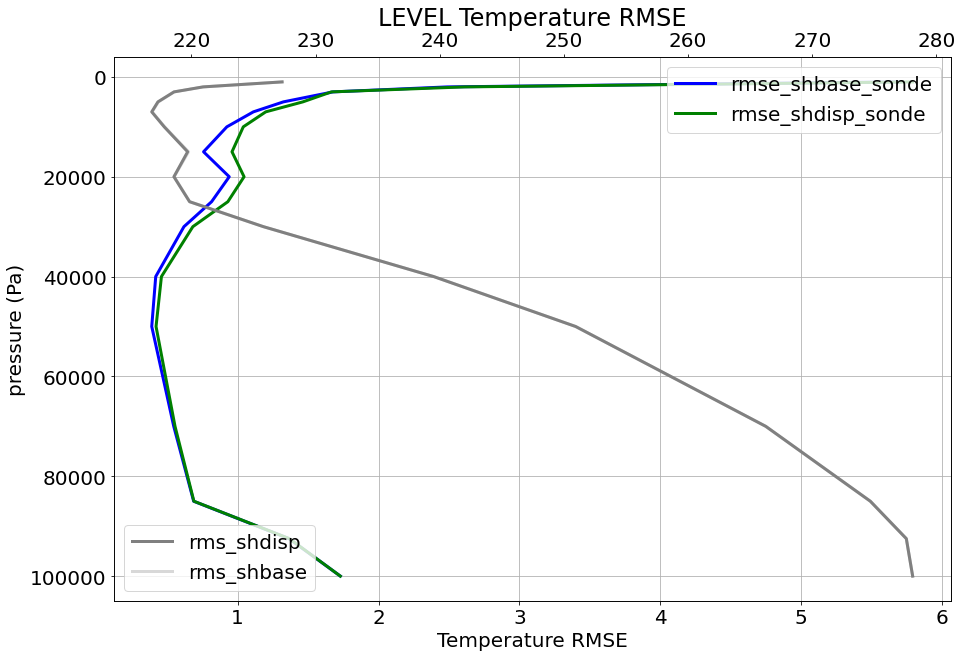

In [5]:
stat = '11035'
statlist = glob.glob('/mnt/users/scratch/leo/scratch/converted_v7/*' + stat + '*_CEUAS_merged_v1.nc')
df = eua.CDMDataset(filename = statlist[0]).to_dataframe(groups=['observations_table', 'era5fb'], variables=['latitude', 'longitude', 'observed_variable', 'observation_value', 'z_coordinate', 'date_time', 'fg_depar@body', 'an_depar@body'])
# 2020 only
df = df[df.date_time.dt.year == 2020]
df = df[df.date_time.dt.month == 1]
# df = df[np.isin(df.date_time.dt.month, [3,4,5,6,7,8,9,10,11])]
# night only -> ~ 00:00
df = df[np.isin(df.date_time.dt.hour,[23,0,1])]

from scipy.signal import savgol_filter
stdplevs = [100000,92500,85000,70000,50000,40000,30000,25000,20000,15000,10000,7000,5000,3000,2000,1000]
rmse_sum_shbase_sonde={}
rmse_sum_shbase_adjsonde={}
rmse_sum_shdisp_sonde={}
rmse_sum_shdisp_adjsonde={}
rms_sum_shbase={}
rms_sum_adjsonde={}
rms_sum_sonde={}
rms_sum_shdisp={}
plev_an_depar = {}
plev_sonde_minus_base = {}

for i in stdplevs:
    rmse_sum_shbase_sonde[i] = []
    rmse_sum_shbase_adjsonde[i] = []
    rmse_sum_shdisp_sonde[i] = []
    rmse_sum_shdisp_adjsonde[i] = []
    rms_sum_shbase[i] = []
    rms_sum_adjsonde[i] = []
    rms_sum_sonde[i] = []
    rms_sum_shdisp[i] = []
    plev_an_depar[i] = []
    plev_sonde_minus_base[i] = []
    
with open('model_dt_dec_reduced_prev_new.p', "rb") as input_file:
    model = pickle.load(input_file)

stats = ['11035', '72357', '50527']
months = [3,6,9,12]
for stat in stats:
    statlist = glob.glob('/mnt/users/scratch/leo/scratch/converted_v7/*' + stat + '*_CEUAS_merged_v1.nc')
    df = eua.CDMDataset(filename = statlist[0]).to_dataframe(groups=['observations_table', 'era5fb'], variables=['latitude', 'longitude', 'observed_variable', 'observation_value', 'z_coordinate', 'date_time', 'fg_depar@body', 'an_depar@body'])
    # 2020 only
    df_year = df[df.date_time.dt.year == 2020]
    for mon in months:
        df = df_year[df_year.date_time.dt.month == mon]
        # df = df[np.isin(df.date_time.dt.month, [3,4,5,6,7,8,9,10,11])]
        # night only -> ~ 00:00
        df = df[np.isin(df.date_time.dt.hour,[23,0,1])]

        for day in df.date_time.drop_duplicates():
            try:
                test = df[df.date_time == day]
                print(day)


                # read temperature and wind components from dataframe + merge them
                t = test[test.observed_variable == 85]
                t = t.rename(columns={'observation_value':'temperature'})
                t = t.drop(columns='observed_variable')

                u = test[test.observed_variable == 104]
                u = u.rename(columns={'observation_value':'u'})
                u = u.drop(columns=['observed_variable', 'fg_depar@body', 'an_depar@body'])

                v = test[test.observed_variable == 105]
                v = v.rename(columns={'observation_value':'v'})
                v = v.drop(columns=['observed_variable', 'fg_depar@body', 'an_depar@body'])

                input_data = pd.merge(t, u, on=['z_coordinate', 'latitude', 'longitude', 'date_time'])
                input_data = pd.merge(input_data, v, on=['z_coordinate', 'latitude', 'longitude', 'date_time'])
                input_data = input_data.reindex(index=input_data.index[::-1])
                input_data = input_data.dropna()


                #calculate displacements
                phys_model = trj.trajectory(lat=t.latitude.iloc[0], lon=t.longitude.iloc[0], temperature=np.array(input_data.temperature), u=np.array(input_data.u), v=np.array(input_data.v), pressure=np.array(input_data.z_coordinate))

                # write to dataframe
                input_data['z'] = np.array(trj.calc_height(np.array(input_data.temperature), np.array(input_data.z_coordinate), jump=False))
                input_data['calc_latd'] = np.array(phys_model[0])
                input_data['calc_lond'] = np.array(phys_model[1])
                test1 = [0] + list(input_data.calc_lond[:-1])
                test2 = [0] + list(input_data.calc_latd[:-1])
                input_data['prev_calc_lond']= test1
                input_data['prev_calc_latd']= test2
                input_data['lat_diff'] = np.array(input_data.calc_latd)- np.array(input_data.prev_calc_latd)
                input_data['lon_diff'] = np.array(input_data.calc_lond)- np.array(input_data.prev_calc_lond)
                input_data = input_data.dropna()


#                 # apply ml model for final displacements
#                 t1 = timer()
#                 out = model.predict(input_data[['temperature', 'z_coordinate', 'u', 'v', 'z','latitude', 'longitude' , 'calc_latd', 'calc_lond', 'prev_calc_lond', 'prev_calc_latd', 'lon_diff', 'lat_diff']])
#                 print('model predict', timer() - t1)
#                 ml_latd, ml_lond = out.transpose()
#                 filterlen = int(len(ml_latd)//2)
#                 if not (filterlen & 0x1):
#                     filterlen += 1
#                 input_data['ml_latd'] = ml_latd #np.array(savgol_filter(ml_latd, filterlen, 3))
#                 input_data['ml_lond'] = ml_lond #np.array(savgol_filter(ml_lond, filterlen, 3))
#                 input_data = input_data.reset_index()


#                 # loading the era5 sh temperature data
#                 if day.hour == 23:
#                     day = day + pd.Timedelta(days=1)
#                     day = day.replace(hour = 0)
#                 t3 = timer()
#                 ds = xr.open_dataset("./zarr_files/"+str(day.year)+f"{day.month:02d}"+f"{day.day:02d}"+f"{day.hour:02d}"+"00_chunked_file.zarr",chunks={'t':1})
#                 print('open t.zarr', timer() - t3)

#                 t5 = timer()
#                 base_t = ds.interp(latitude=[input_data.latitude[0]], longitude=[input_data.longitude[0]]).load().t
#                 print('read t', timer() - t5)
#                 display(base_t)


#                 # loading the era5 sh pressure data
#                 t6 = timer()
#                 ds_lnsp = xr.open_dataset("./zarr_files_lnsp/"+str(day.year)+f"{day.month:02d}"+f"{day.day:02d}"+f"{day.hour:02d}"+"00_chunked_file.zarr",chunks={'lnsp':1})
#                 print('open lnsp.zarr', timer() - t6)
#                 t4 = timer()
#                 lnsp = float(ds_lnsp.interp(latitude=[input_data.latitude[0]], longitude=[input_data.longitude[0]]).load().lnsp)
#                 print('read lnsp', timer() - t4)
#                 sp = np.exp(lnsp)

#                 t2 = timer()
#                 igrib = '/scratch/das/mayerj47/era5_sh/lnspana/'+str(day.year)+'/LNSPANASH'+str(day.year)+f"{day.month:02d}"+f"{day.day:02d}"+f"{day.hour:02d}"+'00.grib'
#                 f = open(igrib)
#                 msgid = codes_new_from_file(f, product_kind=CODES_PRODUCT_GRIB)
#                 pv = codes_get_array(msgid,'pv')
#                 print('get pv', timer() - t2)

#                 pv = np.array(pv)
#                 a = pv[:int(len(pv)/2)]
#                 b = pv[int(len(pv)/2):]
#                 p_half = a + b * sp
#                 p_ml = []
#                 for i in range(len(p_half)-1):
#                     p_ml.append((p_half[i] + p_half[i+1])/2.)
#                 p_ml = np.array(p_ml)


                # extracting the displaced temperatures out of the era5 sh data
                lon_d = vertical_interpolate(np.array(input_data.z_coordinate),np.array(input_data.ml_lond),stdplevs)
                lat_d = vertical_interpolate(np.array(input_data.z_coordinate),np.array(input_data.ml_latd),stdplevs)
                                
                c_lon_d = vertical_interpolate(np.array(input_data.z_coordinate),np.array(input_data.calc_lond),stdplevs)
                c_lat_d = vertical_interpolate(np.array(input_data.z_coordinate),np.array(input_data.calc_latd),stdplevs)    

                t_disp = []
                for i in range(len(stdplevs)):
                    now_lat = float(input_data.latitude[0]) - c_lat_d[i]
                    now_lon = float(input_data.longitude[0]) - c_lon_d[i]

                    ds_now = ds.interp(latitude=[now_lat], longitude=[now_lon]).load()
                    now_lnsp = float(ds_lnsp.interp(latitude=[now_lat], longitude=[now_lon]).load().lnsp)
                    now_sp = np.exp(now_lnsp)

                    now_p_half = a + b * now_sp
                    now_p_ml = []
                    for j in range(len(now_p_half)-1):
                        now_p_ml.append((now_p_half[j] + now_p_half[j+1])/2.)
                    now_p_ml = np.array(now_p_ml)

                    now_t_disp = vertical_interpolate(np.flip(now_p_ml),np.flip(np.squeeze(ds_now.t)),stdplevs)

                    t_disp.append(now_t_disp[i])


                print('lat: ', input_data.latitude[0], 'lon: ', input_data.longitude[0])
                print(stat)
                print(day)


                # interpolating all the temperatures to std plevs
                sq_t = np.squeeze(base_t)
                t_base = vertical_interpolate(np.flip(p_ml),np.flip(sq_t),stdplevs)
                t_disp = np.array(t_disp)
                t_sonde = vertical_interpolate(np.array(input_data.z_coordinate),np.array(input_data.temperature),stdplevs)
                an_depar_sonde = vertical_interpolate(np.array(input_data.z_coordinate),np.array(input_data['an_depar@body']),stdplevs)
                t_adjsonde = t_sonde - an_depar_sonde
                list_an_depar = list(an_depar_sonde)
                list_sonde_minus_base = list(t_sonde-t_base)
                print('phys lat_d [0]: ', np.array(input_data.calc_latd)[0])
                print('ml lat_d [0]: ', np.array(input_data.ml_latd)[0])
                print('phys lon_d [0]: ',np.array(input_data.calc_lond)[0])
                print('ml lon_d [0]: ',np.array(input_data.ml_lond)[0])



                # saving the rmse and rms differences
                for i in range(len(stdplevs)):
                    plev_an_depar[stdplevs[i]].append(an_depar_sonde[i])
                    plev_sonde_minus_base[stdplevs[i]].append(t_sonde[i]-t_base[i])
                    rmse_sum_shbase_sonde[stdplevs[i]].append(t_base[i] - t_sonde[i])
                    rmse_sum_shbase_adjsonde[stdplevs[i]].append(t_base[i] - t_adjsonde[i])
                    rmse_sum_shdisp_sonde[stdplevs[i]].append(t_disp[i] - t_sonde[i])
                    rmse_sum_shdisp_adjsonde[stdplevs[i]].append(t_disp[i] - t_adjsonde[i])
                    rms_sum_shbase[stdplevs[i]].append(t_base[i])
                    rms_sum_adjsonde[stdplevs[i]].append(t_adjsonde[i])
                    rms_sum_sonde[stdplevs[i]].append(t_sonde[i])
                    rms_sum_shdisp[stdplevs[i]].append(t_disp[i])



#                 # plotting level    
#                 fig, ax1 = maplt.subplots(1,2, figsize=(16, 8))
#                 ax1[0].plot(t_base, np.array(stdplevs), color = 'green', alpha = 0.6, label='base t')
#                 ax1[0].plot(t_disp, np.array(stdplevs), color = 'blue', alpha = 0.2,ls = '--', label='displaced t')
#                 ax1[0].plot(t_sonde, np.array(stdplevs), color = 'red', alpha = 0.2,ls = '--', label='t sonde')
#                 ax1[0].plot(t_adjsonde, np.array(stdplevs), color = 'orange', alpha = 0.6, label='t sonde - an_depar')

#             #     ax1_2 = ax1.twiny()
#             #     ax1_2.plot(np.array(list_an_depar),stdplevs,color='grey', label='an_depar')
#             #     ax1_2.plot(np.array(list_sonde_minus_base),stdplevs,color='grey',alpha=0.3, label='t (sonde - base)')
#             #     ax1_2.legend(loc = 'upper right')
#                 ax1[0].set_ylabel('pressure (Pa)')
#                 ax1[0].set_xlabel('temperature (K)')
#                 ax1[0].tick_params(axis='y')
#                 ax1[0].set_ylim(ax1[0].get_ylim()[::-1])
#                 ax1[0].legend()
#                 ax1[0].grid()

#                 ax1[1].plot(np.array(list_an_depar),stdplevs,color='grey', label='an_depar')
#                 ax1[1].plot(np.array(list_sonde_minus_base),stdplevs,color='grey',alpha=0.3, label='t (sonde - base)')

#                 ax1[1].legend()
#                 ax1[1].set_ylabel('pressure (Pa)')
#                 ax1[1].set_xlabel('temperature (K)')
#                 ax1[1].tick_params(axis='y')
#                 ax1[1].set_ylim(ax1[1].get_ylim()[::-1])
#                 ax1[1].legend()
#                 ax1[1].grid()
#                 maplt.show()
#                 maplt.close()

#                 fig, ax1 = maplt.subplots(1,2, figsize=(16, 8))
#                 ax1[0].plot(t_sonde - t_base, np.array(stdplevs), color = 'green', alpha = 0.6, label='sonde t - base t')
#                 ax1[0].plot(t_sonde - t_disp, np.array(stdplevs), color = 'blue', alpha = 0.2,ls = '--', label='sonde t - displaced t')
#                 ax1[0].set_ylabel('pressure (Pa)')
#                 ax1[0].set_xlabel('temperature (K)')
#                 ax1[0].tick_params(axis='y')
#                 ax1[0].set_ylim(ax1[0].get_ylim()[::-1])
#                 ax1[0].legend()
#                 ax1[0].grid()

#                 ax1[1].plot(np.array(lat_d),stdplevs,color='red', alpha=0.6, label='ml lat_disp')
#                 ax1[1].plot(np.array(lon_d),stdplevs,color='blue',alpha=0.6, label='ml lon_disp')
#                 ax1[1].plot(np.array(c_lat_d),stdplevs,color='red', alpha=0.3, label='calc lat_disp')
#                 ax1[1].plot(np.array(c_lon_d),stdplevs,color='blue',alpha=0.3, label='calc lon_disp')

#                 ax1[1].legend()
#                 ax1[1].set_ylabel('pressure (Pa)')
#                 ax1[1].set_xlabel('displacement (°)')
#                 ax1[1].tick_params(axis='y')
#                 ax1[1].set_ylim(ax1[1].get_ylim()[::-1])
#                 ax1[1].legend()
#                 ax1[1].grid()
#                 maplt.show()
#                 maplt.close()

#                 print('rmse sonde t - base t: ', np.sqrt(np.nanmean((np.array(t_sonde - t_base)**2))))
#                 print('rmse sonde t - displaced t: ', np.sqrt(np.nanmean((np.array(t_sonde - t_disp)**2))))
#                 print('---')
            except:
                pass
            


# preparing data for rmse plots
rmse_shbase_sonde=[]
rmse_shbase_adjsonde=[]
rmse_shdisp_sonde=[]
rmse_shdisp_adjsonde=[]

rms_shbase=[]
rms_adjsonde=[]
rms_sonde=[]
rms_shdisp=[]

for i in range(len(stdplevs)):
    rmse_shbase_sonde.append(np.sqrt(np.nanmean((np.array(rmse_sum_shbase_sonde[stdplevs[i]])**2))))
    print('rmse_shbase_sonde - plev: ', stdplevs[i], ' RMSE: ', rmse_shbase_sonde[-1])
    rmse_shbase_adjsonde.append(np.sqrt(np.nanmean((np.array(rmse_sum_shbase_adjsonde[stdplevs[i]])**2))))
    print('rmse_shbase_adjsonde - plev: ', stdplevs[i], ' RMSE: ', rmse_shbase_adjsonde[-1])
    rmse_shdisp_sonde.append(np.sqrt(np.nanmean((np.array(rmse_sum_shdisp_sonde[stdplevs[i]])**2))))
    print('rmse_shdisp_sonde - plev: ', stdplevs[i], ' RMSE: ', rmse_shdisp_sonde[-1])
    rmse_shdisp_adjsonde.append(np.sqrt(np.nanmean((np.array(rmse_sum_shdisp_adjsonde[stdplevs[i]])**2))))
    print('rmse_shdisp_adjsonde - plev: ', stdplevs[i], ' RMSE: ', rmse_shdisp_adjsonde[-1])
    
    rms_shbase.append(np.sqrt(np.nanmean((np.array(rms_sum_shbase[stdplevs[i]])**2))))
    print('rms_shbase - plev: ', stdplevs[i], ' RMS: ', rms_shbase[-1])
    rms_adjsonde.append(np.sqrt(np.nanmean((np.array(rms_sum_adjsonde[stdplevs[i]])**2))))
    print('rms_adjsonde - plev: ', stdplevs[i], ' RMS: ', rms_adjsonde[-1])
    rms_sonde.append(np.sqrt(np.nanmean((np.array(rms_sum_sonde[stdplevs[i]])**2))))
    print('rms_sonde - plev: ', stdplevs[i], ' RMS: ', rms_sonde[-1])
    rms_shdisp.append(np.sqrt(np.nanmean((np.array(rms_sum_shdisp[stdplevs[i]])**2))))
    print('rms_shdisp - plev: ', stdplevs[i], ' RMS: ', rms_shdisp[-1])

print('')


# rmse plot
fig, ax1 = maplt.subplots(figsize = (15,10))
ax1.plot(np.array(rmse_shbase_sonde),stdplevs,color = 'blue', label='rmse_shbase_sonde')
ax1.plot(np.array(rmse_shdisp_sonde),stdplevs, color='green', label='rmse_shdisp_sonde')
ax1_4 = ax1.twiny()
ax1_4.plot(np.array(rms_shdisp),stdplevs,color='grey', label='rms_shdisp')
ax1_4.plot(np.array(rms_shbase),stdplevs,color='grey',alpha=0.3, label='rms_shbase')
ax1_4.legend(loc='lower left')
ax1.set_ylim(ax1.get_ylim()[::-1])
ax1.set_ylabel('pressure (Pa)')
ax1.set_xlabel('Temperature RMSE')
ax1.legend(loc='upper right')
ax1.grid()

maplt.title('LEVEL Temperature RMSE')
maplt.show()
maplt.close()


In [1]:
input_data

NameError: name 'input_data' is not defined

In [ ]:
stats = ['10393']
months = [3,6,9,12]
for stat in stats:
    statlist = glob.glob('/mnt/users/scratch/leo/scratch/converted_v7/*' + stat + '*_CEUAS_merged_v1.nc')
    df = eua.CDMDataset(filename = statlist[0]).to_dataframe(groups=['observations_table', 'era5fb'], variables=['latitude', 'longitude', 'observed_variable', 'observation_value', 'z_coordinate', 'date_time', 'fg_depar@body', 'an_depar@body'])
    # 2020 only
    df_year = df[df.date_time.dt.year == 2020]
    display(df_year)

In [ ]:
df_year.observed_variable.drop_duplicates()

In [ ]:
# stat = '11035'
# statlist = glob.glob('/mnt/users/scratch/leo/scratch/converted_v7/*' + stat + '*_CEUAS_merged_v1.nc')
# df = eua.CDMDataset(filename = statlist[0]).to_dataframe(groups=['observations_table', 'era5fb'], variables=['latitude', 'longitude', 'observed_variable', 'observation_value', 'z_coordinate', 'date_time', 'fg_depar@body', 'an_depar@body'])
# # 2020 only
# df = df[df.date_time.dt.year == 2020]
# df = df[df.date_time.dt.month == 1]
# # df = df[np.isin(df.date_time.dt.month, [3,4,5,6,7,8,9,10,11])]
# # night only -> ~ 00:00
# df = df[np.isin(df.date_time.dt.hour,[23,0,1])]

from scipy.signal import savgol_filter
stdplevs = [100000,92500,85000,70000,50000,40000,30000,25000,20000,15000,10000,7000,5000,3000,2000,1000]
rmse_sum_shbase_sonde={}
rmse_sum_shbase_adjsonde={}
rmse_sum_shdisp_sonde={}
rmse_sum_shdisp_adjsonde={}
rms_sum_shbase={}
rms_sum_adjsonde={}
rms_sum_sonde={}
rms_sum_shdisp={}
plev_an_depar = {}
plev_sonde_minus_base = {}

for i in stdplevs:
    rmse_sum_shbase_sonde[i] = []
    rmse_sum_shbase_adjsonde[i] = []
    rmse_sum_shdisp_sonde[i] = []
    rmse_sum_shdisp_adjsonde[i] = []
    rms_sum_shbase[i] = []
    rms_sum_adjsonde[i] = []
    rms_sum_sonde[i] = []
    rms_sum_shdisp[i] = []
    plev_an_depar[i] = []
    plev_sonde_minus_base[i] = []
    
with open('model_dt_dec_reduced_prev_new.p', "rb") as input_file:
    model = pickle.load(input_file)

stats = ['11035', '72357', '50527', '10393']
months = [3,6,9,12]
for stat in stats:
    statlist = glob.glob('/mnt/users/scratch/leo/scratch/converted_v7/*' + stat + '*_CEUAS_merged_v1.nc')
    df = eua.CDMDataset(filename = statlist[0]).to_dataframe(groups=['observations_table', 'era5fb'], variables=['latitude', 'longitude', 'observed_variable', 'observation_value', 'z_coordinate', 'date_time', 'fg_depar@body', 'an_depar@body'])
    # 2020 only
    df_year = df[df.date_time.dt.year == 2020]
    for mon in months:
        df = df_year[df_year.date_time.dt.month == mon]
        # df = df[np.isin(df.date_time.dt.month, [3,4,5,6,7,8,9,10,11])]
        # night only -> ~ 00:00
        df = df[np.isin(df.date_time.dt.hour,[23,0,1])]

        for day in df.date_time.drop_duplicates():
            try:
                test = df[df.date_time == day]
                print(day)
    
                # read temperature and wind components from dataframe + merge them
                t = test[test.observed_variable == 85]
                t = t.rename(columns={'observation_value':'temperature'})
                t = t.drop(columns=['observed_variable', 'fg_depar@body', 'an_depar@body'])


                u = test[test.observed_variable == 104]
                u = u.rename(columns={'observation_value':'u'})
                u = u.drop(columns='observed_variable')

                v = test[test.observed_variable == 105]
                v = v.rename(columns={'observation_value':'v'})
                v = v.drop(columns=['observed_variable', 'fg_depar@body', 'an_depar@body'])

                input_data = pd.merge(t, u, on=['z_coordinate', 'latitude', 'longitude', 'date_time'])
                input_data = pd.merge(input_data, v, on=['z_coordinate', 'latitude', 'longitude', 'date_time'])
                input_data = input_data.reindex(index=input_data.index[::-1])
                input_data = input_data.dropna()


                #calculate displacements
                phys_model = trj.trajectory(lat=t.latitude.iloc[0], lon=t.longitude.iloc[0], temperature=np.array(input_data.temperature), u=np.array(input_data.u), v=np.array(input_data.v), pressure=np.array(input_data.z_coordinate))

                # write to dataframe
                input_data['z'] = np.array(trj.calc_height(np.array(input_data.temperature), np.array(input_data.z_coordinate), jump=False))
                input_data['calc_latd'] = np.array(phys_model[0])
                input_data['calc_lond'] = np.array(phys_model[1])
                test1 = [0] + list(input_data.calc_lond[:-1])
                test2 = [0] + list(input_data.calc_latd[:-1])
                input_data['prev_calc_lond']= test1
                input_data['prev_calc_latd']= test2
                input_data['lat_diff'] = np.array(input_data.calc_latd)- np.array(input_data.prev_calc_latd)
                input_data['lon_diff'] = np.array(input_data.calc_lond)- np.array(input_data.prev_calc_lond)
                input_data = input_data.dropna()


                # apply ml model for final displacements
                t1 = timer()
                out = model.predict(input_data[['temperature', 'z_coordinate', 'u', 'v', 'z','latitude', 'longitude' , 'calc_latd', 'calc_lond', 'prev_calc_lond', 'prev_calc_latd', 'lon_diff', 'lat_diff']])
                print('model predict', timer() - t1)
                ml_latd, ml_lond = out.transpose()
                filterlen = int(len(ml_latd)//2)
                if not (filterlen & 0x1):
                    filterlen += 1
                input_data['ml_latd'] = ml_latd #np.array(savgol_filter(ml_latd, filterlen, 3))
                input_data['ml_lond'] = ml_lond #np.array(savgol_filter(ml_lond, filterlen, 3))
                input_data = input_data.reset_index()


                # loading the era5 sh temperature data
                if day.hour == 23:
                    day = day + pd.Timedelta(days=1)
                    day = day.replace(hour = 0)
                t3 = timer()
                ds = xr.open_dataset("./WIND/"+str(day.year)+f"{day.month:02d}"+f"{day.day:02d}"+f"{day.hour:02d}"+"00_chunked_file.zarr",chunks={'t':1})
                print('open t.zarr', timer() - t3)

                t5 = timer()
                base_t = ds.interp(latitude=[input_data.latitude[0]], longitude=[input_data.longitude[0]]).load().u
                print('read t', timer() - t5)


                # loading the era5 sh pressure data
                t6 = timer()
                ds_lnsp = xr.open_dataset("./zarr_files_lnsp/"+str(day.year)+f"{day.month:02d}"+f"{day.day:02d}"+f"{day.hour:02d}"+"00_chunked_file.zarr",chunks={'lnsp':1})
                print('open lnsp.zarr', timer() - t6)
                t4 = timer()
                lnsp = float(ds_lnsp.interp(latitude=[input_data.latitude[0]], longitude=[input_data.longitude[0]]).load().lnsp)
                print('read lnsp', timer() - t4)
                sp = np.exp(lnsp)

                t2 = timer()
                igrib = '/scratch/das/mayerj47/era5_sh/lnspana/'+str(day.year)+'/LNSPANASH'+str(day.year)+f"{day.month:02d}"+f"{day.day:02d}"+f"{day.hour:02d}"+'00.grib'
                f = open(igrib)
                msgid = codes_new_from_file(f, product_kind=CODES_PRODUCT_GRIB)
                pv = codes_get_array(msgid,'pv')
                print('get pv', timer() - t2)

                pv = np.array(pv)
                a = pv[:int(len(pv)/2)]
                b = pv[int(len(pv)/2):]
                p_half = a + b * sp
                p_ml = []
                for i in range(len(p_half)-1):
                    p_ml.append((p_half[i] + p_half[i+1])/2.)
                p_ml = np.array(p_ml)


                # extracting the displaced temperatures out of the era5 sh data
                lon_d = vertical_interpolate(np.array(input_data.z_coordinate),np.array(input_data.ml_lond),stdplevs)
                c_lon_d = vertical_interpolate(np.array(input_data.z_coordinate),np.array(input_data.calc_lond),stdplevs)
                lat_d = vertical_interpolate(np.array(input_data.z_coordinate),np.array(input_data.ml_latd),stdplevs)
                c_lat_d = vertical_interpolate(np.array(input_data.z_coordinate),np.array(input_data.calc_latd),stdplevs)    

                t_disp = []
                for i in range(len(stdplevs)):
                    now_lat = float(input_data.latitude[0]) - c_lat_d[i]
                    now_lon = float(input_data.longitude[0]) - c_lon_d[i]

                    ds_now = ds.interp(latitude=[now_lat], longitude=[now_lon]).load()
                    now_lnsp = float(ds_lnsp.interp(latitude=[now_lat], longitude=[now_lon]).load().lnsp)
                    now_sp = np.exp(now_lnsp)

                    now_p_half = a + b * now_sp
                    now_p_ml = []
                    for j in range(len(now_p_half)-1):
                        now_p_ml.append((now_p_half[j] + now_p_half[j+1])/2.)
                    now_p_ml = np.array(now_p_ml)

                    now_t_disp = vertical_interpolate(np.flip(now_p_ml),np.flip(np.squeeze(ds_now.u)),stdplevs)

                    t_disp.append(now_t_disp[i])


                print('lat: ', input_data.latitude[0], 'lon: ', input_data.longitude[0])
                print(stat)
                print(day)


                # interpolating all the temperatures to std plevs
                sq_t = np.squeeze(base_t)
                t_base = vertical_interpolate(np.flip(p_ml),np.flip(sq_t),stdplevs)
                t_disp = np.array(t_disp)
                t_sonde = vertical_interpolate(np.array(input_data.z_coordinate),np.array(input_data.u),stdplevs)
                an_depar_sonde = vertical_interpolate(np.array(input_data.z_coordinate),np.array(input_data['an_depar@body']),stdplevs)
                t_adjsonde = t_sonde - an_depar_sonde
                list_an_depar = list(an_depar_sonde)
                list_sonde_minus_base = list(t_sonde-t_base)
                print('phys lat_d [0]: ', np.array(input_data.calc_latd)[0])
                print('ml lat_d [0]: ', np.array(input_data.ml_latd)[0])
                print('phys lon_d [0]: ',np.array(input_data.calc_lond)[0])
                print('ml lon_d [0]: ',np.array(input_data.ml_lond)[0])



                # saving the rmse and rms differences
                for i in range(len(stdplevs)):
                    plev_an_depar[stdplevs[i]].append(an_depar_sonde[i])
                    plev_sonde_minus_base[stdplevs[i]].append(t_sonde[i]-t_base[i])
                    rmse_sum_shbase_sonde[stdplevs[i]].append(t_base[i] - t_sonde[i])
                    rmse_sum_shbase_adjsonde[stdplevs[i]].append(t_base[i] - t_adjsonde[i])
                    rmse_sum_shdisp_sonde[stdplevs[i]].append(t_disp[i] - t_sonde[i])
                    rmse_sum_shdisp_adjsonde[stdplevs[i]].append(t_disp[i] - t_adjsonde[i])
                    rms_sum_shbase[stdplevs[i]].append(t_base[i])
                    rms_sum_adjsonde[stdplevs[i]].append(t_adjsonde[i])
                    rms_sum_sonde[stdplevs[i]].append(t_sonde[i])
                    rms_sum_shdisp[stdplevs[i]].append(t_disp[i])
            except:
                pass



#                 # plotting level    
#                 fig, ax1 = maplt.subplots(1,2, figsize=(16, 8))
#                 ax1[0].plot(t_base, np.array(stdplevs), color = 'green', alpha = 0.6, label='base u')
#                 ax1[0].plot(t_disp, np.array(stdplevs), color = 'blue', alpha = 0.2,ls = '--', label='displaced u')
#                 ax1[0].plot(t_sonde, np.array(stdplevs), color = 'red', alpha = 0.2,ls = '--', label='u sonde')
#                 ax1[0].plot(t_adjsonde, np.array(stdplevs), color = 'orange', alpha = 0.6, label='u sonde - an_depar')

#             #     ax1_2 = ax1.twiny()
#             #     ax1_2.plot(np.array(list_an_depar),stdplevs,color='grey', label='an_depar')
#             #     ax1_2.plot(np.array(list_sonde_minus_base),stdplevs,color='grey',alpha=0.3, label='t (sonde - base)')
#             #     ax1_2.legend(loc = 'upper right')
#                 ax1[0].set_ylabel('pressure (Pa)')
#                 ax1[0].set_xlabel('u (m/s)')
#                 ax1[0].tick_params(axis='y')
#                 ax1[0].set_ylim(ax1[0].get_ylim()[::-1])
#                 ax1[0].legend()
#                 ax1[0].grid()

#                 ax1[1].plot(np.array(list_an_depar),stdplevs,color='grey', label='an_depar')
#                 ax1[1].plot(np.array(list_sonde_minus_base),stdplevs,color='grey',alpha=0.3, label='u (sonde - base)')

#                 ax1[1].legend()
#                 ax1[1].set_ylabel('pressure (Pa)')
#                 ax1[1].set_xlabel('u (m/s)')
#                 ax1[1].tick_params(axis='y')
#                 ax1[1].set_ylim(ax1[1].get_ylim()[::-1])
#                 ax1[1].legend()
#                 ax1[1].grid()
#                 maplt.show()
#                 maplt.close()

#                 fig, ax1 = maplt.subplots(1,2, figsize=(16, 8))
#                 ax1[0].plot(t_sonde - t_base, np.array(stdplevs), color = 'green', alpha = 0.6, label='sonde u - base u')
#                 ax1[0].plot(t_sonde - t_disp, np.array(stdplevs), color = 'blue', alpha = 0.2,ls = '--', label='sonde u - displaced u')
#                 ax1[0].set_ylabel('pressure (Pa)')
#                 ax1[0].set_xlabel('u (m/s)')
#                 ax1[0].tick_params(axis='y')
#                 ax1[0].set_ylim(ax1[0].get_ylim()[::-1])
#                 ax1[0].legend()
#                 ax1[0].grid()

#                 ax1[1].plot(np.array(lat_d),stdplevs,color='red', alpha=0.6, label='ml lat_disp')
#                 ax1[1].plot(np.array(lon_d),stdplevs,color='blue',alpha=0.6, label='ml lon_disp')
#                 ax1[1].plot(np.array(c_lat_d),stdplevs,color='red', alpha=0.3, label='calc lat_disp')
#                 ax1[1].plot(np.array(c_lon_d),stdplevs,color='blue',alpha=0.3, label='calc lon_disp')

#                 ax1[1].legend()
#                 ax1[1].set_ylabel('pressure (Pa)')
#                 ax1[1].set_xlabel('displacement (°)')
#                 ax1[1].tick_params(axis='y')
#                 ax1[1].set_ylim(ax1[1].get_ylim()[::-1])
#                 ax1[1].legend()
#                 ax1[1].grid()
#                 maplt.show()
#                 maplt.close()

#                 print('rmse sonde u - base u: ', np.sqrt(np.nanmean((np.array(t_sonde - t_base)**2))))
#                 print('rmse sonde u - displaced u: ', np.sqrt(np.nanmean((np.array(t_sonde - t_disp)**2))))
#                 print('---')


# preparing data for rmse plots
rmse_shbase_sonde=[]
rmse_shbase_adjsonde=[]
rmse_shdisp_sonde=[]
rmse_shdisp_adjsonde=[]

rms_shbase=[]
rms_adjsonde=[]
rms_sonde=[]
rms_shdisp=[]

for i in range(len(stdplevs)):
    rmse_shbase_sonde.append(np.sqrt(np.nanmean((np.array(rmse_sum_shbase_sonde[stdplevs[i]])**2))))
    print('rmse_shbase_sonde - plev: ', stdplevs[i], ' RMSE: ', rmse_shbase_sonde[-1])
    rmse_shbase_adjsonde.append(np.sqrt(np.nanmean((np.array(rmse_sum_shbase_adjsonde[stdplevs[i]])**2))))
    print('rmse_shbase_adjsonde - plev: ', stdplevs[i], ' RMSE: ', rmse_shbase_adjsonde[-1])
    rmse_shdisp_sonde.append(np.sqrt(np.nanmean((np.array(rmse_sum_shdisp_sonde[stdplevs[i]])**2))))
    print('rmse_shdisp_sonde - plev: ', stdplevs[i], ' RMSE: ', rmse_shdisp_sonde[-1])
    rmse_shdisp_adjsonde.append(np.sqrt(np.nanmean((np.array(rmse_sum_shdisp_adjsonde[stdplevs[i]])**2))))
    print('rmse_shdisp_adjsonde - plev: ', stdplevs[i], ' RMSE: ', rmse_shdisp_adjsonde[-1])
    
    rms_shbase.append(np.sqrt(np.nanmean((np.array(rms_sum_shbase[stdplevs[i]])**2))))
    print('rms_shbase - plev: ', stdplevs[i], ' RMS: ', rms_shbase[-1])
    rms_adjsonde.append(np.sqrt(np.nanmean((np.array(rms_sum_adjsonde[stdplevs[i]])**2))))
    print('rms_adjsonde - plev: ', stdplevs[i], ' RMS: ', rms_adjsonde[-1])
    rms_sonde.append(np.sqrt(np.nanmean((np.array(rms_sum_sonde[stdplevs[i]])**2))))
    print('rms_sonde - plev: ', stdplevs[i], ' RMS: ', rms_sonde[-1])
    rms_shdisp.append(np.sqrt(np.nanmean((np.array(rms_sum_shdisp[stdplevs[i]])**2))))
    print('rms_shdisp - plev: ', stdplevs[i], ' RMS: ', rms_shdisp[-1])

print('')


# rmse plot
fig, ax1 = maplt.subplots(figsize = (15,10))
ax1.plot(np.array(rmse_shbase_sonde),stdplevs,color = 'blue', label='rmse_shbase_sonde')
ax1.plot(np.array(rmse_shdisp_sonde),stdplevs, color='green', label='rmse_shdisp_sonde')
ax1_4 = ax1.twiny()
ax1_4.plot(np.array(rms_shdisp),stdplevs,color='grey', label='rms_shdisp')
ax1_4.plot(np.array(rms_shbase),stdplevs,color='grey',alpha=0.3, label='rms_shbase')
ax1_4.legend(loc='lower left')
ax1.set_ylim(ax1.get_ylim()[::-1])
ax1.set_ylabel('pressure (Pa)')
ax1.set_xlabel('u RMSE')
ax1.legend(loc='upper right')
ax1.grid()

maplt.title('LEVEL u RMSE')
maplt.show()
maplt.close()


In [ ]:
# stat = '11035'
# statlist = glob.glob('/mnt/users/scratch/leo/scratch/converted_v7/*' + stat + '*_CEUAS_merged_v1.nc')
# df = eua.CDMDataset(filename = statlist[0]).to_dataframe(groups=['observations_table', 'era5fb'], variables=['latitude', 'longitude', 'observed_variable', 'observation_value', 'z_coordinate', 'date_time', 'fg_depar@body', 'an_depar@body'])
# # 2020 only
# df = df[df.date_time.dt.year == 2020]
# df = df[df.date_time.dt.month == 1]
# # df = df[np.isin(df.date_time.dt.month, [3,4,5,6,7,8,9,10,11])]
# # night only -> ~ 00:00
# df = df[np.isin(df.date_time.dt.hour,[23,0,1])]

from scipy.signal import savgol_filter
stdplevs = [100000,92500,85000,70000,50000,40000,30000,25000,20000,15000,10000,7000,5000,3000,2000,1000]
rmse_sum_shbase_sonde={}
rmse_sum_shbase_adjsonde={}
rmse_sum_shdisp_sonde={}
rmse_sum_shdisp_adjsonde={}
rms_sum_shbase={}
rms_sum_adjsonde={}
rms_sum_sonde={}
rms_sum_shdisp={}
plev_an_depar = {}
plev_sonde_minus_base = {}

for i in stdplevs:
    rmse_sum_shbase_sonde[i] = []
    rmse_sum_shbase_adjsonde[i] = []
    rmse_sum_shdisp_sonde[i] = []
    rmse_sum_shdisp_adjsonde[i] = []
    rms_sum_shbase[i] = []
    rms_sum_adjsonde[i] = []
    rms_sum_sonde[i] = []
    rms_sum_shdisp[i] = []
    plev_an_depar[i] = []
    plev_sonde_minus_base[i] = []
    
with open('model_dt_dec_reduced_prev_new.p', "rb") as input_file:
    model = pickle.load(input_file)

stats = ['11035', '72357', '50527', '10393']
months = [3,6,9,12]
for stat in stats:
    statlist = glob.glob('/mnt/users/scratch/leo/scratch/converted_v7/*' + stat + '*_CEUAS_merged_v1.nc')
    df = eua.CDMDataset(filename = statlist[0]).to_dataframe(groups=['observations_table', 'era5fb'], variables=['latitude', 'longitude', 'observed_variable', 'observation_value', 'z_coordinate', 'date_time', 'fg_depar@body', 'an_depar@body'])
    # 2020 only
    df_year = df[df.date_time.dt.year == 2020]
    for mon in months:
        df = df_year[df_year.date_time.dt.month == mon]
        # df = df[np.isin(df.date_time.dt.month, [3,4,5,6,7,8,9,10,11])]
        # night only -> ~ 00:00
        df = df[np.isin(df.date_time.dt.hour,[23,0,1])]

        for day in df.date_time.drop_duplicates():
            try:
                test = df[df.date_time == day]
                print(day)
                   
                # read temperature and wind components from dataframe + merge them
                t = test[test.observed_variable == 85]
                t = t.rename(columns={'observation_value':'temperature'})
                t = t.drop(columns=['observed_variable', 'fg_depar@body', 'an_depar@body'])


                u = test[test.observed_variable == 104]
                u = u.rename(columns={'observation_value':'u'})
                u = u.drop(columns=['observed_variable', 'fg_depar@body', 'an_depar@body'])

                v = test[test.observed_variable == 105]
                v = v.rename(columns={'observation_value':'v'})
                v = v.drop(columns='observed_variable')


                input_data = pd.merge(t, u, on=['z_coordinate', 'latitude', 'longitude', 'date_time'])
                input_data = pd.merge(input_data, v, on=['z_coordinate', 'latitude', 'longitude', 'date_time'])
                input_data = input_data.reindex(index=input_data.index[::-1])
                input_data = input_data.dropna()


                #calculate displacements
                phys_model = trj.trajectory(lat=t.latitude.iloc[0], lon=t.longitude.iloc[0], temperature=np.array(input_data.temperature), u=np.array(input_data.u), v=np.array(input_data.v), pressure=np.array(input_data.z_coordinate))

                # write to dataframe
                input_data['z'] = np.array(trj.calc_height(np.array(input_data.temperature), np.array(input_data.z_coordinate), jump=False))
                input_data['calc_latd'] = np.array(phys_model[0])
                input_data['calc_lond'] = np.array(phys_model[1])
                test1 = [0] + list(input_data.calc_lond[:-1])
                test2 = [0] + list(input_data.calc_latd[:-1])
                input_data['prev_calc_lond']= test1
                input_data['prev_calc_latd']= test2
                input_data['lat_diff'] = np.array(input_data.calc_latd)- np.array(input_data.prev_calc_latd)
                input_data['lon_diff'] = np.array(input_data.calc_lond)- np.array(input_data.prev_calc_lond)
                input_data = input_data.dropna()


                # apply ml model for final displacements
                t1 = timer()
                out = model.predict(input_data[['temperature', 'z_coordinate', 'u', 'v', 'z','latitude', 'longitude' , 'calc_latd', 'calc_lond', 'prev_calc_lond', 'prev_calc_latd', 'lon_diff', 'lat_diff']])
                print('model predict', timer() - t1)
                ml_latd, ml_lond = out.transpose()
                filterlen = int(len(ml_latd)//2)
                if not (filterlen & 0x1):
                    filterlen += 1
                input_data['ml_latd'] = ml_latd #np.array(savgol_filter(ml_latd, filterlen, 3))
                input_data['ml_lond'] = ml_lond #np.array(savgol_filter(ml_lond, filterlen, 3))
                input_data = input_data.reset_index()


                # loading the era5 sh temperature data
                if day.hour == 23:
                    day = day + pd.Timedelta(days=1)
                    day = day.replace(hour = 0)
                t3 = timer()
                ds = xr.open_dataset("./WIND/"+str(day.year)+f"{day.month:02d}"+f"{day.day:02d}"+f"{day.hour:02d}"+"00_chunked_file.zarr",chunks={'t':1})
                print('open t.zarr', timer() - t3)

                t5 = timer()
                base_t = ds.interp(latitude=[input_data.latitude[0]], longitude=[input_data.longitude[0]]).load().v
                print('read t', timer() - t5)


                # loading the era5 sh pressure data
                t6 = timer()
                ds_lnsp = xr.open_dataset("./zarr_files_lnsp/"+str(day.year)+f"{day.month:02d}"+f"{day.day:02d}"+f"{day.hour:02d}"+"00_chunked_file.zarr",chunks={'lnsp':1})
                print('open lnsp.zarr', timer() - t6)
                t4 = timer()
                lnsp = float(ds_lnsp.interp(latitude=[input_data.latitude[0]], longitude=[input_data.longitude[0]]).load().lnsp)
                print('read lnsp', timer() - t4)
                sp = np.exp(lnsp)

                t2 = timer()
                igrib = '/scratch/das/mayerj47/era5_sh/lnspana/'+str(day.year)+'/LNSPANASH'+str(day.year)+f"{day.month:02d}"+f"{day.day:02d}"+f"{day.hour:02d}"+'00.grib'
                f = open(igrib)
                msgid = codes_new_from_file(f, product_kind=CODES_PRODUCT_GRIB)
                pv = codes_get_array(msgid,'pv')
                print('get pv', timer() - t2)

                pv = np.array(pv)
                a = pv[:int(len(pv)/2)]
                b = pv[int(len(pv)/2):]
                p_half = a + b * sp
                p_ml = []
                for i in range(len(p_half)-1):
                    p_ml.append((p_half[i] + p_half[i+1])/2.)
                p_ml = np.array(p_ml)


                # extracting the displaced temperatures out of the era5 sh data
                lon_d = vertical_interpolate(np.array(input_data.z_coordinate),np.array(input_data.ml_lond),stdplevs)
                c_lon_d = vertical_interpolate(np.array(input_data.z_coordinate),np.array(input_data.calc_lond),stdplevs)
                lat_d = vertical_interpolate(np.array(input_data.z_coordinate),np.array(input_data.ml_latd),stdplevs)
                c_lat_d = vertical_interpolate(np.array(input_data.z_coordinate),np.array(input_data.calc_latd),stdplevs)    

                t_disp = []
                for i in range(len(stdplevs)):
                    now_lat = float(input_data.latitude[0]) - c_lat_d[i]
                    now_lon = float(input_data.longitude[0]) - c_lon_d[i]

                    ds_now = ds.interp(latitude=[now_lat], longitude=[now_lon]).load()
                    now_lnsp = float(ds_lnsp.interp(latitude=[now_lat], longitude=[now_lon]).load().lnsp)
                    now_sp = np.exp(now_lnsp)

                    now_p_half = a + b * now_sp
                    now_p_ml = []
                    for j in range(len(now_p_half)-1):
                        now_p_ml.append((now_p_half[j] + now_p_half[j+1])/2.)
                    now_p_ml = np.array(now_p_ml)

                    now_t_disp = vertical_interpolate(np.flip(now_p_ml),np.flip(np.squeeze(ds_now.v)),stdplevs)

                    t_disp.append(now_t_disp[i])


                print('lat: ', input_data.latitude[0], 'lon: ', input_data.longitude[0])
                print(stat)
                print(day)


                # interpolating all the temperatures to std plevs
                sq_t = np.squeeze(base_t)
                t_base = vertical_interpolate(np.flip(p_ml),np.flip(sq_t),stdplevs)
                t_disp = np.array(t_disp)
                t_sonde = vertical_interpolate(np.array(input_data.z_coordinate),np.array(input_data.v),stdplevs)
                an_depar_sonde = vertical_interpolate(np.array(input_data.z_coordinate),np.array(input_data['an_depar@body']),stdplevs)
                t_adjsonde = t_sonde - an_depar_sonde
                list_an_depar = list(an_depar_sonde)
                list_sonde_minus_base = list(t_sonde-t_base)
                print('phys lat_d [0]: ', np.array(input_data.calc_latd)[0])
                print('ml lat_d [0]: ', np.array(input_data.ml_latd)[0])
                print('phys lon_d [0]: ',np.array(input_data.calc_lond)[0])
                print('ml lon_d [0]: ',np.array(input_data.ml_lond)[0])



                # saving the rmse and rms differences
                for i in range(len(stdplevs)):
                    plev_an_depar[stdplevs[i]].append(an_depar_sonde[i])
                    plev_sonde_minus_base[stdplevs[i]].append(t_sonde[i]-t_base[i])
                    rmse_sum_shbase_sonde[stdplevs[i]].append(t_base[i] - t_sonde[i])
                    rmse_sum_shbase_adjsonde[stdplevs[i]].append(t_base[i] - t_adjsonde[i])
                    rmse_sum_shdisp_sonde[stdplevs[i]].append(t_disp[i] - t_sonde[i])
                    rmse_sum_shdisp_adjsonde[stdplevs[i]].append(t_disp[i] - t_adjsonde[i])
                    rms_sum_shbase[stdplevs[i]].append(t_base[i])
                    rms_sum_adjsonde[stdplevs[i]].append(t_adjsonde[i])
                    rms_sum_sonde[stdplevs[i]].append(t_sonde[i])
                    rms_sum_shdisp[stdplevs[i]].append(t_disp[i])
            except:
                pass


#                 # plotting level    
#                 fig, ax1 = maplt.subplots(1,2, figsize=(16, 8))
#                 ax1[0].plot(t_base, np.array(stdplevs), color = 'green', alpha = 0.6, label='base v')
#                 ax1[0].plot(t_disp, np.array(stdplevs), color = 'blue', alpha = 0.2,ls = '--', label='displaced v')
#                 ax1[0].plot(t_sonde, np.array(stdplevs), color = 'red', alpha = 0.2,ls = '--', label='v sonde')
#                 ax1[0].plot(t_adjsonde, np.array(stdplevs), color = 'orange', alpha = 0.6, label='v sonde - an_depar')

#             #     ax1_2 = ax1.twiny()
#             #     ax1_2.plot(np.array(list_an_depar),stdplevs,color='grey', label='an_depar')
#             #     ax1_2.plot(np.array(list_sonde_minus_base),stdplevs,color='grey',alpha=0.3, label='t (sonde - base)')
#             #     ax1_2.legend(loc = 'upper right')
#                 ax1[0].set_ylabel('pressure (Pa)')
#                 ax1[0].set_xlabel('v (m/s)')
#                 ax1[0].tick_params(axis='y')
#                 ax1[0].set_ylim(ax1[0].get_ylim()[::-1])
#                 ax1[0].legend()
#                 ax1[0].grid()

#                 ax1[1].plot(np.array(list_an_depar),stdplevs,color='grey', label='an_depar')
#                 ax1[1].plot(np.array(list_sonde_minus_base),stdplevs,color='grey',alpha=0.3, label='v (sonde - base)')

#                 ax1[1].legend()
#                 ax1[1].set_ylabel('pressure (Pa)')
#                 ax1[1].set_xlabel('v (m/s)')
#                 ax1[1].tick_params(axis='y')
#                 ax1[1].set_ylim(ax1[1].get_ylim()[::-1])
#                 ax1[1].legend()
#                 ax1[1].grid()
#                 maplt.show()
#                 maplt.close()

#                 fig, ax1 = maplt.subplots(1,2, figsize=(16, 8))
#                 ax1[0].plot(t_sonde - t_base, np.array(stdplevs), color = 'green', alpha = 0.6, label='sonde v - base v')
#                 ax1[0].plot(t_sonde - t_disp, np.array(stdplevs), color = 'blue', alpha = 0.2,ls = '--', label='sonde v - displaced v')
#                 ax1[0].set_ylabel('pressure (Pa)')
#                 ax1[0].set_xlabel('v (m/s)')
#                 ax1[0].tick_params(axis='y')
#                 ax1[0].set_ylim(ax1[0].get_ylim()[::-1])
#                 ax1[0].legend()
#                 ax1[0].grid()

#                 ax1[1].plot(np.array(lat_d),stdplevs,color='red', alpha=0.6, label='ml lat_disp')
#                 ax1[1].plot(np.array(lon_d),stdplevs,color='blue',alpha=0.6, label='ml lon_disp')
#                 ax1[1].plot(np.array(c_lat_d),stdplevs,color='red', alpha=0.3, label='calc lat_disp')
#                 ax1[1].plot(np.array(c_lon_d),stdplevs,color='blue',alpha=0.3, label='calc lon_disp')

#                 ax1[1].legend()
#                 ax1[1].set_ylabel('pressure (Pa)')
#                 ax1[1].set_xlabel('displacement (°)')
#                 ax1[1].tick_params(axis='y')
#                 ax1[1].set_ylim(ax1[1].get_ylim()[::-1])
#                 ax1[1].legend()
#                 ax1[1].grid()
#                 maplt.show()
#                 maplt.close()

#                 print('rmse sonde v - base v: ', np.sqrt(np.nanmean((np.array(t_sonde - t_base)**2))))
#                 print('rmse sonde v - displaced v: ', np.sqrt(np.nanmean((np.array(t_sonde - t_disp)**2))))
#                 print('---')


# preparing data for rmse plots
rmse_shbase_sonde=[]
rmse_shbase_adjsonde=[]
rmse_shdisp_sonde=[]
rmse_shdisp_adjsonde=[]

rms_shbase=[]
rms_adjsonde=[]
rms_sonde=[]
rms_shdisp=[]

for i in range(len(stdplevs)):
    rmse_shbase_sonde.append(np.sqrt(np.nanmean((np.array(rmse_sum_shbase_sonde[stdplevs[i]])**2))))
    print('rmse_shbase_sonde - plev: ', stdplevs[i], ' RMSE: ', rmse_shbase_sonde[-1])
    rmse_shbase_adjsonde.append(np.sqrt(np.nanmean((np.array(rmse_sum_shbase_adjsonde[stdplevs[i]])**2))))
    print('rmse_shbase_adjsonde - plev: ', stdplevs[i], ' RMSE: ', rmse_shbase_adjsonde[-1])
    rmse_shdisp_sonde.append(np.sqrt(np.nanmean((np.array(rmse_sum_shdisp_sonde[stdplevs[i]])**2))))
    print('rmse_shdisp_sonde - plev: ', stdplevs[i], ' RMSE: ', rmse_shdisp_sonde[-1])
    rmse_shdisp_adjsonde.append(np.sqrt(np.nanmean((np.array(rmse_sum_shdisp_adjsonde[stdplevs[i]])**2))))
    print('rmse_shdisp_adjsonde - plev: ', stdplevs[i], ' RMSE: ', rmse_shdisp_adjsonde[-1])
    
    rms_shbase.append(np.sqrt(np.nanmean((np.array(rms_sum_shbase[stdplevs[i]])**2))))
    print('rms_shbase - plev: ', stdplevs[i], ' RMS: ', rms_shbase[-1])
    rms_adjsonde.append(np.sqrt(np.nanmean((np.array(rms_sum_adjsonde[stdplevs[i]])**2))))
    print('rms_adjsonde - plev: ', stdplevs[i], ' RMS: ', rms_adjsonde[-1])
    rms_sonde.append(np.sqrt(np.nanmean((np.array(rms_sum_sonde[stdplevs[i]])**2))))
    print('rms_sonde - plev: ', stdplevs[i], ' RMS: ', rms_sonde[-1])
    rms_shdisp.append(np.sqrt(np.nanmean((np.array(rms_sum_shdisp[stdplevs[i]])**2))))
    print('rms_shdisp - plev: ', stdplevs[i], ' RMS: ', rms_shdisp[-1])

print('')


# rmse plot
fig, ax1 = maplt.subplots(figsize = (15,10))
ax1.plot(np.array(rmse_shbase_sonde),stdplevs,color = 'blue', label='rmse_shbase_sonde')
ax1.plot(np.array(rmse_shdisp_sonde),stdplevs, color='green', label='rmse_shdisp_sonde')
ax1_4 = ax1.twiny()
ax1_4.plot(np.array(rms_shdisp),stdplevs,color='grey', label='rms_shdisp')
ax1_4.plot(np.array(rms_shbase),stdplevs,color='grey',alpha=0.3, label='rms_shbase')
ax1_4.legend(loc='lower left')
ax1.set_ylim(ax1.get_ylim()[::-1])
ax1.set_ylabel('pressure (Pa)')
ax1.set_xlabel('v RMSE')
ax1.legend(loc='upper right')
ax1.grid()

maplt.title('LEVEL v RMSE')
maplt.show()
maplt.close()
